# Document description

Project name: **Deep Exemplar based Colorization**  
Project author: **Tomasz Ostaszewicz**  


The following project was written as a thesis for the course: "Deep Neural Networks - applications in digital media", which took place at 2019/2020 at Warsaw University of Technology, Warsaw, Poland. Architecture of the models used in the project are based on the paper: "Deep Exemplar-based Colorization". The paper can be found at the link: [Deep Exemplar-based Colorization](https://arxiv.org/pdf/1807.06587.pdf). Detailed description of the project including models' architectures and results is provided in a separate presentation.

# Compile and install packages

In [ ]:
!nvidia-smi

Wed Sep 30 14:57:30 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.23.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    40W / 300W |   4001MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Mount Google Drive
from pathlib import Path
from google.colab import drive

gdrive_mount_folder = '/content/drive'

drive.mount(gdrive_mount_folder)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Patch Match - Cuda implementation

In [ ]:
patch_match_folder = '10_patch_match_cpp_files'
patch_match_folder = Path(patch_match_folder)
patch_match_folder.mkdir(exist_ok=True)

# Patch Match CUDA files names (necessary for compilation)
patch_match_setup_file = patch_match_folder / 'setup.py'
patch_match_cpp_file = patch_match_folder / 'patch_match.cpp'
patch_match_cuda_file = patch_match_folder / 'patch_match_cuda.cu'

In [ ]:
%%writefile $patch_match_setup_file

from setuptools import setup
from torch.utils.cpp_extension import BuildExtension, CUDAExtension

setup(
    name='patch_match',
    ext_modules=[
        CUDAExtension('patch_match', [

            # filename below are hardcoded beause setup.py file is run as independent process
            '10_patch_match_cpp_files/patch_match.cpp',
            '10_patch_match_cpp_files/patch_match_cuda.cu'

            # old paths used during development (faster iterations)
            # '/content/drive/My Drive/DNN ths/Patch_Match_Cuda/Cpp_Cuda/patch_match.cpp',
            # '/content/drive/My Drive/DNN ths/Patch_Match_Cuda/Cpp_Cuda/patch_match_cuda.cu'
        ])
    ],
    cmdclass={
        'build_ext': BuildExtension
    }
)    

Overwriting 10_patch_match_cpp_files/setup.py


In [ ]:
%%writefile $patch_match_cpp_file

#include <torch/extension.h>
#include <vector>
#include <pybind11/pybind11.h>

// CUDA declarations

std::vector<torch::Tensor> patch_match_cuda(
    torch::Tensor feature_map_1,
    torch::Tensor feature_map_2,
    torch::Tensor out_patches_distances,
    torch::Tensor out_patches_distances_index,
    int kernel_size,
    int padding,
    int nb_of_iterations,
    int random_search_radius,
    int dist_type,
    int parallel_propagation,
    int parallel_propagation_in_step_iters
);


// C++ interface

#define CHECK_CUDA(x) TORCH_CHECK(x.type().is_cuda(), #x " must be a CUDA tensor")
#define CHECK_CONTIGUOUS(x) TORCH_CHECK(x.is_contiguous(), #x " must be contiguous")
#define CHECK_INPUT(x) CHECK_CUDA(x); CHECK_CONTIGUOUS(x)

std::vector<torch::Tensor> patch_match(
    torch::Tensor feature_map_1,
    torch::Tensor feature_map_2,
    torch::Tensor out_patches_distances,
    torch::Tensor out_patches_distances_index,
    int kernel_size = 3,
    int padding = 1,
    int nb_of_iterations = 5,
    int random_search_radius = 4,
    int dist_type = 1, // 1 = cosinuse distance, 2 = l2 norm squared
    int parallel_propagation = 0, // 0 = no parallel propagation, 1 = parallel propagation
    int parallel_propagation_in_step_iters = 1
) {
    CHECK_INPUT(feature_map_1);
    CHECK_INPUT(feature_map_2);
    CHECK_INPUT(out_patches_distances);
    CHECK_INPUT(out_patches_distances_index);

    return patch_match_cuda(feature_map_1, feature_map_2, out_patches_distances, out_patches_distances_index, 
        kernel_size, padding, nb_of_iterations, random_search_radius, dist_type, parallel_propagation, parallel_propagation_in_step_iters);

}

//namespace py = pybind11;

//PYBIND11_MODULE(TORCH_EXTENSION_NAME, m) {
PYBIND11_MODULE(patch_match, m) {
    m.def("patch_match", &patch_match, "Patch Match");
}

Overwriting 10_patch_match_cpp_files/patch_match.cpp


In [ ]:
%%writefile $patch_match_cuda_file

#include <torch/extension.h>

#include <cuda.h>
#include <cuda_runtime.h>
#include <cuda_runtime_api.h>

#include <curand.h>
#include <curand_kernel.h>

#include <vector>
#include <torch/torch.h>

#include <stdio.h>
#include <iostream>
#include <assert.h>

//#define DEBUG_LOG_RANDOM_SEARCH_TO_FILE


namespace {

    __forceinline__ __host__ void check_cuda_result(cudaError_t cuda_result) {
        if (cuda_result != cudaSuccess) {
            printf("Cuda error: %s\n", cudaGetErrorString(cuda_result));
            assert(cuda_result != cudaSuccess);
        }
    }

    template <typename scalar_t>
    __host__ void log_random_search_partial_results(
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_1, //not padded
        int random_search_radius,
        float* random_search_dist,
        int* random_search_indexes


    ) {
        printf("Random search partial results\n");

        int random_search_indexes_stride_radius = 2;
        int random_search_indexes_stride_width = random_search_indexes_stride_radius * random_search_radius;
        int random_search_indexes_stride_height = random_search_indexes_stride_width * feature_map_1.size(3);
        int random_search_indexes_stride_obs = random_search_indexes_stride_height * feature_map_1.size(2);
        int random_search_indexes_idx;
        int* random_search_indexes_host;
        float* random_search_dist_host;

        cudaMallocHost(&random_search_indexes_host, feature_map_1.size(0) * feature_map_1.size(2) * feature_map_1.size(3) * random_search_radius * 2 * sizeof(int));
        cudaMemcpy(random_search_indexes_host, random_search_indexes, 
            feature_map_1.size(0) * feature_map_1.size(2) * feature_map_1.size(3) * random_search_radius * 2 * sizeof(int), cudaMemcpyDeviceToHost );

        cudaMallocHost(&random_search_dist_host, feature_map_1.size(0) * feature_map_1.size(2) * feature_map_1.size(3) * random_search_radius * sizeof(float));
        cudaMemcpy(random_search_dist_host, random_search_dist,
            feature_map_1.size(0) * feature_map_1.size(2) * feature_map_1.size(3) * random_search_radius * sizeof(float), cudaMemcpyDeviceToHost);

        for (int i_obs = 0; i_obs < feature_map_1.size(0); i_obs++)
            for (int i_row = 0; i_row < feature_map_1.size(2); i_row++)
                for (int i_col = 0; i_col < feature_map_1.size(3); i_col++)
                    for (int i_radius = 1; i_radius <= random_search_radius; i_radius++) {
                    random_search_indexes_idx =
                        i_obs * random_search_indexes_stride_obs +
                        i_row * random_search_indexes_stride_height +
                        i_col * random_search_indexes_stride_width +
                        (i_radius - 1) * random_search_indexes_stride_radius;
                    printf("i_obs = %i, i_row = %i, i_col = %i, i_radius = %i, fm2_row_index = %i, fm2_col_index = %i, dist = %f\n",
                        i_obs, i_row, i_col, i_radius, random_search_indexes_host[random_search_indexes_idx], 
                        random_search_indexes_host[random_search_indexes_idx + 1], random_search_dist_host[random_search_indexes_idx / 2]);

                }
        cudaFreeHost(random_search_indexes_host);
        cudaFreeHost(random_search_dist_host);

    }


    __global__ void random_init(unsigned int seed, curandState_t* states)
    {
        unsigned int id_x = blockIdx.x * blockDim.x + threadIdx.x;
        unsigned int id_y = blockIdx.y * blockDim.y + threadIdx.y;
        unsigned int nb_cols = blockDim.y * gridDim.y;

        // cell id
        unsigned int id = id_x * nb_cols + id_y;

        curand_init(seed, /* the seed can be the same for each thread, here we pass the time from CPU */
            id,   /* the sequence number should be different for each core */
            0,    /* the offset is how much extra we advance in the sequence for each call, can be 0 */
            &states[id]);
    }


    template <typename scalar_t>
    __device__ __forceinline__ scalar_t
        calcuate_distance_l2(
            const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_1_padded,
            const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_2,
            int index_1_0,
            int index_1_1,
            int index_2_0,
            int index_2_1,
            int padding,
            int obs_id
        ) {

        // change to indexes from non-padded to padded tensor
        index_1_0 += padding;
        index_1_1 += padding;

        // możliwość optymailzacji przez liczenie odległości za pomocą uruchomia kernela <<<2padding + 1, 2*padding + 1>>>

        float dist = 0.;
        int channels_nb = feature_map_1_padded.size(1);
        for (int row_offset = -padding; row_offset <= padding; row_offset++) {
            for (int col_offset = -padding; col_offset <= padding; col_offset++) {
                for (int channel_id = 0; channel_id < channels_nb; channel_id++) {
                    dist += powf(feature_map_1_padded[obs_id][channel_id][index_1_0 + row_offset][index_1_1 + col_offset] -
                        feature_map_2[obs_id][channel_id][index_2_0 + row_offset][index_2_1 + col_offset], 2.);
                }
            }

        }

        return dist;

    }

    template <typename scalar_t>
    __device__ __forceinline__ scalar_t
        calcuate_distance_cos(
            const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_1_padded,
            const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_2,
            int index_1_0,
            int index_1_1,
            int index_2_0,
            int index_2_1,
            int padding,
            int obs_id
        ) {

        // change to indexes from non-padded to padded tensor 
        index_1_0 += padding;
        index_1_1 += padding;

        // możliwość optymailzacji przez liczenie odległości za pomocą uruchomia kernela <<<2padding + 1, 2*padding + 1>>>

        float dot_distance = 0.;
        float norm_1 = 0;
        float norm_2 = 0;
        const float eps = 1e-10;

        int channels_nb = feature_map_1_padded.size(1);
        for (int row_offset = -padding; row_offset <= padding; row_offset++) {
            for (int col_offset = -padding; col_offset <= padding; col_offset++) {
                for (int channel_id = 0; channel_id < channels_nb; channel_id++) {
                    norm_1 += powf(feature_map_1_padded[obs_id][channel_id][index_1_0 + row_offset][index_1_1 + col_offset], 2.);
                    norm_2 += powf(feature_map_2[obs_id][channel_id][index_2_0 + row_offset][index_2_1 + col_offset], 2.);
                    dot_distance += feature_map_1_padded[obs_id][channel_id][index_1_0 + row_offset][index_1_1 + col_offset] *
                        feature_map_2[obs_id][channel_id][index_2_0 + row_offset][index_2_1 + col_offset];
                }
            }

        }

        return 1 - fabs(dot_distance / (( sqrtf(norm_1) + eps ) * ( sqrtf(norm_2) + eps )) );

    }

    template <typename scalar_t>
    __global__ void patch_match_random_search_get_indexes_kernel(
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_1_padded,
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_2,
        torch::PackedTensorAccessor<scalar_t, 3, torch::RestrictPtrTraits, size_t> out_patches_distances,
        torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> out_patches_distances_index,
        int *random_search_indexes,
        const int kernel_size,
        const int padding,
        const int random_search_radius,
        curandState_t* random_states
    ) {

        // grid dims legend:
        // blockIdx.x = FM1 Height / 32, 
        // blockIdx.y = FM1 Width / 32,
        // blockIdx.z = obs_id

        // threadIdx.x = 32
        // threadIdx.y = 32
        // threadIdx.z = 0

        // 

        int obs_id = blockIdx.z;
        
        int fm1_row_id = blockDim.x * blockIdx.x + threadIdx.x;
        int fm1_col_id = blockDim.y * blockIdx.y + threadIdx.y;
        int fm1_cell_id = fm1_row_id * blockDim.y * gridDim.y + fm1_col_id;

        // if current thread has index that is outside of FM1(col, row) then end thread execution
        if (obs_id >= feature_map_2.size(0) || fm1_row_id >= feature_map_2.size(2) || fm1_col_id >= feature_map_2.size(3))
            return;

        // calculate stride for random_search_indexes array (for saving result of random indexes)
        int random_search_indexes_stride_radius = 2;
        int random_search_indexes_stride_width = random_search_indexes_stride_radius * random_search_radius;
        int random_search_indexes_stride_height = random_search_indexes_stride_width * feature_map_2.size(3);
        int random_search_indexes_stride_obs = random_search_indexes_stride_height * feature_map_2.size(2);

        int random_search_indexes_idx;

        // for current patch in feature_map_1 get coordinates of corresponding patch in feature_map_2
        int fm2_row_id = out_patches_distances_index[obs_id][fm1_row_id][fm1_col_id][0];
        int fm2_col_id = out_patches_distances_index[obs_id][fm1_row_id][fm1_col_id][1];


        for (int radius = random_search_radius; radius >= 1; radius--) {

            int row_range_min = max(fm2_row_id - radius, padding);
            int row_range_max = min(fm2_row_id + radius, (unsigned int)feature_map_2.size(2) - 1 - padding);

            int col_range_min = max(fm2_col_id - radius, padding);
            int col_range_max = min(fm2_col_id + radius, (unsigned int)feature_map_2.size(3) - 1 - padding);

            int fm2_row_comp_id = ceilf(curand_uniform(&random_states[fm1_cell_id]) * (row_range_max - row_range_min + 1) + row_range_min - 1);
            int fm2_col_comp_id = ceilf(curand_uniform(&random_states[fm1_cell_id]) * (col_range_max - col_range_min + 1) + col_range_min - 1);

            // if selected comparision point is inside check area then set one row or col id to the border value
            if (!(fm2_row_comp_id == row_range_min || fm2_row_comp_id == row_range_max || fm2_col_comp_id == col_range_min || fm2_col_comp_id == col_range_max)) {

                float rand_numb = curand_uniform(&random_states[fm1_cell_id]);

                if (rand_numb < 0.25) {
                    fm2_row_comp_id = row_range_min;
                }
                else if (rand_numb < 0.5) {
                    fm2_row_comp_id = row_range_max;
                }
                else if (rand_numb < 0.75) {
                    fm2_col_comp_id = col_range_min;
                }
                else
                    fm2_col_comp_id = col_range_max;
            }

            // calculate current index for array random_search_indexes
            random_search_indexes_idx = 
                obs_id * random_search_indexes_stride_obs + 
                fm1_row_id * random_search_indexes_stride_height +
                fm1_col_id * random_search_indexes_stride_width +
                (radius - 1) * random_search_indexes_stride_radius;

            // save results (calculated indexes)
            random_search_indexes[random_search_indexes_idx] = fm2_row_comp_id;
            random_search_indexes[random_search_indexes_idx + 1] = fm2_col_comp_id;

        }

    }


    template <typename scalar_t>
    __global__ void patch_match_random_search_kernel(
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_1_padded,
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_2,
        torch::PackedTensorAccessor<scalar_t, 3, torch::RestrictPtrTraits, size_t> out_patches_distances,
        torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> out_patches_distances_index,
        int* random_search_indexes,
        float* random_search_dist,
        const int kernel_size,
        const int padding,
        const int random_search_radius,
        curandState_t* random_states,
        const int dist_type
    ) {

        // grid dims legend:
        // blockIdx.x = FM1 Height, 
        // blockIdx.y = FM1 Width,
        // blockIdx.z = obs_id * Second Patch id (radius)

        // threadIdx.x = Channel id
        // threadIdx.y = 0
        // threadIdx.z = 0


        // size upon execution is 3 * feature_map_2.size(1) (=3*number of channels) where there are tuples [dist for channel_id, norm 1 for channel_id, norm2 for channel_id]
        extern __shared__ float shared_dist_values[];

        int obs_id = blockIdx.z / random_search_radius;
        int radius = blockIdx.z % random_search_radius + 1;
        int channel_id = threadIdx.x;

        int fm1_row_id = blockIdx.x;
        int fm1_col_id = blockIdx.y;

        // if current thread has index that is outside of FM1(obs_id,:,col, row) then end thread execution
        if (obs_id >= feature_map_2.size(0) || fm1_row_id >= feature_map_2.size(2) || fm1_col_id >= feature_map_2.size(3))
            return;

        // for current patch in feature_map_1 get coordinates of corresponding patch in feature_map_2
        int fm2_row_id = out_patches_distances_index[obs_id][fm1_row_id][fm1_col_id][0];
        int fm2_col_id = out_patches_distances_index[obs_id][fm1_row_id][fm1_col_id][1];

        // calculate stride for random_search_indexes array (for saving result of random indexes)
        int random_search_indexes_stride_radius = 2;
        int random_search_indexes_stride_width = random_search_indexes_stride_radius * random_search_radius;
        int random_search_indexes_stride_height = random_search_indexes_stride_width * feature_map_2.size(3);
        int random_search_indexes_stride_obs = random_search_indexes_stride_height * feature_map_2.size(2);

        // calculate current index for array random_search_indexes
        int random_search_indexes_idx =
            obs_id * random_search_indexes_stride_obs +
            fm1_row_id * random_search_indexes_stride_height +
            fm1_col_id * random_search_indexes_stride_width +
            (radius - 1) * random_search_indexes_stride_radius;

        // get results (calculated in previus kernel indexes)
        int fm2_row_comp_id = random_search_indexes[random_search_indexes_idx];
        int fm2_col_comp_id = random_search_indexes[random_search_indexes_idx + 1];

        // change to indexes from non-padded to padded tensor 
        int index_1_0 = fm1_row_id + padding;
        int index_1_1 = fm1_col_id + padding;
        int index_2_0 = fm2_row_comp_id;
        int index_2_1 = fm2_col_comp_id;


        float dot_distance = 0.;
        float norm_1 = 0;
        float norm_2 = 0;
        const float eps = 1e-10;

        int channels_nb = feature_map_1_padded.size(1);

        if (dist_type == 1) {
            for (int row_offset = -padding; row_offset <= padding; row_offset++) {
                for (int col_offset = -padding; col_offset <= padding; col_offset++) {
                    //for (int channel_id = 0; channel_id < channels_nb; channel_id++) {
                    norm_1 += powf(feature_map_1_padded[obs_id][channel_id][index_1_0 + row_offset][index_1_1 + col_offset], 2.);
                    norm_2 += powf(feature_map_2[obs_id][channel_id][index_2_0 + row_offset][index_2_1 + col_offset], 2.);
                    dot_distance += feature_map_1_padded[obs_id][channel_id][index_1_0 + row_offset][index_1_1 + col_offset] *
                        feature_map_2[obs_id][channel_id][index_2_0 + row_offset][index_2_1 + col_offset];
                    //}
                }

            }
        }
        else if (dist_type == 2) {
            for (int row_offset = -padding; row_offset <= padding; row_offset++) {
                for (int col_offset = -padding; col_offset <= padding; col_offset++) {
                    //for (int channel_id = 0; channel_id < channels_nb; channel_id++) {
                    norm_1 += powf(feature_map_1_padded[obs_id][channel_id][index_1_0 + row_offset][index_1_1 + col_offset], 2.);
                    norm_2 += powf(feature_map_2[obs_id][channel_id][index_2_0 + row_offset][index_2_1 + col_offset], 2.);
                    dot_distance += powf(feature_map_1_padded[obs_id][channel_id][index_1_0 + row_offset][index_1_1 + col_offset] -
                        feature_map_2[obs_id][channel_id][index_2_0 + row_offset][index_2_1 + col_offset], 2.);
                    //}
                }

            }
        }


        // save results calculated on channel level
        shared_dist_values[3 * channel_id] = dot_distance;
        shared_dist_values[3 * channel_id + 1] = norm_1;
        shared_dist_values[3 * channel_id + 2] = norm_2;

        // wait until all channels are calculated
        __syncthreads();

        // calculate distance
        if (threadIdx.x == 0) {

            dot_distance = 0.;
            norm_1 = 0;
            norm_2 = 0;

            if (dist_type == 1) {

                // sum over channels partial distances to get distance between two patches
                for (int ch_id = 0; ch_id < feature_map_2.size(1); ch_id++)
                {
                    dot_distance += shared_dist_values[3 * ch_id];
                    norm_1 += shared_dist_values[3 * ch_id + 1];
                    norm_2 += shared_dist_values[3 * ch_id + 2];
                }

                dot_distance = 1 - fabs(dot_distance * rsqrtf(norm_1 + eps) * rsqrtf(norm_2 + eps));

            }
            else if (dist_type == 2) {

                // sum over channels partial distances to get distance between two patches
                for (int ch_id = 0; ch_id < feature_map_2.size(1); ch_id++)
                {
                    dot_distance += shared_dist_values[3 * ch_id];
                    //norm_1 += shared_dist_values[3 * ch_id + 1];
                    //norm_2 += shared_dist_values[3 * ch_id + 2];
                }

            }

            // save calulated distance at index: random_search_indexes_idx / 2 becasue array random_search_dist has only one element for each patch pair
            // array random_search_indexes has two elements for each patch pair
            random_search_dist[random_search_indexes_idx / 2] = dot_distance;
        }

    }

    template <typename scalar_t>
    __global__ void patch_match_random_search_store_results_kernel(
        torch::PackedTensorAccessor<scalar_t, 3, torch::RestrictPtrTraits, size_t> out_patches_distances,
        torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> out_patches_distances_index,
        int* random_search_indexes,
        float* random_search_dist,
        const int random_search_radius
    ) {

        // Legend of kernel launch parameters:

        // threadIdx.x = fm height
        // threadIdx.y = 0
        // threadIdx.z = 0
        // blockIdx.x = fm1 width
        // blockIdx.y = 0
        // blockIdx.z = obs_id

        int obs_id = blockIdx.z;

        int fm1_row_id = threadIdx.x;
        int fm1_col_id = blockIdx.x;

        // if current thread has index that is outside of FM1(col, row) then end thread execution
        if (obs_id >= out_patches_distances.size(0) || fm1_row_id >= out_patches_distances.size(1) || fm1_col_id >= out_patches_distances.size(2))
            return;

        // calculate stride for random_search_indexes array (for saving result of random indexes)
        int random_search_indexes_stride_radius = 2;
        int random_search_indexes_stride_width = random_search_indexes_stride_radius * random_search_radius;
        int random_search_indexes_stride_height = random_search_indexes_stride_width * out_patches_distances.size(2);
        int random_search_indexes_stride_obs = random_search_indexes_stride_height * out_patches_distances.size(1);

        int random_search_indexes_idx;

        float best_dist = out_patches_distances[obs_id][fm1_row_id][fm1_col_id];
        float best_dist_index_0 = out_patches_distances_index[obs_id][fm1_row_id][fm1_col_id][0];
        float best_dist_index_1 = out_patches_distances_index[obs_id][fm1_row_id][fm1_col_id][1];

        for (int radius = random_search_radius; radius >= 1; radius--) {

            random_search_indexes_idx =
                obs_id * random_search_indexes_stride_obs +
                fm1_row_id * random_search_indexes_stride_height +
                fm1_col_id * random_search_indexes_stride_width +
                (radius - 1) * random_search_indexes_stride_radius;

            if (best_dist > random_search_dist[random_search_indexes_idx / 2]) {

                best_dist = random_search_dist[random_search_indexes_idx / 2];
                best_dist_index_0 = random_search_indexes[random_search_indexes_idx];
                best_dist_index_1 = random_search_indexes[random_search_indexes_idx + 1];
            }

        }

        if (best_dist < out_patches_distances[obs_id][fm1_row_id][fm1_col_id]) {

            out_patches_distances[obs_id][fm1_row_id][fm1_col_id] = best_dist;
            out_patches_distances_index[obs_id][fm1_row_id][fm1_col_id][0] = (scalar_t) best_dist_index_0;
            out_patches_distances_index[obs_id][fm1_row_id][fm1_col_id][1] = (scalar_t) best_dist_index_1;

        }

    }


    template <typename scalar_t>
    __global__ void patch_match_propagation_kernel(
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_1_padded,
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_2,
        torch::PackedTensorAccessor<scalar_t, 3, torch::RestrictPtrTraits, size_t> out_patches_distances,
        torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> out_patches_distances_index,
        const int kernel_size,
        const int padding,
        const int iter_nb,
        const int dist_type
    ) {

        int obs_id = blockIdx.z;

        int offsets[2][2];

        if ((iter_nb % 2) == 0){
            offsets[0][0] = -1;
            offsets[0][1] = 0;
            offsets[1][0] = 0;
            offsets[1][1] = -1;
        }
        else
        {
            offsets[0][0] = 1;
            offsets[0][1] = 0;
            offsets[1][0] = 0;
            offsets[1][1] = 1;
        }
        

        int offsets_count = 2;

        float best_dist;
        int best_dist_index_0;
        int best_dist_index_1;
        int dist_index_0;
        int dist_index_1;
        bool best_dist_changed;

        float calculated_distance;


        for (int row_id = ((iter_nb % 2) == 0 ? 0 : feature_map_2.size(2) - 1); (iter_nb % 2) == 0 ? row_id < feature_map_2.size(2) : row_id >= 0; (iter_nb % 2) == 0 ? row_id++ : row_id--) {
            for (int col_id = ((iter_nb % 2) == 0 ? 0 : feature_map_2.size(3) - 1); (iter_nb % 2) == 0 ? col_id < feature_map_2.size(3) : col_id >= 0; (iter_nb % 2) == 0 ? col_id++ : col_id--) {

                best_dist_changed = false;

                best_dist = out_patches_distances[obs_id][row_id][col_id];
                best_dist_index_0 = out_patches_distances_index[obs_id][row_id][col_id][0];
                best_dist_index_1 = out_patches_distances_index[obs_id][row_id][col_id][1];


                for (int offset_id = 0; offset_id < offsets_count; offset_id++)
                {
                    int row_id_offset = row_id + offsets[offset_id][0];
                    int col_id_offset = col_id + offsets[offset_id][1];

                    // change in descending to other end of this condition
                    if (row_id_offset >= 0 && col_id_offset >= 0 && row_id_offset < feature_map_2.size(2) && col_id_offset < feature_map_2.size(3)) {

                        // get indexes to check for propagation celles left (upper)
                        dist_index_0 = out_patches_distances_index[obs_id][row_id_offset][col_id_offset][0];
                        dist_index_1 = out_patches_distances_index[obs_id][row_id_offset][col_id_offset][1];

                        if (dist_type == 1) {            

                            calculated_distance = calcuate_distance_cos(
                                feature_map_1_padded,
                                feature_map_2,
                                row_id,
                                col_id,
                                dist_index_0,
                                dist_index_1,
                                padding,
                                obs_id
                            );
                        }

                        else if (dist_type == 2) {

                            calculated_distance = calcuate_distance_l2(
                                feature_map_1_padded,
                                feature_map_2,
                                row_id,
                                col_id,
                                dist_index_0,
                                dist_index_1,
                                padding,
                                obs_id
                            );

                        }

                        if (calculated_distance < best_dist) {

                            best_dist_changed = true;

                            best_dist = calculated_distance;
                            best_dist_index_0 = dist_index_0;
                            best_dist_index_1 = dist_index_1;
                        }

                    }

                }
                // update if there better patch was found
                if (best_dist_changed == true) {

                        out_patches_distances[obs_id][row_id][col_id] = best_dist;
                        out_patches_distances_index[obs_id][row_id][col_id][0] = best_dist_index_0;
                        out_patches_distances_index[obs_id][row_id][col_id][1] = best_dist_index_1;
                
                }

                    
            }
      }

    }

    template <typename scalar_t>
    __global__ void patch_match_parallel_propagation_kernel(
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_1_padded,
        const torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> feature_map_2,
        torch::PackedTensorAccessor<scalar_t, 3, torch::RestrictPtrTraits, size_t> out_patches_distances,
        torch::PackedTensorAccessor<scalar_t, 4, torch::RestrictPtrTraits, size_t> out_patches_distances_index,
        const int kernel_size,
        const int padding,
        const int iter_nb,
        const int dist_type,
        const int direction_code // 0 - to right, 1 - to down, 2 - to left, 3 - to up
    ) {

        int obs_id = blockIdx.z;

        int offsets[2];

        // declare variables for loop direction execution
        int row_id_start, row_id_end, col_id_start, col_id_end;
        bool row_id_increase, col_id_increase;


        if (direction_code == 0) {
            // to right
            offsets[0] = 0;
            offsets[1] = -1;

            row_id_start = blockDim.x * blockIdx.x + threadIdx.x;
            row_id_end = row_id_start;
            row_id_increase = true;

            col_id_start = 0;
            col_id_end = feature_map_2.size(3) - 1;
            col_id_increase = true;

        }
        else
        if (direction_code == 1) {
            // to down
            offsets[0] = -1;
            offsets[1] = 0;

            row_id_start = 0;
            row_id_end = feature_map_2.size(2) - 1;
            row_id_increase = true;

            col_id_start = blockDim.y * blockIdx.y + threadIdx.y;
            col_id_end = col_id_start;
            col_id_increase = true;
        }
        else 
        if (direction_code == 2) {
            // to left
            offsets[0] = 0;
            offsets[1] = 1;

            row_id_start = blockDim.x * blockIdx.x + threadIdx.x;
            row_id_end = row_id_start;
            row_id_increase = true;

            col_id_start = feature_map_2.size(3) - 1;
            col_id_end = 0;
            col_id_increase = false;
        }
        else
        if (direction_code == 3) {
            // to up
            offsets[0] = 1;
            offsets[1] = 0;

            row_id_start = feature_map_2.size(2) - 1;
            row_id_end = 0;
            row_id_increase = false;

            col_id_start = blockDim.y * blockIdx.y + threadIdx.y;
            col_id_end = col_id_start;
            col_id_increase = true;
        }


        float best_dist;
        int best_dist_index_0;
        int best_dist_index_1;
        int dist_index_0;
        int dist_index_1;
        bool best_dist_changed;

        float calculated_distance;

        for (int row_id = row_id_start; row_id_increase ? row_id <= row_id_end : row_id >= row_id_end; row_id_increase ? row_id++ : row_id--) {
          for (int col_id = col_id_start; col_id_increase ? col_id <= col_id_end : col_id >= col_id_end; col_id_increase ? col_id++ : col_id--) {

             best_dist_changed = false;

            best_dist = out_patches_distances[obs_id][row_id][col_id];
            best_dist_index_0 = out_patches_distances_index[obs_id][row_id][col_id][0];
            best_dist_index_1 = out_patches_distances_index[obs_id][row_id][col_id][1];


            int row_id_offset = row_id + offsets[0];
            int col_id_offset = col_id + offsets[1];

            // change in descending to other end of this condition
            if (row_id_offset >= 0 && col_id_offset >= 0 && row_id_offset < feature_map_2.size(2) && col_id_offset < feature_map_2.size(3)) {

                // get indexes to check for propagation celles left (upper)
                dist_index_0 = out_patches_distances_index[obs_id][row_id_offset][col_id_offset][0];
                dist_index_1 = out_patches_distances_index[obs_id][row_id_offset][col_id_offset][1];

                if (dist_type == 1) {

                    calculated_distance = calcuate_distance_cos(
                        feature_map_1_padded,
                        feature_map_2,
                        row_id,
                        col_id,
                        dist_index_0,
                        dist_index_1,
                        padding,
                        obs_id
                    );
                }

                else if (dist_type == 2) {

                    calculated_distance = calcuate_distance_l2(
                        feature_map_1_padded,
                        feature_map_2,
                        row_id,
                        col_id,
                        dist_index_0,
                        dist_index_1,
                        padding,
                        obs_id
                    );

                }

                if (calculated_distance < best_dist) {

                    best_dist_changed = true;

                    best_dist = calculated_distance;
                    best_dist_index_0 = dist_index_0;
                    best_dist_index_1 = dist_index_1;
                }

            }

            // update if there better patch was found
            if (best_dist_changed == true) {

                out_patches_distances[obs_id][row_id][col_id] = best_dist;
                out_patches_distances_index[obs_id][row_id][col_id][0] = best_dist_index_0;
                out_patches_distances_index[obs_id][row_id][col_id][1] = best_dist_index_1;

            }


          }
        }

    }
} // namespace

std::vector<torch::Tensor> patch_match_cuda(
    torch::Tensor feature_map_1, // non-padded
    torch::Tensor feature_map_2, // non-padded
    torch::Tensor out_patches_distances, // non-padded
    torch::Tensor out_patches_distances_index, // non-padded
    int kernel_size,
    int padding,
    int nb_of_iterations,
    int random_search_radius,
    int dist_type,
    int parallel_propagation,
    int parallel_propagation_in_step_iters
) {

    #ifdef DEBUG_LOG_RANDOM_SEARCH_TO_FILE
        freopen("patch_match_cuda_output.txt", "w", stdout);
        printf("Beginning message from patch_match_cuda\n");
    #endif


    int cuda_device_id;
    int warpSize;
    int direction_code; // variable for parallel propagation

    // get cuda device warpSize
    check_cuda_result( cudaGetDevice(&cuda_device_id) );
    check_cuda_result( cudaDeviceGetAttribute(&warpSize, cudaDevAttrWarpSize, cuda_device_id) );

    torch::nn::ReplicationPad2d replication_pad(torch::nn::ReplicationPad2dOptions({ padding, padding, padding, padding }));
    torch::Tensor feature_map_1_padded = replication_pad(feature_map_1);

    int bs = feature_map_1.size(0);

    int block_size_row = min(warpSize, (unsigned int) feature_map_1.size(2));
    int block_size_col = min(warpSize, (unsigned int) feature_map_1.size(3));

    int grid_size_row = (feature_map_1.size(2) + block_size_row - 1) / block_size_row;
    int grid_size_col = (feature_map_1.size(3) + block_size_col - 1) / block_size_col;

    // kernel lunch parameters for random patch_match_random_search_get_indexes_kernel
    dim3 block_size_rand_search_get_indexes(block_size_row, block_size_col);
    dim3 grid_size_rand_search_get_indexes(grid_size_row, grid_size_col, bs);

    // kernel lunch parameters for random search
    dim3 block_size_rand_search(feature_map_1.size(1), 1, 1);
    dim3 grid_size_rand_search(feature_map_1.size(2), feature_map_1.size(3), bs * random_search_radius);

    // kernel lunch parameters for random search store results
    dim3 block_size_rand_search_store_results(feature_map_1.size(2), 1, 1);
    dim3 grid_size_rand_search_store_results(feature_map_1.size(3), 1, bs);

    // kernel lunch parameters for standard propagation
    int block_size_propagation = 1;
    dim3 grid_size_propagation(1, 1, bs);

    // kernel lunch parameters for parallel propagation
    dim3 block_size_parallel_propagation_row(block_size_row, 1);
    dim3 grid_size_parallel_propagation_row(grid_size_row, 1, bs);

    dim3 block_size_parallel_propagation_col(1, block_size_col);
    dim3 grid_size_parallel_propagation_col(1, grid_size_col, bs);


    // random number generator
    curandState_t* random_states;
    cudaMalloc((void**)&random_states, feature_map_1.size(2) * feature_map_1.size(3) * sizeof(curandState_t));

    random_init << <grid_size_rand_search_get_indexes, block_size_rand_search_get_indexes >> > (time(0), random_states);

    // allocate memory for generated random indexes
    int* random_search_indexes;
    check_cuda_result(cudaMalloc((void**)&random_search_indexes, feature_map_1.size(0) * feature_map_1.size(2) * feature_map_1.size(3) * random_search_radius * 2 * sizeof(int)));
    
    // allocate memory for distances calculated by random search
    float* random_search_dist;
    check_cuda_result(cudaMalloc((void**)&random_search_dist, feature_map_1.size(0) * feature_map_1.size(2) * feature_map_1.size(3) * random_search_radius * sizeof(float)));



    // Calculate requested number of iterations
    for(int iter_nb = 0; iter_nb < nb_of_iterations; iter_nb++) {

        #ifdef DEBUG_LOG_RANDOM_SEARCH_TO_FILE
            printf("\nBefore random_search_get_indexes\n");
            AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "random_search_log", ([&] {
                log_random_search_partial_results(
                    feature_map_1.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(), //not padded
                    random_search_radius,
                    random_search_dist,
                    random_search_indexes
                );
            }));
        #endif


        // get into random_search_indexes indexes (indicating at FM2) that will be check at random search kernel
        AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "random_search_get_indexes", ([&] {

            patch_match_random_search_get_indexes_kernel<scalar_t> << < grid_size_rand_search_get_indexes, block_size_rand_search_get_indexes >> > (
                feature_map_1_padded.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                feature_map_2.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                out_patches_distances.packed_accessor<scalar_t, 3, torch::RestrictPtrTraits, size_t>(),
                out_patches_distances_index.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                random_search_indexes,
                kernel_size,
                padding,
                random_search_radius,
                random_states
                );
        }));


        check_cuda_result(cudaGetLastError());
        check_cuda_result(cudaDeviceSynchronize());

        #ifdef DEBUG_LOG_RANDOM_SEARCH_TO_FILE
            printf("\nAfter random_search_get_indexes\n");
            AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "random_search_log", ([&] {
            log_random_search_partial_results(
                feature_map_1.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(), //not padded
                random_search_radius,
                random_search_dist,
                random_search_indexes
            );
        }));

        #endif

        int random_search_shared_memory_size = 3 * feature_map_2.size(1) * sizeof(float);

        AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "random_search", ([&] {

            patch_match_random_search_kernel<scalar_t> << < grid_size_rand_search, block_size_rand_search, random_search_shared_memory_size >> > (
                feature_map_1_padded.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                feature_map_2.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                out_patches_distances.packed_accessor<scalar_t, 3, torch::RestrictPtrTraits, size_t>(),
                out_patches_distances_index.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                random_search_indexes,
                random_search_dist,
                kernel_size,
                padding,
                random_search_radius,
                random_states,
                dist_type
                );
        }));


        check_cuda_result(cudaGetLastError());
        check_cuda_result(cudaDeviceSynchronize());

        #ifdef DEBUG_LOG_RANDOM_SEARCH_TO_FILE
                printf("\nAfter patch_match_random_search_kernel\n");
                AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "random_search_log", ([&] {
                    log_random_search_partial_results(
                        feature_map_1.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(), //not padded
                        random_search_radius,
                        random_search_dist,
                        random_search_indexes
                        );
                }));

        #endif


        AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "random_search_store_results", ([&] {

            patch_match_random_search_store_results_kernel <scalar_t> << < grid_size_rand_search_store_results, block_size_rand_search_store_results >> > (
                out_patches_distances.packed_accessor<scalar_t, 3, torch::RestrictPtrTraits, size_t>(),
                out_patches_distances_index.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                random_search_indexes,
                random_search_dist,
                random_search_radius
                );
        }));


        check_cuda_result(cudaGetLastError());
        check_cuda_result(cudaDeviceSynchronize());

        #ifdef DEBUG_LOG_RANDOM_SEARCH_TO_FILE
            printf("\nAfter random_search_store_results\n");
                AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "random_search_log", ([&] {
                log_random_search_partial_results(
                    feature_map_1.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(), //not padded
                    random_search_radius,
                    random_search_dist,
                    random_search_indexes
                );
            }));
        #endif

        if (parallel_propagation == 0) 
        {
            AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "propagation", ([&] {

                patch_match_propagation_kernel<scalar_t> << < grid_size_propagation, block_size_propagation >> > (
                    feature_map_1_padded.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                    feature_map_2.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                    out_patches_distances.packed_accessor<scalar_t, 3, torch::RestrictPtrTraits, size_t>(),
                    out_patches_distances_index.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                    kernel_size,
                    padding,
                    iter_nb,
                    dist_type
                    );

            }));
            check_cuda_result(cudaGetLastError());
            check_cuda_result(cudaDeviceSynchronize());
        }
        else
        if (parallel_propagation == 1) {

            int nb_parallel_cycles = min(parallel_propagation_in_step_iters, (int) min((int) feature_map_1.size(2), (int) feature_map_1.size(3))); 

            for(int parallel_cycle_id = 0; parallel_cycle_id < nb_parallel_cycles; parallel_cycle_id++) {

                direction_code = 0 + 2 * (iter_nb % 2);

                AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "propagation", ([&] {

                    patch_match_parallel_propagation_kernel<scalar_t> << < grid_size_parallel_propagation_row, block_size_parallel_propagation_row >> > (
                        feature_map_1_padded.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                        feature_map_2.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                        out_patches_distances.packed_accessor<scalar_t, 3, torch::RestrictPtrTraits, size_t>(),
                        out_patches_distances_index.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                        kernel_size,
                        padding,
                        iter_nb,
                        dist_type,
                        direction_code // 0 - to right, 1 - to down, 2 - to left, 3 - to up
                        );
                }));
                check_cuda_result(cudaGetLastError());
                check_cuda_result(cudaDeviceSynchronize());

                direction_code = 1 + 2 * (iter_nb % 2);

                AT_DISPATCH_FLOATING_TYPES(feature_map_1.type(), "propagation", ([&] {

                    patch_match_parallel_propagation_kernel<scalar_t> << < grid_size_parallel_propagation_col, block_size_parallel_propagation_col >> > (
                        feature_map_1_padded.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                        feature_map_2.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                        out_patches_distances.packed_accessor<scalar_t, 3, torch::RestrictPtrTraits, size_t>(),
                        out_patches_distances_index.packed_accessor<scalar_t, 4, torch::RestrictPtrTraits, size_t>(),
                        kernel_size,
                        padding,
                        iter_nb,
                        dist_type,
                        direction_code // 0 - to right, 1 - to down, 2 - to left, 3 - to up
                        );
                }));
                check_cuda_result(cudaGetLastError());
                check_cuda_result(cudaDeviceSynchronize());

            }

        }

    }

    cudaFree(random_states);
    cudaFree(random_search_indexes);
    cudaFree(random_search_dist);

    return { out_patches_distances, out_patches_distances_index };

}

Overwriting 10_patch_match_cpp_files/patch_match_cuda.cu


Compile CUDA files

In [ ]:
%%time

# Compile CUDA Patch Match files

! ls -l '/content/drive/My Drive/DNN ths/Patch_Match_Cuda/Cpp_Cuda/patch_match_cuda.cu'
!python $patch_match_setup_file install

-rw------- 1 root root 45087 Aug 14 09:48 '/content/drive/My Drive/DNN ths/Patch_Match_Cuda/Cpp_Cuda/patch_match_cuda.cu'
running install
running bdist_egg
running egg_info
writing patch_match.egg-info/PKG-INFO
writing dependency_links to patch_match.egg-info/dependency_links.txt
writing top-level names to patch_match.egg-info/top_level.txt
/usr/local/lib/python3.6/dist-packages/torch/utils/cpp_extension.py:335: UserWarning: Attempted to use ninja as the BuildExtension backend but we could not find ninja.. Falling back to using the slow distutils backend.
  warnings.warn(msg.format('we could not find ninja.'))
reading manifest file 'patch_match.egg-info/SOURCES.txt'
writing manifest file 'patch_match.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_ext
building 'patch_match' extension
x86_64-linux-gnu-gcc -pthread -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTI

## Install other packages

In [ ]:
! pip uninstall -y pillow
! CC="cc -mavx2" pip install -U  pillow-simd #--force-reinstall

!pip install torchviz
!pip install optuna
!pip install pytorch-lightning
!pip install wandb

Requirement already up-to-date: pillow-simd in /usr/local/lib/python3.6/dist-packages (7.0.0.post3)


In [ ]:
# This Automatic restart of Colab will enable to use installed above packages (including patch_match package)
# For anagolous manual restart please run from menu: Runtime -> Restart runtime ...

try:
  import torch
  import patch_match as patch_match_cuda
except ModuleNotFoundError:
  print("Forced session end.")
  exit()

# Restart Colab after installing packages

# Load packages

In [ ]:
import wandb
# wandb.init()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import pytorch_lightning as pl
import skimage
import skimage.color
import optuna
from torchviz import make_dot

import patch_match as patch_match_cuda

import collections
import gc
import sys
import pdb
import os
import gdown
import zipfile
from pathlib import Path
import shutil
import psutil
import warnings
import time
import datetime
import PIL
from PIL import ImageCms
import IPython
from argparse import Namespace
from collections import OrderedDict

from functools import wraps

np.random.seed(0)
# warnings.simplefilter("ignore")
%load_ext tensorboard


In [ ]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda', index=0)

# Prepare flowers data sets

In [ ]:
pct_valid = 0.1

# info if code below uses previously trained models
TRAIN_RGB_MODEL = False # False value means use earlier trained model
TRAIN_CIEL_MODEL = False # False value means use earlier trained model
TRAIN_COLORIZATION_MODEL = True

# full path to model check point is constructed using variable gdrive_colorization_models_save_folder thati is: gdrive_colorization_models_save_folder/RESUME_COLORIZATION_MODEL_TRAINING
# RESUME_COLORIZATION_MODEL_TRAINING = '02_colorization_2020-09-25_21-52-06/colorization_trial_0_epoch=010_val_loss=18.00.ckpt'
# RESUME_COLORIZATION_MODEL_TRAINING = '02_colorization_2020-09-27_10-35-46/trial_0_epoch_epoch=126.ckpt'
# RESUME_COLORIZATION_MODEL_TRAINING = '02_colorization_2020-09-26_14-04-57/trial_0_epoch_epoch=050.ckpt'
RESUME_COLORIZATION_MODEL_TRAINING = '02_colorization_2020-09-29_04-56-56/smaller_alpha_trial_0_epoch_epoch=103.ckpt'



TB_VERSION_TO_BE_RESUMED = 22 #21

SAVE_TRAIN_RESULTS_ON_GOOGLE_DRIVE = True

DATALOADER_NUM_WORKERS = 4 # Please note that Colorization model (that extracts featrues from Resnet) always only 1 num_worker is used. This is because Data Loader extracts features from Renset model

In [ ]:
# Remove Colab tutorial folder
shutil.rmtree('sample_data', ignore_errors=True)

In [ ]:
def create_directory(dir_path):
  ''' Convenience function for creating directories '''

  Path(dir_path).mkdir(exist_ok = True, parents = True)
  print("Created directory:", str(Path(dir_path).absolute()))

  return Path(dir_path)

In [ ]:
input_data_folder = '01_input_data'
training_folder = '02_training'
models_folder = '03_models'

model_load_test_tb_logs = Path(training_folder) / 'model_load_test' 

# create specified above folders
for path in [input_data_folder, training_folder, models_folder, model_load_test_tb_logs]:
  create_directory(path)

Created directory: /content/01_input_data
Created directory: /content/02_training
Created directory: /content/03_models
Created directory: /content/02_training/model_load_test


In [ ]:
data_folder = 'flowers' # e.g. "flowers" in 01_input_data/flowers

flowers_data = input_data_folder + '/' + data_folder
flowers_img_train_path = '/'.join([input_data_folder, data_folder, 'train'])
flowers_img_valid_path = '/'.join([input_data_folder, data_folder, 'valid'])
flowers_img_test_path = '/'.join([input_data_folder, data_folder, 'test'])
flowers_img_test2_path = '/'.join([input_data_folder, data_folder, 'test2'])


In [ ]:
# create variable that will be used in naming folders on Google drive to store training results
if 'session_date_and_time' not in globals():
  session_date_and_time = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
  
session_date_and_time

'2020-09-29_23-19-06'

In [ ]:
# Define Google drive folders

# folder name in Google Drive to store results of training similarity model
gdrive_similarity_folder = Path('01_similarity_' + session_date_and_time)
gdrive_colorization_folder = Path('02_colorization_' + session_date_and_time)

gdrive_similarity_models_save_folder = Path(gdrive_mount_folder) / 'My Drive/DNN ths/03 Models/01 Saved models' / gdrive_similarity_folder
gdrive_colorization_models_save_folder = Path(gdrive_mount_folder) / 'My Drive/DNN ths/03 Models/01 Saved models' / gdrive_colorization_folder

# general folder to load from trained ealier similiarity and colorization models
gdrive_models_load_folder =  Path(gdrive_mount_folder) / 'My Drive/DNN ths/03 Models/02 Selected models'

In [ ]:
# make train, valid and test subfolders

for path in [flowers_img_train_path, flowers_img_valid_path, flowers_img_test_path, flowers_img_test2_path]:
  create_directory(path)

Created directory: /content/01_input_data/flowers/train
Created directory: /content/01_input_data/flowers/valid
Created directory: /content/01_input_data/flowers/test
Created directory: /content/01_input_data/flowers/test2


In [ ]:
def timeit(my_func):
  ''' Decorator to measure exection time of a function or a method'''
  @wraps(my_func)
  def timed(*args, **kw):
  
      tstart = time.time()
      output = my_func(*args, **kw)
      tend = time.time()
      elapsed_time = tend - tstart
      
      print(f'\n{my_func.__name__} took {elapsed_time // 60 } min {elapsed_time % 60} sec\n')

      return output
  return timed

##  Train and valid data sets

In [ ]:
def download_flowers_train_dataset(data_folder):

  flower_subfolder = Path(input_data_folder) / data_folder
  flower_subfolder_tmp = Path(input_data_folder) / 'tmp_flowers'
  flower_zip_filename = flower_subfolder_tmp / 'flowers_train.zip'

  Path(flower_subfolder_tmp).mkdir(exist_ok=True)
  gdown.download("https://drive.google.com/uc?export=download&id=1yp38nGmfbarO-abY_5UaYhbii-VNYtbj", 
                  str(flower_zip_filename), 
                  quiet=False)

  with zipfile.ZipFile(flower_zip_filename, 'r') as zf:
    zf.extractall(flower_subfolder_tmp)

  return flower_subfolder_tmp

In [ ]:
def split_train_valid_flower_dataset(input_folder, output_folder, flower_pct_valid, numpy_seed = 1):

  np.random.seed(numpy_seed)

  file_names = sorted([file_path for file_path in Path(input_folder).rglob('**/*') if file_path.is_file()])
  file_names_arr = np.array(file_names)
  validation_subset = np.random.rand(len(file_names)) < flower_pct_valid

  # train set
  file_names_arr_train = file_names_arr[~validation_subset]
  for file_name in file_names_arr_train:
  
    out_file_name = output_folder / 'train' / file_name.relative_to(input_folder)
    # example values:
    # file_name = 01_input_data/tmp_flowers/flowers/daisy/34670512115_af22cce24d_n.jpg 
    # out_file_name = 01_input_data/flowers/train/daisy/34670512115_af22cce24d_n.jpg
    try:
      shutil.copy(file_name, out_file_name)
    except FileNotFoundError:
      os.makedirs(Path(out_file_name).parent)

  # valid set
  file_names_arr_train = file_names_arr[validation_subset]
  for file_name in file_names_arr_train:
  
    out_file_name = output_folder / 'valid' / file_name.relative_to(input_folder)
    try:
      shutil.copy(file_name, out_file_name)
    except FileNotFoundError:
      os.makedirs(Path(out_file_name).parent)

  return output_folder / 'train', output_folder / 'valid'

In [ ]:
flower_subfolder_tmp = download_flowers_train_dataset(data_folder)
flower_subfolder_tmp

Downloading...
From: https://drive.google.com/uc?export=download&id=1yp38nGmfbarO-abY_5UaYhbii-VNYtbj
To: /content/01_input_data/tmp_flowers/flowers_train.zip
236MB [00:01, 176MB/s]


PosixPath('01_input_data/tmp_flowers')

In [ ]:
input_folder = Path(flower_subfolder_tmp) / 'flowers'
output_folder = Path(input_data_folder) / data_folder 
numpy_seed = 0

split_train_valid_flower_dataset(input_folder, output_folder, pct_valid, numpy_seed=numpy_seed)

(PosixPath('01_input_data/flowers/train'),
 PosixPath('01_input_data/flowers/valid'))

In [ ]:
shutil.rmtree(flower_subfolder_tmp)

## Test data set

In [ ]:
def download_flower_test_dataset(flower_subfolder_str):
  '''
  Download flower data set. Original source of data set:
  https://www.kaggle.com/olgabelitskaya/flower-color-images/data#
  
  Class labes:
  0 => phlox; 1 => rose; 2 => calendula; 3 => iris; 4 => leucanthemum maximum;
  5 => bellflower; 6 => viola; 7 => rudbeckia laciniata (Goldquelle); 8 => peony; 9 => aquilegia.
  '''

  # create Path object for necessary (temporary) subfolder
  flower_subfolder = Path(input_data_folder) / flower_subfolder_str
  flowers_subfolder_tmp = Path(input_data_folder) / 'tmp_flowers_for_test'
  flower_zip_filename = flowers_subfolder_tmp / 'flower-color-images.zip'


  Path(flowers_subfolder_tmp).mkdir(exist_ok=True)
  gdown.download("https://drive.google.com/uc?export=download&id=1Cw2JWDKvI68g0pnf5o2BqnUu74A8aDK3", 
                  str(flower_zip_filename), 
                  quiet=False)

  # extract downloaded zip file
  with zipfile.ZipFile(flower_zip_filename, 'r') as zf:
    zf.extractall(flowers_subfolder_tmp)


  return flowers_subfolder_tmp

  # move files to destination folder
  # shutil.rmtree(flower_subfolder, ignore_errors=True)
  # shutil.move(str(flower_subfolder_tmp / 'flower_images/flower_images/'), str(flowers_img_test_path))

In [ ]:
flowers_subfolder_tmp = download_flower_test_dataset(data_folder)

Downloading...
From: https://drive.google.com/uc?export=download&id=1Cw2JWDKvI68g0pnf5o2BqnUu74A8aDK3
To: /content/01_input_data/tmp_flowers_for_test/flower-color-images.zip
23.8MB [00:00, 36.5MB/s]


In [ ]:
flowers_test_labels_dict = {0 : 'phlox', 1 : 'rose', 2 : 'calendula', 3 : 'iris', 4 : 'leucanthemum', 
                      5 : 'bellflower', 6 : 'viola', 7 : 'rudbeckia', 8 : 'peony', 9 : 'aquilegia'}

flowers_test_n_classes = len(flowers_test_labels_dict)

In [ ]:
def prepare_test_flower_dataset(flowers_subfolder_tmp):
  ''' Split flowers test data set into subfolders with label names '''

  flowers_subfolder_tmp = Path(flowers_subfolder_tmp) / 'flower_images' / 'flower_images' 

  flower_labels = pd.read_csv(flowers_subfolder_tmp / 'flower_labels.csv')
  flower_labels['label name'] = flower_labels['label'].map(flowers_test_labels_dict)
  flower_labels['file path'] = flowers_img_test_path + '/' \
                              + flower_labels['label name'] + '/' \
                              + flower_labels['file'] 
  

  # make subfolder with label names
  for v in flowers_test_labels_dict.values():
    (Path(flowers_img_test_path) / v).mkdir(exist_ok = True)

  # move each file to proper sub folder
  for row_id, row in flower_labels.iterrows():
    try:
      shutil.move(str(Path(flowers_subfolder_tmp) / row['file']), str(Path(flowers_img_test_path) / row['label name']))
    except:
      pass

  shutil.rmtree(flowers_subfolder_tmp)

  return flower_labels

In [ ]:
flower_labels = prepare_test_flower_dataset(flowers_subfolder_tmp)
flower_labels

,file,label,label name,file path
0,0001.png,0,phlox,01_input_data/flowers/test/phlox/0001.png
1,0002.png,0,phlox,01_input_data/flowers/test/phlox/0002.png
2,0003.png,2,calendula,01_input_data/flowers/test/calendula/0003.png
3,0004.png,0,phlox,01_input_data/flowers/test/phlox/0004.png
4,0005.png,0,phlox,01_input_data/flowers/test/phlox/0005.png
...,...,...,...,...
205,0206.png,6,viola,01_input_data/flowers/test/viola/0206.png
206,0207.png,0,phlox,01_input_data/flowers/test/phlox/0207.png
207,0208.png,4,leucanthemum,01_input_data/flowers/test/leucanthemum/0208.png
208,0209.png,6,viola,01_input_data/flowers/test/viola/0209.png


## Second test data set

In [ ]:
flower_test2_zip_filename = Path(input_data_folder) / 'tmp_flowers_for_test' / 'test_flower_images_for_comparison.zip'

Path(flowers_subfolder_tmp).mkdir(exist_ok=True)
gdown.download("https://drive.google.com/uc?id=15KVnaWGFqFGdfR0K9r8n2oex4Jrheyud", 
                str(flower_test2_zip_filename), 
                quiet=False)

# # extract downloaded zip file
with zipfile.ZipFile(flower_test2_zip_filename, 'r') as zf:
  zf.extractall(flowers_img_test2_path)

Downloading...
From: https://drive.google.com/uc?id=15KVnaWGFqFGdfR0K9r8n2oex4Jrheyud
To: /content/01_input_data/tmp_flowers_for_test/test_flower_images_for_comparison.zip
2.98MB [00:00, 99.3MB/s]


In [ ]:
shutil.rmtree(flowers_subfolder_tmp)

## Datasets summary


In [ ]:
def calculate_data_stats(folder_path, name):
  'Calculate number of images for given data set folder'

  target_count = collections.Counter()

  ds = torchvision.datasets.ImageFolder(folder_path)
  idx_to_class = {v:k for (k,v) in ds.class_to_idx.items()}

  for batch_imgs, target in ds:
    target_count.update([idx_to_class[target]])

  return pd.Series(target_count, name=name)

In [ ]:
train_count = calculate_data_stats(flowers_img_train_path, 'train')
valid_count = calculate_data_stats(flowers_img_valid_path, 'valid')
pd.DataFrame([train_count, valid_count]).T

,train,valid
daisy,686,81
dandelion,956,94
rose,708,74
sunflower,663,69
tulip,887,95


# Define transformations

## Basic transformations

In [ ]:
# Below are definitions of custom image transformations (on image and batch levels)

class PILToRGB:
  ' Convert PIL Image to PIL RGB Image (e.g. used for dropping alpha channel)'
  def __call__(self, img):
    img = img.convert('RGB')
    return img

class PILToCieLab:
  ''' Convert PIL Image to PIL L*a*b* Image
   Please note that this transform is not used in data set preparations.
   Instead CieLab color space is obtained from skimage transforms.
   '''
  
  def __init__(self):

    srgb_p = ImageCms.createProfile("sRGB")
    lab_p  = ImageCms.createProfile("LAB", colorTemp = 6500)

    self.rgb2lab = ImageCms.buildTransformFromOpenProfiles(srgb_p, lab_p, "RGB", "LAB", renderingIntent = 3)

  def __call__(self, img):
    # Please note that direct conversion img.convert('LAB') is not supported by Pillow
    img = img.convert('RGB')
    img = ImageCms.applyTransform(img, self.rgb2lab)

    return img

class ToNpArray:
  ''' Convert PIL image to numpy ND Array'''
  def __call__(self, img):
    nd_img = np.array(img)[:,:,:3]
    return nd_img


class TransformChannelLast:
  ''' Transform to reverse channels '''

  def __call__(self, img):
    return img.permute(1,2,0)


class TransformMinMax:
  ''' Transform to clip out of range images '''

  def __call__(self, img):
    return img.clamp(-1.,1.)


class ToCieLabColors:
  ''' Convert RGB numpy ND Array to Cie Lab scale'''
  def __call__(self, arr_img):
    # rgb2lab() returns array with float64 dtype, so conversion to float32
    nd_img = skimage.util.img_as_float32(skimage.color.rgb2lab(arr_img))

    # Rescale values to the range [0, 1]
    # Rescaling to range [0,1] is turned off (commented below) due to the fact that computations on Lab images are normalized using mean and std
    # nd_img = (nd_img + np.array([0, 128, 128], dtype=np.float32)) / np.array([100, 255, 255], dtype=np.float32)

    return nd_img

class FromCieLabColorsToRGB:
  ''' Convert Cie Lab numpy ND Array to RGB'''
  def __call__(self, arr_img):
    # lab2rgb() returns array with float64 dtype, so conversion to float32
    nd_img = skimage.util.img_as_float32(skimage.color.lab2rgb(arr_img))
    return nd_img

class NumpyToPytorch:
  ''' Convert numpy array (H,W,C) to torch Tensor (C, H, W)'''
  def __call__(self, numpy_img):
    tensor_img = torch.as_tensor(numpy_img).permute(2,0,1)
    return tensor_img

class PytorchToNumpy:
  ''' Convert torch Tensor (C, H, W) to numpy array (H, W, C)'''
  def __call__(self, tensor_img):
    numpy_img = np.array(tensor_img.permute(1,2,0))
    return numpy_img

class PILtoCieLumExpanded:
  ''' Convert RGB PIL image to Cie color scale, then duplicate only Luminance
      channel three times and return Pytorch tensor of shape: (3, H, W)
  '''
  def __call__(self, pil_img):

    nd_img = np.array(pil_img)[:,:,:3] # nd_img.shape: (H, W, C) C=3
    cie_img = skimage.color.rgb2lab(nd_img) # cie_img.shape: (H, W, C) C=3

    # Duplicateschannel C==0 three times and returns shape (3, H, W)
    cie_img_lum_expanded = np.broadcast_to(cie_img[:, :, 0], (3, *cie_img.shape[:-1]))

    return torch.Tensor(cie_img_lum_expanded)

class CieLumToRange0_1:
  ''' Change Luminance ragne from [0, 100] to [0, 1]'''
  def __init__(self, nb_lum_channels = 1):
    self.nb_lum_channels = nb_lum_channels

  def __call__(self, tensor_img):
    if self.nb_lum_channels == 1:
      tensor_img[0,:,:] = tensor_img[0,:,:] / 100
    elif tensor_img.shape[0] == self.nb_lum_channels:
      tensor_img.div_(100)
    else:
      raise Exception("Number of channels in input Tensor is different than number of channels defined in CieLumToRange0_1 transform", tensor_img.shape[0], self.nb_lum_channels)
    return tensor_img

class BatchNormalize:
  '''Normalize Batch Tensor of shape (BS, C, H, W)'''

  def __init__(self, mean, std):
    mean = torch.tensor(mean, dtype=torch.float32, device=device)
    std = torch.tensor(std, dtype=torch.float32, device=device)
    self.mean = mean[None,:,None,None]
    self.std = std[None,:,None,None]

  def __call__(self, batch_tensor):
    rv = (batch_tensor - self.mean) / self.std
    return rv

class BatchCieLabToRGB:
  ''' Transform batch of Lab images to RGB. Input and outputs are
      assumed to be Torch tensors. Transormation is used in 
      Colorization model training (for calculation of perception loss)
  '''
  def __init__(self):
    self.xyz_ref_white = torch.tensor([0.95047, 1., 1.08883], dtype=torch.float32, device=device).unsqueeze(-1).unsqueeze(-1).unsqueeze(0)

    xyz_from_rgb = torch.tensor([[0.412453, 0.357580, 0.180423],
                                [0.212671, 0.715160, 0.072169],
                                [0.019334, 0.119193, 0.950227]], dtype=torch.float32, device=device)

    self.rgb_from_xyz = torch.inverse(xyz_from_rgb)
    self.rgb_from_xyz_transposed = self.rgb_from_xyz.T.detach().clone()


  def __call__(self, batch_cielab):

    # Part 1 - convert from CIE Lab to CIE XYZ
    L, a, b = batch_cielab[:, 0], batch_cielab[:,1], batch_cielab[:,2]

    y = (L + 16.) / 116.
    x = (a / 500.) + y
    z = y - (b / 200.)


    if torch.any(z < 0):
        torch.clamp_(z, min=0)

    img_xyz = torch.stack([x, y, z], dim=1)
    mask = img_xyz > 0.2068966

    img_xyz[mask] = torch.pow(img_xyz[mask], 3.)
    img_xyz[~mask] = (img_xyz[~mask] - 16.0 / 116.) / 7.787

    img_xyz *= self.xyz_ref_white

    # Part 2 - convert from CIE XYZ to RGB
    img_rgb = img_xyz.permute(0, 2, 3, 1) @ self.rgb_from_xyz_transposed # img_rgb.shape == (BS, H, W, C)
    img_rgb = img_rgb.permute(0, 3, 1, 2) # img_rgb.shape == (BS, C, H, W)

    mask = img_rgb > 0.0031308
    img_rgb[mask] = 1.055 * torch.pow(img_rgb[mask], 1 / 2.4) - 0.055
    img_rgb[~mask] *= 12.92
    torch.clamp_(img_rgb, 0, 1)


    return img_rgb


class BatchPytorchCHWToNumpyHWC:
  ''' Convert torch Tensor (BS, C, H, W) to numpy array (BS, H, W, C)'''

  def __call__(self, input_batch):
    numpy_batch = np.array(input_batch.permute(0, 2,3,1).to('cpu'))
    
    return numpy_batch


In [ ]:
# Define blocks of image transforms 
transform_resize = transforms.Resize(128+32)
transform_resize_valid = transforms.Resize(128) # during validation resizing with random cropping is not performed (only resizing)
transform_croop_valid = transforms.CenterCrop(128)

transform_rand_aug = transforms.Compose([transform_resize,
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(20),
                                       transforms.RandomAffine(20),
                                       transforms.RandomResizedCrop(size=128, scale=(0.2, 1))
                                       ])

## Calculate normalization values

In [ ]:
def calculate_avg_and_std(ds, bs=128):
  'Calculate mean and standard deviation for each channel on given data set'

  dl =  torch.utils.data.DataLoader(ds, batch_size = bs, num_workers=DATALOADER_NUM_WORKERS)

  # calculate average
  cum_size = 0
  cum_batch_average = torch.zeros(3)
  cum_batch_sq_average = torch.zeros(3)

  for input_batch, target in dl:
    curr_bs = input_batch.shape[0]
    cum_size += curr_bs

    mean_batch = input_batch.mean(axis = (0, 2, 3))
    mean_batch_sq = (input_batch * input_batch).mean(axis = (0, 2, 3))

    cum_batch_average = (curr_bs / cum_size) * mean_batch  + (1-(curr_bs/cum_size)) * cum_batch_average
    cum_batch_sq_average = (curr_bs / cum_size) * mean_batch_sq  + (1-(curr_bs/cum_size)) * cum_batch_sq_average

  # calculate standard deviation
  cum_var = cum_size / (cum_size - 1) * (cum_batch_sq_average - cum_batch_average * cum_batch_average)
  cum_std = cum_var.sqrt()

  return cum_batch_average, cum_std, cum_size

In [ ]:
# Calculate average normalization values on train set

transform_check_norm_train_rbg = transforms.Compose([PILToRGB(),
                                       transform_resize,
                                       transforms.ToTensor(),
                                       ])


transform_check_norm_train_cielab = transforms.Compose([PILToRGB(),
                                       transform_resize,
                                       ToNpArray(),
                                       ToCieLabColors(),
                                       NumpyToPytorch(),
                                       ])

In [ ]:
@timeit
def print_calculated_avg_and_std(img_folder_path, transforms, bs=1, ds_type='rbg'):
  " Calculte and print mean and std for a given image folder"

  ds= torchvision.datasets.ImageFolder(img_folder_path, transform=transforms)
  ds_mean, ds_std, size = calculate_avg_and_std(ds, bs=bs)

  print(f"Mean of {ds_type.upper()}", img_folder_path.split('/')[-1], "is:", ds_mean, f"\nStd of {ds_type.upper()} train ds:", ds_std, '\n')

  return ds_mean, ds_std, size


In [ ]:
bs = 1 # Images are with different proportions, so for mean and std calculation bs = 1

train_ds_mean_rgb, train_ds_mean_std_rgb, train_ds_size  = print_calculated_avg_and_std(flowers_img_train_path, transform_check_norm_train_rbg, bs=bs, ds_type='rbg')
valid_ds_mean_rgb, valid_ds_mean_std_rgb, valid_ds_size  = print_calculated_avg_and_std(flowers_img_valid_path, transform_check_norm_train_rbg, bs=bs, ds_type='rbg')
test_ds_mean_rgb, test_ds_mean_std_rgb, test_ds_size  = print_calculated_avg_and_std(flowers_img_test_path, transform_check_norm_train_rbg, bs=bs, ds_type='rbg')
print('\n')

train_ds_mean_cielab, train_ds_mean_std_cielab, train_ds_size  = print_calculated_avg_and_std(flowers_img_train_path, transform_check_norm_train_cielab, bs=bs, ds_type='cielab')
valid_ds_mean_cielab, valid_ds_mean_std_cielab, valid_ds_size  = print_calculated_avg_and_std(flowers_img_valid_path, transform_check_norm_train_cielab, bs=bs, ds_type='cielab')
test_ds_mean_cielab, test_ds_mean_std_cielab, test_ds_size  = print_calculated_avg_and_std(flowers_img_test_path, transform_check_norm_train_cielab, bs=bs, ds_type='cielab')

Mean of RBG train is: tensor([0.4592, 0.4209, 0.3011]) 
Std of RBG train ds: tensor([0.2938, 0.2631, 0.2861]) 


print_calculated_avg_and_std took 0.0 min 9.605926752090454 sec

Mean of RBG valid is: tensor([0.4566, 0.4126, 0.2959]) 
Std of RBG train ds: tensor([0.2887, 0.2594, 0.2821]) 


print_calculated_avg_and_std took 0.0 min 1.0126962661743164 sec

Mean of RBG test is: tensor([0.4426, 0.3984, 0.3112]) 
Std of RBG train ds: tensor([0.3012, 0.2561, 0.2678]) 


print_calculated_avg_and_std took 0.0 min 0.45906782150268555 sec



Mean of CIELAB train is: tensor([45.4391,  0.5316, 17.7738]) 
Std of CIELAB train ds: tensor([26.2266, 19.5268, 24.8977]) 


print_calculated_avg_and_std took 0.0 min 29.710352182388306 sec

Mean of CIELAB valid is: tensor([44.8898,  1.1882, 17.9083]) 
Std of CIELAB train ds: tensor([25.6764, 19.9759, 24.4935]) 


print_calculated_avg_and_std took 0.0 min 3.1653003692626953 sec

Mean of CIELAB test is: tensor([43.6065,  1.2372, 14.7613]) 
Std of CIELAB train

## Define normalization and training transformations

In [ ]:
# Define normalization (possibly using values calculated above)

transform_rbg_normalize =     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform_rbg_inv_normalize = transforms.Normalize(mean = -torch.tensor([0.485, 0.456, 0.406]) / torch.tensor([0.229, 0.224, 0.225]), std = 1 / torch.tensor([0.229, 0.224, 0.225]))
transform_rbg_inv_to_image = transforms.Compose([transform_rbg_inv_normalize, TransformChannelLast(), TransformMinMax()])
transform_ciel3x_normalize =  transforms.Normalize(mean=train_ds_mean_cielab[0].repeat(3), std=train_ds_mean_std_cielab[0].repeat(3))
transform_ciel_inv_normalize =  transforms.Normalize(mean=-train_ds_mean_cielab[:1] / train_ds_mean_std_cielab[:1], std= 1 / train_ds_mean_std_cielab[:1])
transform_ciel_inv_to_image = transforms.Compose([transform_ciel_inv_normalize, CieLumToRange0_1(nb_lum_channels=1), TransformChannelLast()])
transform_cielab_normalize =  transforms.Normalize(mean=train_ds_mean_cielab, std=train_ds_mean_std_cielab)
transform_cielab_inv_normalize = transforms.Normalize(mean=-train_ds_mean_cielab / train_ds_mean_std_cielab, std=1 / train_ds_mean_std_cielab)
transform_cielab_inv_to_image = transforms.Compose([transform_cielab_inv_normalize, TransformChannelLast(), TransformMinMax()])

In [ ]:
# Define transformations used in training and validation

train_rgb_transforms = transforms.Compose([PILToRGB(),
                                       transform_resize,
                                       transform_rand_aug,
                                       transforms.ToTensor(),
                                       transform_rbg_normalize
                                       ])

val_rgb_transforms = transforms.Compose([PILToRGB(),
                                     transform_resize_valid,
                                     # without rand_aug
                                     transform_croop_valid,
                                     transforms.ToTensor(),
                                     transform_rbg_normalize
                                     ])

train_ciel3x_transforms = transforms.Compose([PILToRGB(),
                                       transform_resize,
                                       transform_rand_aug,
                                       PILtoCieLumExpanded(),
                                       transform_ciel3x_normalize
                                       ])

val_ciel3x_transforms = transforms.Compose([PILToRGB(),
                                       transform_resize_valid,
                                       # without rand_aug
                                       transform_croop_valid,
                                       PILtoCieLumExpanded(),
                                       transform_ciel3x_normalize
                                       ])

# Transformations for training colorization network.
train_colorization_cielab_transforms = transforms.Compose([PILToRGB(),
                                       transform_resize,
                                       transform_rand_aug,
                                       ToNpArray(),
                                       ToCieLabColors(),
                                       NumpyToPytorch(),
                                       transform_cielab_normalize
                                       ])

val_colorization_cielab_transforms = transforms.Compose([PILToRGB(),
                                       transform_resize_valid,
                                       # without rand_aug,
                                       transform_croop_valid,
                                       ToNpArray(),
                                       ToCieLabColors(),
                                       NumpyToPytorch(),
                                       transform_cielab_normalize
                                       ])

# please note that lab2rgb(rgb2lab(pil_image)) returns values slightly outside of range [0,1]
# as a result this inverse transform will also return some values slightly outside [0,1]
from_norm_cielab_to_rgb_transforms = transforms.Compose([
                                 transform_cielab_inv_normalize,
                                 PytorchToNumpy(),
                                 FromCieLabColorsToRGB()

])

In [ ]:
# Define transforms on batch level. These batch transforms are used
# in training colorization network (calculation of perception loss part)

transform_batch_cielab_inv_normalize = BatchNormalize(mean=-train_ds_mean_cielab / train_ds_mean_std_cielab, std=1 / train_ds_mean_std_cielab)
# this transofrmation (of ab channels) is used in chorm loss in colorization network
transform_batch_cieab_inv_normalize = BatchNormalize(mean=-train_ds_mean_cielab[1:] / train_ds_mean_std_cielab[1:], std=1 / train_ds_mean_std_cielab[1:])
transform_batch_rbg_normalize = BatchNormalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform_batch_inv_rbg_normalize = BatchNormalize(mean= -torch.tensor([0.485, 0.456, 0.406]) / torch.tensor([0.229, 0.224, 0.225]), std = 1 / torch.tensor([0.229, 0.224, 0.225]))

transform_batch_norm_cielab_to_norm_rgb_transforms = transforms.Compose([
                                                                         transform_batch_cielab_inv_normalize,
                                                                         BatchCieLabToRGB(),
                                                                         transform_batch_rbg_normalize
])

transform_batch_norm_cielab_to_rgb_transforms = transforms.Compose([
                                                                         transform_batch_cielab_inv_normalize,
                                                                         BatchCieLabToRGB()
])
transform_batch_Pytorch_CHW_to_Numpy_HWC = BatchPytorchCHWToNumpyHWC()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:113: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [ ]:
# Show effects of transforms

def show_sample_images(img_folder_path, transforms, reverse_transforms, image_grid_size = (5,5), luminance_only=False):

  data_set_no_transforms = torchvision.datasets.ImageFolder(img_folder_path, transform = None)
  data_set_with_transforms = torchvision.datasets.ImageFolder(img_folder_path, transform = transforms)

  nb_of_distinct_img = image_grid_size[0] * image_grid_size[1]

  reverse_transforms = transform_rbg_inv_to_image
  random_ind = torch.randperm(len(data_set_with_transforms))[:nb_of_distinct_img]

  print("Sample images:")
  fig, ax = plt.subplots(image_grid_size[0], image_grid_size[1], sharex=True, sharey=True, figsize=(10,10))
  fig.subplots_adjust(hspace=0.1, wspace=0.1)
  
  random_ind = torch.randperm(len(data_set_with_transforms))[:nb_of_distinct_img]


  for img_grid_id in range(image_grid_size[0] * image_grid_size[1]):

    img_ind = random_ind[img_grid_id]

    pos_y, pos_x = divmod(img_grid_id, image_grid_size[1])
    if luminance_only == True:
      ax[pos_y, pos_x].imshow(reverse_transforms(data_set_with_transforms[img_ind][0])[:,:,0], cmap='Greys_r')
    else:
      ax[pos_y, pos_x].imshow(reverse_transforms(data_set_with_transforms[img_ind][0]))
    
    ax[pos_y, pos_x].axis('off')

  plt.show()



In [ ]:
# show_sample_images(flowers_img_train_path, val_rgb_transforms, transform_rbg_inv_to_image, image_grid_size = (5,5))

In [ ]:
# img_folder_path = flowers_img_train_path
# transforms = None

# # def plot_color_histograms(img_folder_path, transforms):

# data_set_no_transforms = torchvision.datasets.ImageFolder(img_folder_path, transform = transforms)
# histogram_values = np.zeros((len(data_set_no_transforms.classes), 3 * 256))
# histogram_values_ds = np.zeros( 3 * 256)
# # histogram_values.shape == (Nb_of_classes, 768)


# for img, target in data_set_no_transforms:
#   histogram_values[target] += img.histogram()
#   histogram_values_ds += img.histogram()


# color_bar_params = [{'color': 'red', 'alpha': 1},
#                     {'color': 'Green', 'alpha': 1},
#                     {'color': 'Blue', 'alpha': 1}
#                     ]

# histogram_values_ds = np.clip(histogram_values_ds, a_min=0, a_max=.5e7)

# fig, axs = plt.subplots(1, 3, figsize=(15, 3), sharex=True, sharey=True)
# for color_id in range(3):
#   axs[color_id].bar(np.arange(256), histogram_values_ds[256 * color_id: 256 * color_id + 256], **color_bar_params[color_id])

# plt.show()

# histogram_values = np.clip(histogram_values, a_min=0, a_max=2e6)

# fig, axs = plt.subplots(len(data_set_no_transforms.classes), 3, figsize=(20, 20), sharex=True, sharey=True)
# for class_id in range(len(data_set_no_transforms.classes)):
#   for color_id in range(3):
#     axs[class_id, color_id].bar(np.arange(256), histogram_values[class_id, 256 * color_id: 256 * color_id + 256], **color_bar_params[color_id])

# plt.show()



In [ ]:
# Show effects of transforms

def show_transformed_images(img_folder_path, transforms, reverse_transforms, nb_of_distinct_img = 5, image_grid_size = (5,5), luminance_only=False):

  nb_of_distinct_img = 5
  image_grid_size = (5,5)
  img_folder_path = flowers_img_train_path
  data_set_no_transforms = torchvision.datasets.ImageFolder(img_folder_path, transform = None)
  data_set_with_transforms = torchvision.datasets.ImageFolder(img_folder_path, transform = transforms)

  reverse_transforms = transform_rbg_inv_to_image

  random_ind = torch.randperm(len(data_set_with_transforms))[:nb_of_distinct_img]

  for img_nb, img_ind in enumerate(random_ind):

    print("Original image - label:", data_set_no_transforms.classes[data_set_no_transforms[img_ind][1]])
    plt.imshow(data_set_no_transforms[img_ind][0])
    plt.show()
    

    print("Augmented/transformed images:")
    fig, ax = plt.subplots(image_grid_size[0], image_grid_size[1], sharex=True, sharey=True, figsize=(10,10))
    fig.subplots_adjust(hspace=0.1, wspace=0.1)
    

    for img_grid_id in range(image_grid_size[0] * image_grid_size[1]):

      pos_y, pos_x = divmod(img_grid_id, image_grid_size[1])
      if luminance_only == True:
        ax[pos_y, pos_x].imshow(reverse_transforms(data_set_with_transforms[img_ind][0])[:,:,0], cmap='Greys_r')
      else:
        ax[pos_y, pos_x].imshow(reverse_transforms(data_set_with_transforms[img_ind][0]))
      
      ax[pos_y, pos_x].axis('off')

    plt.show()

In [ ]:
# Below transforms for different sets are presented
# Please uncomment selected lines to run

# show_transformed_images(flowers_img_train_path, train_rgb_transforms, transform_rbg_inv_to_image, nb_of_distinct_img = 2, image_grid_size = (5,5))
# show_transformed_images(flowers_img_valid_path, val_rgb_transforms, transform_rbg_inv_to_image, nb_of_distinct_img = 5, image_grid_size = (5,5))
# show_transformed_images(flowers_img_train_path, train_ciel3x_transforms, transform_ciel_inv_to_image, nb_of_distinct_img = 5, image_grid_size = (5,5), luminance_only=True)

## Make flowers data set

In [ ]:
prob_ref_is_from_target_class = 0.5
prob_ref_is_from_target_class_valid = 0.5

In [ ]:
def is_image(file):
  ''' Check if given file is a valid image '''
  try:

    pil_img = PIL.Image.open(file)
    
    try:
      pil_img.verify()
    except:
      return False
    else:
      return True

  except:
    return False
  else:
    return True

def make_df_of_input_files(input_folder):
    ' Make DataFrame with list of valid image files in a given folder'
    
    input_folder = Path(input_folder)

    img_files_iter = [f for f in input_folder.rglob("*/*") if f.is_file() and is_image(f)]
    input_files_df = pd.DataFrame.from_dict({'file path': [str(f) for f in img_files_iter], \
                            'label': [f.parts[-2] for f in img_files_iter]
                            })
    return input_files_df

In [ ]:
class TargetRefDS(torch.utils.data.Dataset):

  def __init__(self, input_folder, prob_ref_is_from_target_class, target_transform = None, ref_transform = None):

    self.df_input_files = self._add_label_int(make_df_of_input_files(input_folder))
    self.prob_ref_is_from_target_class = prob_ref_is_from_target_class
    self.target_transform = target_transform
    self.ref_transform = ref_transform

  def _add_label_int(self, df):
    'Map string labels to integers'

    self.label_dict = {b:a for a, b in enumerate(df['label'].unique())}
    df['int label'] = df['label'].map(self.label_dict)

    return df

  def __len__(self):
    return len(self.df_input_files)

  def __getitem__(self, idx):

    target_file_descr = self.df_input_files.iloc[idx,:]

    # choose subset with the same label as target or with different label
    if np.random.rand(1)[0] < self.prob_ref_is_from_target_class:
      tmp_ref = self.df_input_files[self.df_input_files['int label'] == target_file_descr['int label']]
    else:
      tmp_ref = self.df_input_files[self.df_input_files['int label'] != target_file_descr['int label']]

    # select random index for reference image that is different from target image
    while True:
      tmp_ref_idx = np.random.randint(0, len(tmp_ref), size = 1)
      if len(tmp_ref) > 1:
        if tmp_ref.index[tmp_ref_idx][0] != idx:
          break
      else:
        break

    # get reference file description
    ref_file_descr = tmp_ref.iloc[tmp_ref_idx[0], :]

    target_img = PIL.Image.open(target_file_descr['file path'], )
    ref_img = PIL.Image.open(ref_file_descr['file path'])

    # perform transforms
    if self.target_transform:
      target_img = self.target_transform(target_img)
    if self.ref_transform:
      ref_img = self.ref_transform(ref_img)

    return target_img, ref_img

In [ ]:
# count number of classes in training set

flowers_n_classes = len(TargetRefDS(flowers_img_train_path, 0.7).label_dict)
flowers_n_classes

5

# Similarity subnet

In [ ]:
# renset model name used in similiaryt network
# name must be in accordance with torchvision.models names
resnet_model_name = 'resnet34'

In [ ]:
# dict with names of resnet layers that can be used in similarity maps
features_modules_for_similarity = {}
features_modules_for_similarity['resnet18'] = ['relu', 'layer1', 'layer2', 'layer3', 'layer4']
features_modules_for_similarity['resnet18_last_bn_size'] = 512
features_modules_for_similarity['resnet34'] = ['relu', 'layer1', 'layer2', 'layer3', 'layer4']
features_modules_for_similarity['resnet34_last_bn_size'] = 512
features_modules_for_similarity['resnet50'] = ['relu', 'layer1', 'layer2', 'layer3', 'layer4']
features_modules_for_similarity['resnet50_last_bn_size'] = 2048

## Fine tune model on color images

In [ ]:
# model_name is used in naming folders
model_name_rgb = "flowers_rgb"
tb_logs_similarity = 'tb_logs_01_similarity'

In [ ]:
class SetTraininingModeMixin:

  def make_param_to_module_dict(input_module, param_to_module = {}):
    'Make dictionary mapping parameters to its module'

    for module_name, module in input_module.named_modules():
      for param_name, param in module.named_parameters(recurse=False):
          param_to_module[param] = {'module_name': module_name, 
                                    'module': module, 
                                    'param_name': param_name}


    return param_to_module

  def split_params(module, select_bn = True, select_bias = True):
    '''
    Returns two iterators over module parameters. 
    First iterator selects module's parameters according to given in inputs conditions.
    Second iterator selects remaining parameters 
    '''

    param_to_module_dict = module.make_param_to_module_dict()

    params_bn = set()
    params_bias = set()

    for param in module.parameters():

      param_info = param_to_module_dict[param]

      if isinstance(param_info['module'], (nn.BatchNorm1d, nn.BatchNorm2d, nn.BatchNorm3d)):
        params_bn.add(param)
      elif param_info['param_name'] == 'bias':
        params_bias.add(param)

    if select_bn and select_bias:
      selected_params = params_bn.union(params_bias)
    elif select_bn:
      selected_params = params_bn
    elif select_bias:
      selected_params = params_bias
    else:
      selected_params = set()

    not_selectd_params = set(module.parameters()).difference(selected_params)

    return list(selected_params), list(not_selectd_params)
      
  def train_only_bn(module):

    bn_params, _ = module.split_params(select_bn = True, select_bias = False)

    module.requires_grad_(False)
    for param in bn_params:
      param.requires_grad = True

  def train_all(module):
    module.requires_grad_(True)

In [ ]:
class PretrainedResnetBody(nn.Module, SetTraininingModeMixin):
  ''' Resnet model for finetuning without head '''

  def __init__(self, resnet_model):
    super(PretrainedResnetBody, self).__init__()

    # make resnet model as a Sequential keeping orignal layers names
    module_list = OrderedDict(resnet_model.named_children())
    # add flatten layer so that forward pass will work
    module_list_with_flatten = [(k, v) for k,v in module_list.items()][:-1] + [('flatten', nn.Flatten())] + [[(k, v) for k,v in module_list.items()][-1]]
    module_list_with_flatten = OrderedDict(module_list_with_flatten)
    model = nn.Sequential(module_list_with_flatten)

    # remove three last layers (head)
    self.model = model[:-3]

  def forward(self, x):
    return self.model(x)

In [ ]:
class ResnetHead(nn.Module, SetTraininingModeMixin):

  def __init__(self, n_classes, body_last_bn_size):
    
    super(ResnetHead, self).__init__()

    self.n_classes = n_classes
    self.body_last_bn_size = body_last_bn_size

    self.adaptive_avg_pool = nn.AdaptiveAvgPool2d(output_size=(1, 1))
    self.adaptive_max_pool = nn.AdaptiveMaxPool2d(output_size=(1, 1))

    self.seq = nn.Sequential(
        nn.Flatten(),
        nn.BatchNorm1d(2 * self.body_last_bn_size),
        nn.Dropout(p=0.25),
        nn.Linear(in_features=2 * self.body_last_bn_size, out_features=512,),
        nn.ReLU(inplace=True),
        nn.BatchNorm1d(512),
        nn.Dropout(p=0.5),
        nn.Linear(in_features=512, out_features = self.n_classes)
    )

    # initialize Linear layers' weights with kaming normal
    nn.init.kaiming_normal_(self.seq[3].weight)
    self.seq[3].bias.data.fill_(0)

    nn.init.kaiming_normal_(self.seq[7].weight)
    self.seq[7].bias.data.fill_(0)

  def forward(self, x):

    x = torch.cat([self.adaptive_avg_pool(x), self.adaptive_max_pool(x)], dim = 1)
    x = self.seq(x)

    return x

In [ ]:
class ResnetForRBGTrain(nn.Module):
  ''' Connect Resnet Body and Resnet Head for RGB Classification (fine tuning) '''

  def __init__(self, model_name, n_classes):
    super(ResnetForRBGTrain, self).__init__()

    self.n_classes = n_classes


    resnet_model = getattr(torchvision.models, model_name)(pretrained=True)

    self.model_body = PretrainedResnetBody(resnet_model)

    self.size_of_last_bn_in_resnet_body = features_modules_for_similarity[model_name + '_last_bn_size'] 
    self.model_head = ResnetHead(n_classes, self.size_of_last_bn_in_resnet_body)

  def forward(self, x):
    x = self.model_body(x)
    x = self.model_head(x)

    return x

In [ ]:
class FlowersRGBClassifier(pl.LightningModule):

  def __init__(self, hparams_dict, hparams_dict_tb,
               base_model, train_input_folder, val_input_folder,
               train_transforms = None,
               val_transforms = None
               ):
    super(FlowersRGBClassifier, self).__init__()

    # self.hparams is for automically (by pytorch-lightning) preserving hparams during loading and saving module
    # self.hparams_dict_tb is for logging hyperparams into Tensorboard

    self.hparams_dict = hparams_dict
    self.hparams_dict_tb = hparams_dict_tb

    self.save_hyperparameters()
    

    self.train_input_folder = train_input_folder
    self.train_transforms = train_transforms

    # self.val_bs = val_bs
    self.val_input_folder = val_input_folder
    self.val_transforms = val_transforms

    self.base_model = base_model
    self.loss_fn = nn.CrossEntropyLoss()

    # set training mode:
    self.base_model.model_body.train_only_bn()
    self.base_model.model_head.train_all()

  def configure_optimizers(self):

    # make list of params for body and head of the model
    body_bn_params, _ = self.base_model.model_body.split_params(select_bn = True, select_bias = False)
    head_bn_params, _ = self.base_model.model_head.split_params(select_bn = True, select_bias = False)
    head_bias_params, _ = self.base_model.model_head.split_params(select_bn = False, select_bias = True)
    _, head_other_params = self.base_model.model_head.split_params(select_bn = True, select_bias = True)


    adam = torch.optim.AdamW(
        [
         {'params': body_bn_params, 'lr': self.hparams_dict['max_lr_body'], 'weight_decay': self.hparams_dict['weight_decay_for_body_bn'], 'betas': (0.9, 0.99)},
         {'params': head_bn_params, 'lr': self.hparams_dict['max_lr_head'], 'weight_decay': self.hparams_dict['weight_decay_for_head_bn'], 'betas': (0.9, 0.99)},
         {'params': head_bias_params, 'lr': self.hparams_dict['max_lr_head'], 'weight_decay': self.hparams_dict['weight_decay_for_head_bias'], 'betas': (0.9, 0.99)},
         {'params': head_other_params, 'lr': self.hparams_dict['max_lr_head'], 'weight_decay': self.hparams_dict['weight_decay_for_head_other'], 'betas': (0.9, 0.99)}
        ])

    max_lr = [self.hparams_dict['max_lr_body']]  + 3 * [self.hparams_dict['max_lr_head']]
    steps_per_epoch = len(self.train_ds) // self.hparams_dict['train_bs'] + 1 * ((len(self.train_ds) % self.hparams_dict['train_bs']) > 0)
    lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(adam, max_lr=max_lr, 
                                                       total_steps=None,
                                                       epochs=self.hparams_dict['max_epoch'], 
                                                       steps_per_epoch=steps_per_epoch, 
                                                       pct_start=0.3, 
                                                       anneal_strategy='cos', cycle_momentum=True, 
                                                       base_momentum=0.85, max_momentum=0.95, 
                                                       div_factor=25.0, final_div_factor=25 * 1.e4, last_epoch=-1)
    lr_scheduler_dict = {'scheduler': lr_scheduler, 'interval': 'step'}
    return [adam], [lr_scheduler_dict]


  def forward(self,x):
    return self.base_model(x)


  def training_step(self, batch, batch_idx):

    x, y = batch
    pred = self.forward(x)
    loss = self.loss_fn(pred, y)

    correct_pred = torch.sum(pred.argmax(axis=1) == y) * 1.
    nb_obs = torch.tensor(x.shape[0]) * 1.

    acc = correct_pred / nb_obs
    progress_bar_dict = {'train_loss': loss, 'train_acc': acc}
    log_dict = {'train_loss': loss, 'train_acc': acc}

    return {'loss': loss, 'log': log_dict, 'progress_bar': progress_bar_dict}


  def validation_step(self, batch, batch_idx):
    x, y = batch

    # calculate statistics for accuracy
    pred = self.forward(x)
    val_loss = self.loss_fn(pred, y)
    correct_pred = torch.sum(pred.argmax(axis=1) == y) * 1.
    nb_obs = torch.tensor(x.shape[0]) * 1.

    return {'correct_pred': correct_pred, 'nb_obs': nb_obs, 'val_loss': val_loss}


  def validation_epoch_end(self, outputs):
    val_loss = torch.stack([out['val_loss'] for out in outputs]).mean()


    acc_numerator = torch.stack([out['correct_pred'] for out in outputs]).sum()
    acc_denominator = torch.stack([out['nb_obs'] for out in outputs]).sum()
    acc = acc_numerator / acc_denominator

    log_dict = {'val_acc': acc, 'val_loss': val_loss}
    progress_bar_dict = {'val_acc': acc, 'val_loss': val_loss}

    self.logger.log_hyperparams_metrics(self.hparams_dict_tb, {'val_acc': acc.item()})

    return {'log': log_dict, 'progress_bar': progress_bar_dict}


  def prepare_data(self):
    # make data sets
    self.train_ds = torchvision.datasets.ImageFolder(self.train_input_folder, transform = self.train_transforms)
    self.val_ds = torchvision.datasets.ImageFolder(self.val_input_folder, transform = self.val_transforms)


  def train_dataloader(self):
    train_dl = torch.utils.data.DataLoader(self.train_ds, batch_size=self.hparams_dict['train_bs'], drop_last = True, shuffle=True, num_workers=DATALOADER_NUM_WORKERS)

    return train_dl


  def val_dataloader(self):
    val_dl = torch.utils.data.DataLoader(self.val_ds, batch_size=self.hparams_dict['val_bs'], drop_last = False, num_workers=DATALOADER_NUM_WORKERS)

    return val_dl


  def test_dataloader(self):
    return self.val_dataloader()


  def test_step(self, *args, **kwargs):
    return self.validation_step(*args, **kwargs)


  def test_epoch_end(self, *args, **kwargs):  
    return self.validation_epoch_end(*args, **kwargs)

## Training

In [ ]:
# below is a class that is a temporary fix of a bug with logging hyperpareters into Tensorboard

from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.utilities import rank_zero_only

class TensorBoardLogger_bugfix(TensorBoardLogger):
  def __init__(self, *args, **kwargs):
    super().__init__(*args, **kwargs)

  def log_hyperparams(self, *args, **kwargs):
        pass

  @rank_zero_only
  def log_hyperparams_metrics(self, params: dict, metrics: dict) -> None:
    params = self._convert_params(params)

    from torch.utils.tensorboard.summary import hparams
    exp, ssi, sei = hparams(params, metrics)
    writer = self.experiment._get_file_writer()
    writer.add_summary(exp)
    writer.add_summary(ssi)
    writer.add_summary(sei)
    # some alternative should be added
    self.hparams.update(params)

In [ ]:
flowers_rgb_optuna_objective_best_model_file_name = None

In [ ]:
@timeit
def flowers_rgb_optuna_objective(trial):


  max_lr_head =  trial.suggest_float('max_lr', 0.005, 0.015)
  max_lr_head_body_div_factor = trial.suggest_categorical('max_lr_head_body_div_factor', [1,2,5])
  max_lr_body = max_lr_head / max_lr_head_body_div_factor

  weight_decay_for_body_bn = trial.suggest_categorical('weight_decay_for_body_bn', [0., 0.01])
  weight_decay_for_head_bn = trial.suggest_categorical('weight_decay_for_head_bn', [0., 0.01])
  weight_decay_for_head_bias = trial.suggest_categorical('weight_decay_for_head_bias', [0., 0.01])
  weight_decay_for_head_other = trial.suggest_categorical('weight_decay_for_head_other', [0., 0.01])

  flowers_hparams_dict = {
      'train_bs': 256,
      'val_bs': 256,
      'max_epoch': 100,

      'max_lr_body': max_lr_body,
      'max_lr_head': max_lr_head,

      'weight_decay_for_body_bn':weight_decay_for_body_bn,
      'weight_decay_for_head_bn':weight_decay_for_head_bn,
      'weight_decay_for_head_bias':weight_decay_for_head_bias,
      'weight_decay_for_head_other':weight_decay_for_head_other
  }

  flowers_rbg_class_resnet = ResnetForRBGTrain(resnet_model_name, flowers_n_classes)
  flowers_rgb_class_model = FlowersRGBClassifier(
                              hparams_dict = flowers_hparams_dict,
                              hparams_dict_tb = flowers_hparams_dict,
                              base_model = flowers_rbg_class_resnet,
                              train_input_folder = flowers_img_train_path,
                              val_input_folder = flowers_img_valid_path,
                              train_transforms = train_rgb_transforms,
                              val_transforms = val_rgb_transforms
                      )

  
  tb_logger_name = model_name_rgb
  tb_logger = TensorBoardLogger_bugfix(str(Path(training_folder) / tb_logs_similarity), name=tb_logger_name)

  save_path = Path(training_folder) / (model_name_rgb + '_checkpoints')
  save_filename = str(save_path) + '/' + f'trial_{trial.number}' + '_{val_acc:.2f}'

  checkpoint_callback = pl.callbacks.ModelCheckpoint(filepath=save_filename, 
                                                     monitor = 'val_acc',
                                                     mode = 'max',
                                                     save_top_k = 1, )
  profiler = pl.profiler.AdvancedProfiler()
  trainer = pl.Trainer(gpus=1, 
                       logger=tb_logger,
                       checkpoint_callback=checkpoint_callback, 
                       max_epochs=flowers_hparams_dict['max_epoch'],
                       row_log_interval = 5,

                       
                       
                       # testing
                       profiler = True
                      #  limit_train_batches = 4,
                      #  limit_val_batches = 5
                       )
  trainer.fit(flowers_rgb_class_model)

  trial.set_user_attr('model_file_name', checkpoint_callback.best_model_path)

  return checkpoint_callback.best

In [ ]:
#Definie training objects (used for testing only)

class PrintOptimParamsCallback(pl.Callback):
  def on_batch_end(self, trainer, pl_module):
    print("Printing from on_batch_end callback")
    print("Current batch_idx:", trainer.batch_idx)
    for curr_param_group_id, curr_param_group in enumerate(trainer.optimizers[0].param_groups):
      print(f"Param group: {curr_param_group_id:d}, LR: {curr_param_group['lr']:.5f}, betas: ({curr_param_group['betas'][0]:.5f}, {curr_param_group['betas'][1]:.5f})", end = ' ')
    print("\n")

class LogValidAccuracy(pl.Callback):
  def on_batch_end(self, trainer, pl_module):
    print("Current batch_idx:", trainer.batch_idx)
    print(trainer.optimizers[0])


## Tensorboard

In [ ]:
# make log directory
try:
  shutil.rmtree(str( Path(training_folder) / tb_logs_similarity ))
except:
  pass
tb_logs_similarity_path = create_directory( Path(training_folder) / tb_logs_similarity )

Created directory: /content/02_training/tb_logs_01_similarity


In [ ]:
%tensorboard --logdir $tb_logs_similarity_path

<IPython.core.display.Javascript object>

In [ ]:
try:
  shutil.rmtree( Path(training_folder) / (model_name_rgb + '_checkpoints'))
except:
  pass


if TRAIN_RGB_MODEL == True:
  flowers_rgb_optuna_study = optuna.create_study(direction="maximize")
  flowers_rgb_optuna_study.optimize(flowers_rgb_optuna_objective, n_trials = 50)

In [ ]:
if TRAIN_RGB_MODEL == True:
    IPython.display.display(flowers_rgb_optuna_study.trials_dataframe())

In [ ]:
if TRAIN_RGB_MODEL == True:
  print("Best accuracy", flowers_rgb_optuna_study.best_trial.value)
  print("Best model run details:\n", flowers_rgb_optuna_study.best_trial)

In [ ]:
def get_model_file_name_from_optuna_study(optuna_study, metric_name='val_acc'):

  # best_model_filename = f'trial_{optuna_study.best_trial.number}_{metric_name}=' + \
  # f'{optuna_study.best_trial.value:.2f}' + '.ckpt'

  best_model_filename = Path(optuna_study.best_trial.user_attrs['model_file_name']).name

  return best_model_filename

In [ ]:
def save_to_gdrive(gdrive_save_folder, model_filename = None, tb_logs_folder = None, model_filename_gdrive_prefix=''):
  'Saves to Google Drive model and/or Tensorboard logs'

  create_directory(gdrive_save_folder)

  if model_filename is not None:

    model_filename_gdrive = gdrive_save_folder / (str(model_filename_gdrive_prefix) + str(model_filename.name))
    shutil.copy(str(model_filename), str(model_filename_gdrive))
    print("Saved model to Google Drive:", str(model_filename_gdrive))

  if tb_logs_folder is not None:
    
    file_format = 'zip'

    tb_logs_zip_file = Path(training_folder) / (str(model_filename_gdrive_prefix) + "tb_logs" )
    gdrive_tb_logs_zip_file = gdrive_save_folder / (str(tb_logs_zip_file.name) + '.' + file_format)
    shutil.make_archive(str(tb_logs_zip_file), format=file_format, root_dir=tb_logs_folder)
    shutil.copy(str(tb_logs_zip_file) + '.' + file_format, gdrive_tb_logs_zip_file)
    print("Saved TensorBoard logs Google Drive:", str(gdrive_tb_logs_zip_file))

In [ ]:
# Save best model and Tensorboard logs to Google Drive (if model was trained and not loader from checkpoint)

if SAVE_TRAIN_RESULTS_ON_GOOGLE_DRIVE == True and TRAIN_RGB_MODEL == True:
  
  checkpoints_path = Path(training_folder) / (model_name_rgb + '_checkpoints')
  model_filename_rgb =  Path(str(checkpoints_path) + '/' + get_model_file_name_from_optuna_study(flowers_rgb_optuna_study))

  save_to_gdrive(gdrive_save_folder = gdrive_similarity_models_save_folder, 
                model_filename = model_filename_rgb, 
                tb_logs_folder = tb_logs_similarity_path, 
                model_filename_gdrive_prefix='01_rgb_')

## Fine tune model on luminance channel only

In [ ]:
def restore_tb_logs(tb_logs_file, tb_logs_dir):
  'Restore Tensor Board logs from given file name to given directory'


  shutil.rmtree(tb_logs_dir, ignore_errors=True)
  create_directory(tb_logs_dir)
  shutil.unpack_archive(str(tb_logs_file), str(tb_logs_dir))
  print("Tensor Board logs restored from file:", str(tb_logs_file), 'into directory', str(tb_logs_dir))

In [ ]:
# if TRAIN_RGB_MODEL == False restore previously trained RGB model and TB logs
# if TRAIN_RGB_MODEL == True used RGB model trained above and do not change TB logs

# path to the previously trained rgb model
gdrive_pretrained_rgb_model = '/content/drive/My Drive/DNN ths/03 Models/02 Selected models/01_similarity_2020-09-15_20-52-17/01_rgb_trial_7_val_acc=0.95.ckpt'


model_filename_rgb_for_lum = Path(models_folder) / 'rgb_model.ckpt'

if TRAIN_RGB_MODEL == False:
  tmp_model_filename_rgb_for_lum = gdrive_pretrained_rgb_model

  # restore Tensor Board logs

  tb_logs_file = Path(gdrive_pretrained_rgb_model).parent / '01_rgb_tb_logs.zip'
  tb_logs_dir =  tb_logs_similarity_path

  restore_tb_logs(tb_logs_file, tb_logs_dir)

else:
  tmp_model_filename_rgb_for_lum = model_filename_rgb

# Restore RGB model checkpoint
shutil.copy(tmp_model_filename_rgb_for_lum, model_filename_rgb_for_lum)

Created directory: /content/02_training/tb_logs_01_similarity
Tensor Board logs restored from file: /content/drive/My Drive/DNN ths/03 Models/02 Selected models/01_similarity_2020-09-15_20-52-17/01_rgb_tb_logs.zip into directory 02_training/tb_logs_01_similarity


PosixPath('03_models/rgb_model.ckpt')

In [ ]:
def load_rgb_model(file_name, retrurn_hparams_dict = False):
  'Load RGB model from given checkpoint file'
  
  flowers_rbg_class_resnet = ResnetForRBGTrain(resnet_model_name, flowers_n_classes)

  # Load weights to the recreated model
  flowers_rgb_class_model = FlowersRGBClassifier.load_from_checkpoint(str(model_filename_rgb_for_lum),
                              base_model = flowers_rbg_class_resnet,
                              train_input_folder = flowers_img_train_path,
                              val_input_folder = flowers_img_valid_path,
                              train_transforms = train_rgb_transforms,
                              val_transforms = val_rgb_transforms
  )

  if retrurn_hparams_dict == True:
    return flowers_rgb_class_model.hparams_dict
  else:
    return flowers_rgb_class_model

In [ ]:
# Load previously saved model, recreate model objects and check performance 
# of loaded model on validation data set

flowers_rgb_class_model = load_rgb_model(model_filename_rgb_for_lum)

# create directories
tb_logger_name = model_name_rgb

tb_logger_folder = str(Path(training_folder) / model_load_test_tb_logs / tb_logs_similarity)
create_directory(Path(tb_logger_folder) / tb_logger_name)

tb_logger = TensorBoardLogger_bugfix(tb_logger_folder, name=tb_logger_name)

trainer = pl.Trainer(gpus=1, logger=tb_logger, max_epochs=1)
trainer.test(flowers_rgb_class_model)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth



Created directory: /content/02_training/02_training/model_load_test/tb_logs_01_similarity/flowers_rgb


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.6/dist-packages/pytorch_lightning/utilities/distributed.py:37: UserWarning:

Could not log computational graph since the `model.example_input_array` attribute is not set or `input_array` was not given



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'val_acc': tensor(0.9467, device='cuda:0'),
 'val_loss': tensor(0.2417, device='cuda:0')}
--------------------------------------------------------------------------------



[{'val_acc': 0.9467312693595886, 'val_loss': 0.24171875417232513}]

In [ ]:
model_name_ciel = 'flowers_ciel'

In [ ]:
# Fine tune model on black and white images

@timeit
def flowers_ciel_optuna_objective(trial):

  max_lr_head =  trial.suggest_float('max_lr', 0.005, 0.015)
  max_lr_head_body_div_factor = trial.suggest_categorical('max_lr_head_body_div_factor', [1,2,5])
  max_lr_body = max_lr_head / max_lr_head_body_div_factor

  # comments below are because ciel model will use weight decay values from rgb model
  # below is used alternative to RGB model wieght specification
  # weight_decay_for_body_bn = trial.suggest_categorical('weight_decay_for_body_bn', [0., 0.01])
  # weight_decay_for_head_bn = trial.suggest_categorical('weight_decay_for_head_bn', [0., 0.01])
  # weight_decay_for_head_bias = trial.suggest_categorical('weight_decay_for_head_bias', [0., 0.01])
  # weight_decay_for_head_other = trial.suggest_categorical('weight_decay_for_head_other', [0., 0.01])


  flowers_hparams_dict = load_rgb_model(str(model_filename_rgb_for_lum), retrurn_hparams_dict = True)


  # there parameters update original RGB model hyperparameters
  flowers_hparams_dict_new_values = {
      
      'max_epoch': 100,

      'max_lr_body': max_lr_body,
      'max_lr_head': max_lr_head,

  }

  flowers_hparams_dict.update(flowers_hparams_dict_new_values)


  similarity_ciel_resnet = ResnetForRBGTrain(resnet_model_name, flowers_n_classes)
  similairty_ciel_model = FlowersRGBClassifier.load_from_checkpoint(str(model_filename_rgb_for_lum),
                                hparams_dict = flowers_hparams_dict,
                                hparams_dict_tb = flowers_hparams_dict,

                                base_model = similarity_ciel_resnet,
                                train_input_folder = flowers_img_train_path,
                                val_input_folder = flowers_img_valid_path,
                                train_transforms = train_ciel3x_transforms,
                                val_transforms = val_ciel3x_transforms
    )

  tb_logger_name = model_name_ciel
  tb_logger_version = None 
  tb_logger = TensorBoardLogger_bugfix(str(Path(training_folder) / tb_logs_similarity), name=tb_logger_name, version=tb_logger_version)

  save_path = Path(training_folder) / (model_name_ciel + '_checkpoints')
  save_filename = str(save_path) + '/' + f'trial_{trial.number}' + '_{val_acc:.2f}'

  checkpoint_callback = pl.callbacks.ModelCheckpoint(filepath=save_filename, 
                                                     monitor = 'val_acc',
                                                     mode = 'max',
                                                     save_top_k = 1)

  trainer = pl.Trainer(gpus=int(torch.cuda.is_available()), logger=tb_logger, 
                      checkpoint_callback=checkpoint_callback, 
                      max_epochs=flowers_hparams_dict['max_epoch'],
                      row_log_interval = 5
                       
                       #testing
                      #  profiler=True
                       )

  trainer.fit(similairty_ciel_model)

  trial.set_user_attr('model_file_name', checkpoint_callback.best_model_path)

  return checkpoint_callback.best

In [ ]:
try:
  shutil.rmtree( Path(training_folder) / (model_name_ciel + '_checkpoints'))
except:
  pass

if TRAIN_CIEL_MODEL == True:
  flowers_ciel_optuna_study = optuna.create_study(direction="maximize")
  flowers_ciel_optuna_study.optimize(flowers_ciel_optuna_objective, n_trials = 10)

In [ ]:
if TRAIN_CIEL_MODEL == True:
  IPython.display.display(flowers_ciel_optuna_study.trials_dataframe())

In [ ]:
if TRAIN_CIEL_MODEL == True:
  print("Best accuracy", flowers_ciel_optuna_study.best_trial.value)
  print("Best model run details:\n", flowers_ciel_optuna_study.best_trial)

In [ ]:
# Save best model and Tensorboard logs to Google Drive (if model was trained and not loaded from checkpoint)

if SAVE_TRAIN_RESULTS_ON_GOOGLE_DRIVE == True and TRAIN_CIEL_MODEL == True:

  checkpoints_path_ciel = Path(training_folder) / (model_name_ciel + '_checkpoints')
  model_filename_ciel =  Path(str(checkpoints_path_ciel) + '/' + get_model_file_name_from_optuna_study(flowers_ciel_optuna_study))

  save_to_gdrive(gdrive_save_folder = gdrive_similarity_models_save_folder, 
                model_filename = model_filename_ciel, 
                tb_logs_folder = tb_logs_similarity_path, 
                model_filename_gdrive_prefix='02_ciel_')

In [ ]:
# if TRAIN_CIEL_MODEL == False copy previously trained CIEL model and TB logs
# if TRAIN_CIEL_MODEL == True use CIEL model trained above and do not change TB logs

# path to the previously trained ciel model
gdrive_pretrained_ciel_model = '/content/drive/My Drive/DNN ths/03 Models/02 Selected models/01_similarity_2020-09-15_20-52-17/02_ciel_trial_5_val_acc=0.89_v0.ckpt'


model_filename_ciel_colab = Path(models_folder) / 'ciel_model.ckpt'

if TRAIN_CIEL_MODEL == False:
  tmp_model_filename_ciel = gdrive_pretrained_ciel_model

  # restore Tensor Board logs

  tb_logs_file = Path(gdrive_pretrained_ciel_model).parent / '02_ciel_tb_logs.zip'
  tb_logs_dir =  tb_logs_similarity_path

  restore_tb_logs(tb_logs_file, tb_logs_dir)

else:
  tmp_model_filename_ciel = model_filename_ciel

# Copy CIEL model checkpoint
shutil.copy(tmp_model_filename_ciel, model_filename_ciel_colab)

Created directory: /content/02_training/tb_logs_01_similarity
Tensor Board logs restored from file: /content/drive/My Drive/DNN ths/03 Models/02 Selected models/01_similarity_2020-09-15_20-52-17/02_ciel_tb_logs.zip into directory 02_training/tb_logs_01_similarity


PosixPath('03_models/ciel_model.ckpt')

In [ ]:
def load_ciel_model(file_name):
  'Load Ciel model from given checkpoint file'
  
  flowers_ciel_class_resnet = ResnetForRBGTrain(resnet_model_name, flowers_n_classes)

  # Load weights to the recreated model
  flowers_ciel_class_model = FlowersRGBClassifier.load_from_checkpoint(str(file_name),
                              base_model = flowers_ciel_class_resnet,
                              train_input_folder = flowers_img_train_path,
                              val_input_folder = flowers_img_valid_path,
                              train_transforms = train_ciel3x_transforms,
                              val_transforms = val_ciel3x_transforms
  )

  return flowers_ciel_class_model


In [ ]:
# Load previously saved model, recreate model objects and check performance 
# of loaded model on validation data set

similairty_ciel_model = load_ciel_model(model_filename_ciel_colab)

# create directories
tb_logger_name = model_name_ciel

tb_logger_folder = str(Path(training_folder) / model_load_test_tb_logs / tb_logs_similarity)
create_directory(Path(tb_logger_folder) / tb_logger_name)

tb_logger = TensorBoardLogger_bugfix(tb_logger_folder, name=tb_logger_name)

trainer = pl.Trainer(gpus=1, logger=tb_logger, max_epochs=1)
trainer.test(similairty_ciel_model)

Created directory: /content/02_training/02_training/model_load_test/tb_logs_01_similarity/flowers_ciel


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.6/dist-packages/pytorch_lightning/utilities/distributed.py:37: UserWarning:

Could not log computational graph since the `model.example_input_array` attribute is not set or `input_array` was not given



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: UserWarning:

The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:93: UserWarning:

The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pyt

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'val_acc': tensor(0.8935, device='cuda:0'),
 'val_loss': tensor(0.4484, device='cuda:0')}
--------------------------------------------------------------------------------



[{'val_acc': 0.8934624791145325, 'val_loss': 0.4484102725982666}]

## Code to extract features

In [ ]:
class FeatFromSequence(nn.Module):
  '''
  This class extracts middle features (maps) calculated by Sequential model
  '''

  def __init__(self, model, layers_to_extract, detach_features = True, return_only_features = True):

    super().__init__()

    self.model = model
    self.layers_to_extract = layers_to_extract
    self.detach_features = detach_features
    self.return_only_features = return_only_features


    # place to store each part of the model that is used for feature extraction
    self.model_fragments = []
    self.model_fragments_last = []

    model_fragment = []

    for name, module in self.model.named_children():

      # collect subsequent model fragments (to create bigger fragment)
      model_fragment.append((name, module))

      if name in self.layers_to_extract:

        # if layer name is on the list then create new model fragment and append to model_fragments list
        self.model_fragments.append((name, nn.Sequential(collections.OrderedDict(model_fragment))))
        model_fragment = []

    if len(model_fragment) > 0 and self.return_only_features == False:
      self.model_fragments_last.append(('last_layer', nn.Sequential(collections.OrderedDict(model_fragment))))


  def forward(self, x):

    # calculte features to extract
    self.out_features = []
    for i in range(len(self.model_fragments)):

      x = self.model_fragments[i][1](x)

      # save calculated features
      if self.detach_features == True:
        self.out_features.append(x.detach())
      else:
        self.out_features.append(x)


    if self.return_only_features == True:
      return self.out_features
    else:
      # optionally calculate model output
      if len(self.model_fragments_last) > 0:
        # case if model has last layer

        out = self.model_fragments_last[0][1](x)
        if self.detach_features == True:
          out = out.detach()  

        return self.out_features, out

      else:
        # if model has no last layer as out (model output) return last feature layer
        out = self.out_features[-1]
        return self.out_features, out


In [ ]:
# register forward reporting hooks
layers_to_extract = features_modules_for_similarity[resnet_model_name]

similarity_model_without_hooks = similairty_ciel_model.base_model.model_body.model
similarity_model = FeatFromSequence(similarity_model_without_hooks, layers_to_extract, detach_features=True, return_only_features=True).to(device)

# testing feature results
input_data = torch.rand(2,3,128,128).to(device)
test_feature_list = similarity_model(input_data)
for o in test_feature_list:
  print(o.shape)

torch.Size([2, 64, 64, 64])
torch.Size([2, 64, 32, 32])
torch.Size([2, 128, 16, 16])
torch.Size([2, 256, 8, 8])
torch.Size([2, 512, 4, 4])


# Patch Match algorithm

In [ ]:
def ps(**kwargs):
  'Print shape of objects in a list'
  for key, val in kwargs.items():
    print(key+ ".shape", val.shape)

In [ ]:
def check_memory_util():
  mem_util = psutil.Process().memory_info().rss
  if mem_util > 0.5 * 10 ** 9:
    print(f"Memory util: {mem_util:.2f}")
  if mem_util > 10 * 10 ** 9:
    calculate_tensor_sizes()
    raise Exception("Python has requested to much memory!!!")

In [ ]:
def calculate_tensor_sizes(print_sizes = True):

  total_size_by_numel = 0
  total_size_by_storage = 0

  for obj in gc.get_objects():
    
    if isinstance(obj, torch.Tensor):

      size_by_numel = obj.numel() * obj.element_size()
      total_size_by_numel += size_by_numel

      size_by_storage = sys.getsizeof(obj.storage())
      total_size_by_storage += size_by_storage

  if print_sizes:
    print(f"Total tensors size in by storage {total_size_by_storage/10**6:.2f} MB, by numel: {total_size_by_numel/10**6:.2f} MB")


  return total_size_by_storage, total_size_by_numel

### Python Brute force implementation

In [ ]:
def patch_match_brute_force(fm1, fm2, kernel_size = 3, padding = 1):
  ''' Patch Match brute force implementation in Python
      This implementation is very slow and inefficient in training
  '''

  # pad only fm1 (not fm2), becasue we want to map whole image
  # if we pad fm2 we could get also more matches on padded borders
  # and this is undesirable

  padding_obj = nn.ReplicationPad2d(padding)
  padding_obj.eval()

  # Pad H, W on each side
  fm1_pad = padding_obj(fm1)
  # fm2_pad = padding_obj(fm2)

  # Tensor to store (after the loop) the best distance for each patch: w1, h1
  patches_distances = torch.full((fm1.shape[0], *fm1.shape[2:]), float('inf'))
  # Coordinates of a best match
  patches_distances_index = torch.full((fm1.shape[0], *fm1.shape[2:], 2), -1, dtype=torch.int64)

  for h1 in range(fm1.shape[2]):
    for w1 in range(fm1.shape[3]):

      # h2 and w2 are center coordinates of a patch
      for h2 in range(padding, fm2.shape[2]-padding):
        for w2 in range(padding, fm2.shape[3]-padding):
          # translate by padding (to match coordinate to padded tensors)


          patch_pixels_dist = (fm1_pad[:, :, (h1) : (h1 + 2 * padding + 1), (w1) : (w1 + 2 * padding + 1)] \
            - fm2[:, :, (h2 - padding) : (h2 + padding + 1), (w2 - padding) : (w2 + padding + 1)]) ** 2

          # curr_patch_dist.shape = (BS,)
          curr_patch_dist = patch_pixels_dist.sum(axis=(1,2,3))
          if h2 == 0 and w2 == 0:
            patches_distances[:,h1,w1] = curr_patch_dist
            patches_distances_index[:, h1,w1,:] = 0
          else:
            # get element-wise minimum (the best distance so far for patch at (h1,w1))
            new_dist_idx = (patches_distances[:,h1,w1] > curr_patch_dist)
            patches_distances_index[new_dist_idx, h1, w1, :] = torch.LongTensor((h2, w2))
            patches_distances[:,h1,w1] = torch.min(curr_patch_dist, patches_distances[:,h1,w1])

  return patches_distances, patches_distances_index

In [ ]:
# %%timeit -r1 -n1

# fm1 = torch.randint(0, 10, size=(1, 3, 64, 64), dtype=torch.float32)
# fm2 = torch.randint(0, 10, size=(1, 3, 64, 64), dtype=torch.float32)
# patches_distances, patches_distances_index = patch_match_brute_force(fm1, fm2, kernel_size = 3, padding = 1)

# Results:
# Tests at size=(1, 3, 64, 64) for fm1 and fm2
# Time for CPU: 1 loop, best of 1: 24min 32s per loop
# Time for CPU: 1 loop, best of 1: 29min 18s per loop
# Time for GPU: loop, 1 loop, best of 1: 1h 12min 33s per loop, GPU used P4 75W

## Python implementation

In [ ]:
def expand_index_to_bs(fm_index, bs):
  '''Expnad index (tensor) by adding batch dimension'''
  if fm_index.ndim == 1:
    fm_index = fm_index.unsqueeze_(0).expand((bs, -1)).clone() 
    # clone() above is needed because of assigment fm_index[:,0] in the later code

  return fm_index

In [ ]:
def shift_indexes_after_padding(fm_index, padding):
  'Changes indexing from fm1 tensor to fm1_padded'
  fm_index_shifted = fm_index + torch.LongTensor([padding, padding]).to(device)
  
  return fm_index_shifted

In [ ]:
def correct_index(idx, fm1, fm2, fm2_border_thickness, correction_type):
  ' Correct index if it is out of allowed values '
  
  if correction_type == 'input':

    h_lower_limit = 0
    h_upper_limit = fm1.shape[-2] - 1

    w_lower_limit = 0
    w_upper_limit = fm1.shape[-1] - 1

  elif correction_type == 'output':

    h_lower_limit = fm2_border_thickness
    h_upper_limit = fm2.shape[-2] - fm2_border_thickness - 1

    w_lower_limit = fm2_border_thickness
    w_upper_limit = fm2.shape[-1] - fm2_border_thickness - 1
  
  else:
    raise Exceptionf(f"Incorrect correction type. Only allowed 'input' and 'output' values, but {correction_type} was give.")

  if type(idx) == tuple:
    idx = list(idx)

  # move idx inside specified limits

  if idx.ndim == 2:
    # if there is a batch dimension
    
    h_lower_limit = torch.full_like(idx[:,0], h_lower_limit, device=device)
    h_upper_limit = torch.full_like(idx[:,0], h_upper_limit, device=device)
    w_lower_limit = torch.full_like(idx[:,0], w_lower_limit, device=device)
    w_upper_limit = torch.full_like(idx[:,0], w_upper_limit, device=device)

    idx[:, 0] = torch.max(torch.min(h_upper_limit, idx[:, 0]), h_lower_limit)
    idx[:, 1] = torch.max(torch.min(w_upper_limit, idx[:, 1]), w_lower_limit)
  else:
    idx[0] = max(min(h_upper_limit, idx[0]), h_lower_limit)
    idx[1] = max(min(w_upper_limit, idx[1]), w_lower_limit)

  return idx

In [ ]:
def select_patch(fm, fm_index, kernel_size):
  '''
  Selects patch form fm tesnor (fm.shape == (BS, C, H, W)) where fm_index is a center of
  a kernel (selection area) of size (kernel_size, kernel_size) corresponding to (H, W)

  It is assumend that kernel_size is an odd number.

  It is assumed that selection area (kernel) are proper indexes of fm, that is
  if e.g. fm_index == [[0, 0]], then fm[0 - kernel_side_lenght, 0] will result in Exception error

  Input shapes:
    fm.shape == (BS, C, H, W)
    fm_index.shape == (BS, 1, 1)
    fm_index values should be an odd values.
  Output shape:
    output.shape == (BS, C, kernel_size, kernel_size) 
  '''

  bs = fm.shape[0]
  kernel_side_length = (kernel_size) // 2

  # fm_index_bs.shape == (BS, kernel_size, kernel_size)
  fm_index_bs = torch.arange(bs).unsqueeze(-1).unsqueeze(-1).expand(-1, kernel_size, kernel_size)

  # change value by +1 in vertical starting with (fm_index[batch_idx, 0] - kernel_side_lenght) at each batch
  # fm_index_h.shape == (bs, kernel_size, kernel_size)
  fm_index_shift_h = torch.arange(-kernel_side_length, kernel_side_length + 1, device=device).unsqueeze_(0).unsqueeze_(-1).expand(bs, kernel_size, kernel_size)
  fm_index_h = fm_index_shift_h + fm_index[:, 0].unsqueeze(-1).unsqueeze(-1)
  if (fm_index_h < 0).any():
    raise Exception(f"Height index is below zero, {fm_index_h}")
  if (fm_index_h >= fm.shape[2]).any():
    raise Exception(f"Height index is equal or above shape value: {fm.shape[2]}\n{fm_index_h}")
  

  # change value by +1 in horizontal starting with (fm_index[batch_idx, 1] - kernel_side_lenght) at each batch
  # fm_index_v.shape == (bs, kernel_size, kernel_size)
  fm_index_shift_v = torch.arange(-kernel_side_length, kernel_side_length + 1, device=device).unsqueeze_(0).unsqueeze_(0).expand(bs, kernel_size, kernel_size)
  fm_index_v = fm_index_shift_v + fm_index[:, 1].unsqueeze(-1).unsqueeze(-1)
  if (fm_index_v < 0).any():
    raise Exception(f"Width index is below zero, {fm_index_v}")
  if (fm_index_v >= fm.shape[3]).any():
    raise Exception(f"Width index is equal or above shape value: {fm.shape[2]}\n{fm_index_v}")
  

  # select patch and reshape to (BS, C, kernel_size, kernel_size)
  output = fm[fm_index_bs, :, fm_index_h, fm_index_v].permute(0, 3, 1, 2)

  return output

In [ ]:
def calculate_distances_between_patches(patch1, patch2, dist_type = "L2_pos"):

  if dist_type == "L2_pos":
    dist = torch.sum((patch1 - patch2) ** 2, axis=(1,2,3))
  elif dist_type == "cos_pos":
    eps = 1e-10
    dist = 1 - torch.abs( torch.sum(patch1 * patch2) / ( (torch.norm(patch1) + eps) * (torch.norm(patch2) + eps) ) )
  else:
    raise Exception(f"Distance metric: {dist_type} not implemented.")

  return dist

In [ ]:
def calculate_distance(fm1, fm2, fm1_index, fm2_index, kernel_size, dist_type = "L2_pos"):
  ''' Calculates distance between patches with centers at fm1[id,:, fm1_index] and fm2[id,:,fm2_index]
      It is assumed that input feature maps fm1, and fm2 are 4D Tensors
  '''


  if fm1_index.ndim == 1:
    fm1_index = fm1_index.unsqueeze(0).expand(fm1.shape[0], -1, -1)

  if fm2_index.ndim == 1:
    fm2_index = fm2_index.unsqueeze(0).expand(fm1.shape[0], -1, -1)

  # patch_from_fm1.shape == (BS1, C1, kernel_size, kernel_size)
  patch_from_fm1 = select_patch(fm1, fm1_index, kernel_size)

  # patch_from_fm2.shape == (BS2, C2, kernel_size, kernel_size)
  patch_from_fm2 = select_patch(fm2, fm2_index, kernel_size)

  dist = calculate_distances_between_patches(patch_from_fm1, patch_from_fm2, dist_type = dist_type)
  
  return dist

In [ ]:
def initialize_patches_distances(fm1, fm1_padded, fm2, kernel_size, padding,
                                 fm2_border_thickness, dist_type, index_init = 'same'):

  bs = fm1.shape[0]

  patches_distances = torch.full((bs, *fm1.shape[2:]), float('inf'), device=device)
  patches_distances_index = torch.full((bs, *fm1.shape[2:], 2), -1, dtype=torch.float32, device=device) # was dtype=torch.int64
  
  for h1 in range(0, fm1.shape[-2]):
    for w1 in range(0, fm1.shape[-1]):

      fm1_index = torch.LongTensor([h1,w1]).to(device)
      if index_init == 'same':
        fm2_index = torch.LongTensor([h1,w1]).to(device)
      elif index_init == 'random':
        fm2_index = torch.cat([torch.randint(fm1.shape[-2], (1,), device=device), torch.randint(fm1.shape[-1], (1,), device=device)])
      else:
        raise Exception("The following method of index initialization is not implemented:", index_init)

      fm1_index = expand_index_to_bs(fm1_index, bs)
      fm2_index = expand_index_to_bs(fm2_index, bs)

      fm1_padded_index = shift_indexes_after_padding(fm1_index, padding)
      fm2_index = correct_index(fm2_index, fm1, fm2, fm2_border_thickness, correction_type = 'output')

      dist = calculate_distance(fm1_padded, fm2, fm1_padded_index, fm2_index, kernel_size, dist_type = dist_type)

      patches_distances[:, h1, w1] = dist
      patches_distances_index[:, h1, w1, :] = fm2_index

  return patches_distances, patches_distances_index

In [ ]:
def patch_match_propagation(fm1, fm1_padded, fm2, patches_distances, patches_distances_index, kernel_size, padding, fm2_border_thickness, dist_type, loop_direction):


  bs = fm1.shape[0]

  if loop_direction == 'right-down':

    input_offsets = torch.IntTensor([(0,0), (-1, 0), (0, -1)]).to(device)

    height_range = range(0, fm1.shape[-2])
    width_range = range(0, fm1.shape[-1])

  elif loop_direction == 'left-up':
    input_offsets = torch.IntTensor([(0,0), (1, 0), (0, 1)]).to(device)

    height_range = range(fm1.shape[-2]-1, -1, -1)
    width_range = range(fm1.shape[-1]-1, -1, -1)
  else:
    raise Exception("The following direction is not implemented:", loop_direction)

  # loop over values from self.patches_distances_index[BS, h1, w1]
  for h1 in height_range:
    for w1 in width_range:

      fm2_mapping_index = torch.full((bs, input_offsets.shape[0], 2), -10, device=device, dtype=torch.long)
      mapping_dist = torch.full((bs, input_offsets.shape[0]), -1., device=device, dtype=torch.long)

      input_index = torch.LongTensor([h1, w1]).to(device)
      input_index_bs = expand_index_to_bs(input_index, bs)
      input_index_bs_padded = shift_indexes_after_padding(input_index_bs, padding)

      for offset_num, offset in enumerate(input_offsets):

        input_index = input_index_bs + offset
        # correct index if it is out of valid values
        input_index = correct_index(input_index, fm1, fm2, fm2_border_thickness, correction_type = "input")
        # input_index.shape == (BS, 2)

        if offset[0].item() == 0 and offset[1].item() == 0:
          # if no offset save results without calculations 

          # patches_distances_index.shape == (BS, H, W, 2)
          output_index = patches_distances_index[torch.arange(bs), input_index[:, 0], input_index[:, 1], :]

          # patches_distances.shape == (BS, H, W)
          dist = patches_distances[torch.arange(bs), input_index[:, 0], input_index[:, 1]]

        else:

          output_index = patches_distances_index[torch.arange(bs), input_index[:, 0], input_index[:, 1]]

          output_index[:, 0] = output_index[:, 0] - offset[0]
          output_index[:, 1] = output_index[:, 1] - offset[1]

          output_index = correct_index(output_index, fm1, fm2, fm2_border_thickness, correction_type = "output")


          # calculate distance between fm1_padded and fm2 for indexes: input_index_bs_padded (without any offset) and output_index (after offset)
          dist = calculate_distance(fm1_padded, fm2, input_index_bs_padded, output_index, kernel_size, dist_type = dist_type)

        # after above if - store calculated values
        fm2_mapping_index[:, offset_num, :] = output_index 
        mapping_dist[:, offset_num] = dist

      if torch.min(mapping_dist) < 0:
        raise Exception("Calculated distance is negative:", mapping_dist)

      # best_offset_num.shape == (BS)
      best_offset_num = mapping_dist.argmin(dim=1)

      patches_distances_index[:, h1, w1, :] = fm2_mapping_index[torch.arange(bs), best_offset_num, :]
      patches_distances[:, h1, w1] = mapping_dist[torch.arange(bs), best_offset_num]

  return patches_distances, patches_distances_index

In [ ]:
def generate_random_search_offsets(fm1, radius_length):
  ''' 
  Generate random offsets. For each (h1, w1) point
  in fm1 number of random offsets will be equal to radius_length.
  Each offset for given point will have different radius.
  Circumference for given radius is assumed to be a squre.
   '''

  # Tensor: random_offsets will be retuned by this function
  # random_offsets.shape == (H1, W1, radius_length, 2)
  random_offsets = torch.zeros((fm1.shape[-2], fm1.shape[-1], radius_length, 2), dtype=torch.int64, device=device)

  for radius in range(1, radius_length + 1):

    # For each point (h1, w1) in fm1 get random offset value [offset_h, offset_w].
    # Offsets values are in range [-radius, -radius + 1, ..., 0 ..., radius]

    # radius_coord.shape == (H1, W1, 2)
    radius_coord = torch.randint(-radius, radius + 1, size = (fm1.shape[-2], fm1.shape[-1], 2), device=device)

    # We want all random offsets to be in the given radius that means:
    # offset should be: [radius, offset_w] or [offset_h, radius]

    # Below we fix one of the offset coordinates (randomnly selected) to a radius value
    # If one of the offsets values was already equal to radius offset remains unchanged.
    # This is done because otherwise selected offests would cumulate in corners of the square
    # That is selected offsets wouldn't be from uniform distribution.

    # not_on_radius_bool.shape == (H1, W1), bool values
    not_on_radius_bool = ~torch.eq(torch.max(radius_coord.abs(), axis=-1)[0], torch.full( (fm1.shape[-2], fm1.shape[-1]), radius, device=device, dtype=torch.long))

    points_not_on_radius = radius_coord[not_on_radius_bool]

    # For randomly selected coordinate x or y of offset assign: -radius or +radius value
    points_not_on_radius[torch.arange(points_not_on_radius.shape[0], device=device), 
                        torch.randint(0,2, size=(points_not_on_radius.shape[0],), device=device)] = \
                        torch.LongTensor([-radius, radius]).to(device)[torch.randint(0,2, size=(points_not_on_radius.shape[0],))]

    radius_coord[not_on_radius_bool] = points_not_on_radius

    # save results of given radius
    random_offsets[:,:, radius - 1,:] = radius_coord

  return random_offsets

In [ ]:
def patch_match_random_search(fm1, fm1_padded, fm2, patches_distances, patches_distances_index, \
                              kernel_size, padding, fm2_border_thickness, dist_type, radius_length):


  bs = fm1.shape[0]

  all_input_offsets = generate_random_search_offsets(fm1, radius_length)

  # loop over values from self.patches_distances_index[BS, h1, w1]
  for h1 in range(0, fm1.shape[-2]):
    for w1 in range(0, fm1.shape[-1]):

      # input_offsets = torch.IntTensor([(0,0), (-1, 0), (0, -1)])
      # select offsets for a (h1, w1) point and add (0,0) point
      input_offsets = torch.cat([all_input_offsets[h1, w1], torch.LongTensor([[0,0]]).to(device)], dim=0)

      fm2_mapping_index = torch.full((bs, input_offsets.shape[0], 2), -10, dtype=torch.long, device=device)
      mapping_dist = torch.full((bs, input_offsets.shape[0]), -1., dtype=torch.long, device=device)

      input_index = torch.LongTensor([h1, w1]).to(device)
      input_index_bs = expand_index_to_bs(input_index, bs)
      input_index_bs_padded = shift_indexes_after_padding(input_index_bs, padding)

      for offset_num, offset in enumerate(input_offsets):

        input_index = input_index_bs + offset

        # correct index if it is out of valid values
        input_index = correct_index(input_index, fm1, fm2, fm2_border_thickness, correction_type = "input")

        if offset[0].item() == 0 and offset[1].item() == 0:
          # if no offset save results without calculations 

          # patches_distances_index.shape == (BS, H, W, 2)
          output_index = patches_distances_index[torch.arange(bs), input_index[:, 0], input_index[:, 1], :]

          # patches_distances.shape == (BS, H, W)
          dist = patches_distances[torch.arange(bs), input_index[:, 0], input_index[:, 1]]

        else:

          output_index = patches_distances_index[torch.arange(bs), input_index[:, 0], input_index[:, 1]]

          output_index[:, 0] = output_index[:, 0] - offset[0]
          output_index[:, 1] = output_index[:, 1] - offset[1]

          output_index = correct_index(output_index, fm1, fm2, fm2_border_thickness, correction_type = "output")

          # calculate distance between fm1_padded and fm2 for indexes: input_index_bs_padded (without any offset) and output_index (after offset)
          dist = calculate_distance(fm1_padded, fm2, input_index_bs_padded, output_index, kernel_size, dist_type = dist_type)

        # after above if - store calculated values
        fm2_mapping_index[:, offset_num, :] = output_index 
        mapping_dist[:, offset_num] = dist

      if torch.min(mapping_dist) < 0:
        raise Exception("Calculated distance is negative:", mapping_dist)

      # best_offset_num.shape == (BS)
      best_offset_num = mapping_dist.argmin(dim=1)

      patches_distances_index[:, h1, w1, :] = fm2_mapping_index[torch.arange(bs, device=device), best_offset_num, :]
      patches_distances[:, h1, w1] = mapping_dist[torch.arange(bs, device=device), best_offset_num]


  return patches_distances, patches_distances_index

In [ ]:
def patch_match_upscale_indexes(patches_distances_index):
  '''
  Upscales H, W dims of input tensor to 2H, 2W and multiplies
  values by 2.

  Input:
  patches_distances_index.shape == (BS, H, W, 2)
  Output:
  patches_distances_index.shape == (BS, 2H, 2W, 2)
  '''

  # upscale index tensor by tiles (repeat indexes in H and W dimensions)
  # multiply indexes by 2 to adjust to new dimension
  patches_distances_index_upscaled = torch.repeat_interleave(patches_distances_index, 2, dim=-2)
  patches_distances_index_upscaled = 2 * torch.repeat_interleave(patches_distances_index_upscaled, 2, dim=-3)

  return patches_distances_index_upscaled

In [ ]:
def patch_match_upscale(fm1_upscaled, fm1_padded_upscaled, fm2_upscaled,
                        patches_distances_index, padding,
                        kernel_size, fm2_border_thickness, dist_type):

  # patches_distances.shape = (BS, H, W)
  # patches_distances_index.shape = (BS, H, W, 2)

  # Output:
  # patches_distances.shape = (BS, 2*H, 2*W)
  # patches_distances_index.shape = (BS, 2*H, 2*W, 2)

  bs = fm1_upscaled.shape[0]

  # upscale index tensor by tiles (repeat indexes in H and W dimensions)
  # multiply indexes by 2 to adjust to new dimension
  patches_distances_index_upscaled = patch_match_upscale_indexes(patches_distances_index)
  
  patches_distances_upscaled = torch.full((bs, *fm1_upscaled.shape[2:]), float('inf'), device=device, dtype=torch.float)
  
  for h1 in range(0, fm1_upscaled.shape[-2]):
    for w1 in range(0, fm1_upscaled.shape[-1]):

      fm1_index = torch.LongTensor([h1,w1]).to(device)
      fm2_index = patches_distances_index_upscaled[:, h1, w1, :]

      fm1_index = expand_index_to_bs(fm1_index, bs)

      fm1_padded_index = shift_indexes_after_padding(fm1_index, padding)
      fm2_index = correct_index(fm2_index, fm1_padded_upscaled, fm2_upscaled, fm2_border_thickness, 
                                correction_type = 'output')


      dist = calculate_distance(fm1_padded_upscaled, fm2_upscaled, fm1_padded_index, fm2_index, 
                                kernel_size, dist_type = dist_type)

      patches_distances_upscaled[:, h1, w1] = dist
      patches_distances_index_upscaled[:, h1, w1, :] = fm2_index

  return patches_distances_upscaled, patches_distances_index_upscaled

## PatchMatch class

In [ ]:
class PatchMatch:

  def __init__(self, kernel_size, radius_length, padding, fm2_border_thickness, dist_type, index_init, 
               cuda_parallel_propagation=1, cuda_parallel_propagation_in_step_iters=5):

    self.kernel_size = kernel_size
    self.radius_length = radius_length
    self.padding = padding
    self.fm2_border_thickness = fm2_border_thickness
    self.dist_type = dist_type
    self.index_init = index_init

    self.padder = nn.ReplicationPad2d(self.padding)
    self.padder.eval()

    # parameters for CUDA impelementation
    self.cuda_kernel_size = kernel_size
    self.cuda_padding = padding
    self.cuda_random_search_radius = radius_length

    if dist_type == "L2_pos":
      self.cuda_dist_type = 2
    elif dist_type == "cos_pos":
      self.cuda_dist_type = 1
    else:
      raise Exception("Incorrect dist_type value:", dist_type)

    self.cuda_parallel_propagation = cuda_parallel_propagation
    self.cuda_parallel_propagation_in_step_iters = cuda_parallel_propagation_in_step_iters

  # @timeit
  def initialize_patches_distances(self, fm1, fm1_padded, fm2):

    patches_distances, patches_distances_index = initialize_patches_distances(
       fm1, fm1_padded, fm2 , self.kernel_size, self.padding,
       self.fm2_border_thickness, dist_type = self.dist_type,
       index_init = self.index_init)

    return patches_distances, patches_distances_index


  def patch_match_random_search(self, fm1, fm1_padded, fm2, patches_distances, patches_distances_index):

    patches_distances, patches_distances_index = patch_match_random_search(
        fm1, fm1_padded, fm2, patches_distances, \
        patches_distances_index, self.kernel_size, \
        self.padding, self.fm2_border_thickness, dist_type = self.dist_type, \
        radius_length = self.radius_length)
    
    return patches_distances, patches_distances_index

  def patch_match_propagation(self, im1, im1_padded, im2, patches_distances, patches_distances_index, loop_direction):

    patches_distances, patches_distances_index = patch_match_propagation(
      im1, im1_padded, im2, 
      patches_distances, patches_distances_index, 
      self.kernel_size, self.padding, 
      self.fm2_border_thickness, dist_type = self.dist_type, 
      loop_direction = loop_direction)
    
    return patches_distances, patches_distances_index


  # @timeit
  def find_match(self, fm1, fm2, init_values = None, nb_of_iterations = 6, implementation = 'cuda'):
   
    fm1_padded = self.padder(fm1)

    if init_values == None:
      patches_distances, patches_distances_index = self.initialize_patches_distances(fm1, fm1_padded, fm2)
    else:
      patches_distances, patches_distances_index = init_values

    if implementation.upper() == 'PYTHON':
      # run PatchMatch implemented in Python

      #test
      raise Exception("Patch Match Python implementation call. This should not be called")

      for iter_nb in range(nb_of_iterations):

        if iter_nb % 2 == 0:
          loop_direction = 'right-down'
        else:
          loop_direction = 'left-up'
      
        patches_distances, patches_distances_index = self.patch_match_random_search(fm1, fm1_padded, fm2, \
                                                                patches_distances, patches_distances_index)

        
        patches_distances, patches_distances_index = self.patch_match_propagation(
          fm1, fm1_padded, fm2, patches_distances, patches_distances_index, loop_direction = loop_direction)


      return patches_distances, patches_distances_index

    elif implementation.upper() == 'CUDA':
      # run PatchMatch implemented in Cuda

      patches_distances_index = patches_distances_index.type(torch.float32)

      # test
      start_time = time.time()

      patches_distances, patches_distances_index = patch_match_cuda.patch_match(
          
          fm1, 
          fm2, 
          patches_distances, 
          patches_distances_index, 

          self.cuda_kernel_size, 
          self.cuda_padding, 
          nb_of_iterations,
          self.cuda_random_search_radius,
          self.cuda_dist_type,
          self.cuda_parallel_propagation,
          self.cuda_parallel_propagation_in_step_iters
      )

      #test
      end_time = time.time()
      elapsed_time = end_time - start_time
      # print(f"Patch Match Cuda elapsed time: {elapsed_time // 60 } min {elapsed_time % 60} sec")

      patches_distances_index = patches_distances_index.type(torch.long)

      return patches_distances, patches_distances_index

    else:
      raise Exception("Incorrect implementation value:", implementation)

In [ ]:
class PatchMatchForUpScale():
  ''' Calculates single phi mapping between given list of features maps of increasing Height and Width'''


  def __init__(self, kernel_size, radius_lengths, padding, fm2_border_thickness, dist_type, index_init):

    self.kernel_size = kernel_size
    self.radius_lengths = radius_lengths
    self.padding = padding
    self.fm2_border_thickness = fm2_border_thickness
    self.dist_type = dist_type
    self.index_init = index_init

    self.padder = nn.ReplicationPad2d(self.padding)
    self.padder.eval()

  def patch_match_upscale(self, fm1_upscaled, fm1_padded_upscaled, fm2_upscaled,
                        patches_distances_index):

        patches_distances, patches_distances_index = patch_match_upscale(
            fm1_upscaled, fm1_padded_upscaled, fm2_upscaled,
            patches_distances_index, self.padding,
            self.kernel_size, self.fm2_border_thickness, self.dist_type)

        return patches_distances, patches_distances_index

  def find_match_by_upscale(self, all_fm1, all_fm2, nb_of_iterations = 6):
    ''' Inputs: all_fm1, all_fm2 should be lists of feature maps that 
    correspond to each other by shape. Subsequent corresponding features would be used in determining 
    mapping function.
     '''

    for upscale_stage_nb, (fm1, fm2) in enumerate(zip(all_fm1, all_fm2)):

      # for each upscale step create new PatchMatch object
      radius_length = self.radius_lengths[upscale_stage_nb]
      patch_match = PatchMatch( self.kernel_size, radius_length, self.padding, self.fm2_border_thickness, \
                                self.dist_type, self.index_init)

      if upscale_stage_nb == 0:

        # if first step init values
        patches_distances, patches_distances_index = \
          patch_match.find_match(fm1, fm2, init_values = None, nb_of_iterations = nb_of_iterations)
      
      else:

        # take as starting values in this step upscaled values from the previous step
        init_values = (patches_distances, patches_distances_index)

        patches_distances, patches_distances_index = \
          patch_match.find_match(fm1, fm2, init_values = init_values, nb_of_iterations = nb_of_iterations)

      
      # if not last step calculate upscaled values (will be used as init values in the next step)
      if upscale_stage_nb <= len(all_fm1) -2:

        fm1_padded_upscaled = self.padder(all_fm1[upscale_stage_nb + 1])

        patches_distances, patches_distances_index = \
          self.patch_match_upscale(all_fm1[upscale_stage_nb + 1], fm1_padded_upscaled, all_fm2[upscale_stage_nb + 1],
                        patches_distances_index)
      
    return patches_distances, patches_distances_index

In [ ]:
def patch_match_compose_indexes(phi_1, phi_2):
  ''' 
  Compose input patch_match_index to form a single index that is
  phi_1: FM1 -> Index of FM2
  phi_2: FM2 -> Index of FM3
  Output: phi: FM1 -> Index of FM3, calculated as: phi = phi_2(phi_1)

  Inputs:
  phi_1.shape == (BS, H1, W1, 2)
  phi_2.shape == (BS, H2, W2, 2)
   '''

  bs = phi_1.shape[0]
  height = phi_1.shape[1]
  width = phi_1.shape[2]

  index_bs = torch.arange(0, bs).unsqueeze_(-1).unsqueeze_(-1).expand(-1, height, width)
  index_h = phi_1[:,:,:,0]
  index_w = phi_1[:,:,:,1]
  
  phi = phi_2[index_bs, index_h, index_w, :]

  return phi
  

In [ ]:
def patch_match_warp_fm(fm, phi):
  ''' 
  Create new feature map as composition: fm(phi)

  Inputs:
  fm.shape == (BS, C, H, W)
  phi.shape == (BS, H, W, 2)

  Output: 
  warped_fm.shape == (BS, C, H, W)
   '''

  bs = fm.shape[0]
  height = fm.shape[2]
  width = fm.shape[3]

  index_bs = torch.arange(0, bs).unsqueeze_(-1).unsqueeze_(-1).expand(-1, height, width)
  index_h = phi[:,:,:,0]
  index_w = phi[:,:,:,1]

  warped_fm = fm[index_bs,:, index_h, index_w]
  warped_fm = warped_fm.permute(0, 3, 1, 2)

  return warped_fm

In [ ]:
def patch_match_upscale_feature_maps(fms):
  ''' 
  Upscale feature maps to the largest width and height.
  Inputs:
  fm - list of feature maps of shape: (BS, C, H, W)
  '''
  max_height = max([fm.shape[2] for fm in fms])
  max_width = max([fm.shape[3] for fm in fms])

  upscaled_fms = []

  for fm in fms:
    
    height = fm.shape[2]
    width = fm.shape[3]

    # check height
    height_scale = torch.log2(torch.tensor([max_height /  height]))
    if height_scale - torch.floor(height_scale) != 0:
      raise Exception("Height of current feature map:", height, "is not multiple of 2 of maximum height:", max_height)
    
    # check width
    width_scale = torch.log2(torch.tensor([max_width /  width]))
    if width_scale - torch.floor(width_scale) != 0:
      raise Exception("Width of current feature map:", width, "is not multiple of 2 of maximum widht:", max_width)

    # upscale feature map
    upscaled_fm = torch.repeat_interleave(fm, int(2**height_scale.item()), dim=-2)
    upscaled_fm = torch.repeat_interleave(upscaled_fm, int(2**width_scale.item()), dim=-1)

    upscaled_fms.append(upscaled_fm)

  return upscaled_fms

In [ ]:
def patch_match_upscale_similarity_distance(sim_dist):
  '''
  Upscales H, W dims of input tensor to 2H, 2W and multiplies
  values by 2.

  Input:
  sim_dist.shape == (BS, H, W)
  Output:
  upscaled_sim_dist.shape == (BS, 2H, 2W)
  '''

  upscaled_sim_dist = torch.repeat_interleave(sim_dist, 2, dim=-2)
  upscaled_sim_dist = torch.repeat_interleave(upscaled_sim_dist, 2, dim=-1)

  return upscaled_sim_dist

In [ ]:
def patch_match_similarity_distance(fm1, fm2):
  ''' Computes similarity distance as dot prodcut over channel dimmension. '''
  numerator = (fm1 * fm2).sum(axis=1)
  denominator_fm1 = torch.sqrt((fm1 ** 2).sum(axis=1))
  denominator_fm2 = torch.sqrt((fm2 ** 2).sum(axis=1))

  similarity_dist = numerator / (denominator_fm1 * denominator_fm2)

  return similarity_dist

In [ ]:
def patch_match_similarity_distance_with_warp(fm1_list, fm2_list, phi1=None, phi2=None):
  ''' 
  Computes similarity distance between corresponding feature maps
  in input feature lists. Before computing similarity distance
  phi1, and phi2 warps are applied to feature maps

  Inputs: 
  Each element of fm1_list and fm2_list has the same shape == (BS, C, H, W)
  phi1.shape == (BS, H, W, 2)
  phi2.shape == (BS, H, W, 2)

  Output:
  List of elements (with similarity distance values). Each element has
  shape == (BS, H, W)
  '''
  sim_dist_list = []

  for fm1, fm2 in zip(fm1_list, fm2_list):
    
    fm1_warped = patch_match_warp_fm(fm1, phi1) if phi1 != None else fm1
    fm2_warped = patch_match_warp_fm(fm2, phi2) if phi2 != None else fm2

    sim_dist = patch_match_similarity_distance(fm1_warped, fm2_warped)

    sim_dist_list.append(sim_dist)

  return sim_dist_list

In [ ]:
class PatchMatchForUpScaleWithSim(PatchMatchForUpScale):
  '''Returns similarity maps for for given target and refence feature maps.
  Similarity maps are calculated by using sequence of feature maps with 
  doubled Height and Width.
  '''

  def __init__(self, *args, **kwargs):
    super().__init__(*args, **kwargs)

  def calculate_similarity_maps_for_training(self, all_target_fms, all_ref_fms, nb_of_iterations = 6):

    
    # create corresponding matches
    _, phi_T_R = self.find_match_by_upscale(all_target_fms, all_ref_fms, nb_of_iterations = nb_of_iterations)

    _, phi_R_T = self.find_match_by_upscale(all_ref_fms, all_target_fms, nb_of_iterations = nb_of_iterations)

    
    phi_T_R_T = patch_match_compose_indexes(phi_T_R, phi_R_T)

    all_target_fms_upscaled = patch_match_upscale_feature_maps(all_target_fms)
    all_ref_fms_upscaled = patch_match_upscale_feature_maps(all_ref_fms)


    sim_dist_T_R_list = patch_match_similarity_distance_with_warp(all_target_fms_upscaled, all_ref_fms_upscaled, phi1=None, phi2=phi_T_R)
    sim_dist_R_T_list = patch_match_similarity_distance_with_warp(all_target_fms_upscaled, all_ref_fms_upscaled, phi1=phi_T_R_T, phi2=phi_T_R)

    sim_dist = torch.stack(sim_dist_T_R_list + sim_dist_R_T_list, dim = 1)

    return sim_dist, phi_T_R, phi_T_R_T

## Testing PM

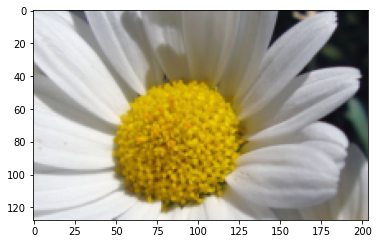

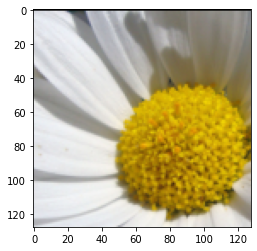

In [ ]:
train_input_folder = '01_input_data/flowers/train'
valid_input_folder = '01_input_data/flowers/valid'
test_input_folder = '01_input_data/flowers/test'
test2_input_folder = '01_input_data/flowers/test2'

transf = transforms.Compose([transforms.Resize(128), transforms.ToTensor()])
train_ds = torchvision.datasets.ImageFolder(train_input_folder, transform = transf)

im1 = train_ds[0][0]
const_pad2d = nn.ConstantPad2d(padding = 1, value = 0)
im2 = const_pad2d(im1)[:, :128, 1:129]

plt.imshow(im1.permute(1,2,0));plt.show()
plt.imshow(im2.permute(1,2,0))

im1 = im1.unsqueeze(0).to(device)
im1 = im2.unsqueeze(0).to(device);

In [ ]:
# check runtime of path match
# commented because test is one time only (after patch match implementation)
# start_time = time.time()

# kernel_size = 3
# radius_length = 3
# padding = kernel_size // 2
# fm2_border_thickness = kernel_size // 2
# dist_type = "L2_pos"
# index_init = 'random'

# im2 = im1.clone()

# torch.manual_seed(0)

# patch_match = PatchMatch( kernel_size, radius_length, padding, fm2_border_thickness, dist_type, index_init)

# patches_distances, patches_distances_index = patch_match.find_match(im1, im2, nb_of_iterations = 5)

# end_time = time.time()
# elapsed_time = end_time - start_time
# print(f"{elapsed_time // 60 } min {elapsed_time % 60} sec")
# print("elapsed_time:", elapsed_time)

# Runtime on GPU with own CUDA implementation: 21 seconds
# Runtime on GPU without own CUDA implementation: 5 min 12 seconds

0.0 min 21.123465299606323 sec
elapsed_time: 21.123465299606323


# Colorization subnet

## DataSet and DataLoader

In [ ]:
# Define DS and DL which will provide input for similiarity network. After procesing
# through similarity network collected results will be used in subsequent DL

colorization_batch_size_train = 96
colorization_batch_size_valid = 128

# define data sets
train_ds_for_colorization_cie = TargetRefDS(flowers_img_train_path, 
                             prob_ref_is_from_target_class, 
                             
                             target_transform = train_colorization_cielab_transforms,
                             ref_transform = train_colorization_cielab_transforms)


valid_ds_for_colorization_cie = TargetRefDS(flowers_img_valid_path, 
                             prob_ref_is_from_target_class_valid, 
                             target_transform = val_colorization_cielab_transforms,
                             ref_transform = val_colorization_cielab_transforms)

test_ds_for_colorization_cie = TargetRefDS(flowers_img_test_path, 
                             prob_ref_is_from_target_class_valid, 
                             target_transform = val_colorization_cielab_transforms,
                             ref_transform = val_colorization_cielab_transforms)

# define data loaders
train_dl_for_colorization_cie = torch.utils.data.DataLoader(train_ds_for_colorization_cie, 
                                       batch_size=colorization_batch_size_train, drop_last = True, shuffle=True, num_workers=DATALOADER_NUM_WORKERS)

valid_dl_for_colorization_cie = torch.utils.data.DataLoader(valid_ds_for_colorization_cie, 
                                       batch_size=colorization_batch_size_valid, drop_last = True, shuffle=False, num_workers=DATALOADER_NUM_WORKERS)

test_dl_for_colorization_cie = torch.utils.data.DataLoader(test_ds_for_colorization_cie, 
                                       batch_size=colorization_batch_size_valid, drop_last = True, shuffle=False, num_workers=DATALOADER_NUM_WORKERS)



In [ ]:
# calculate min, max values

# ds_min_max = np.zeros((len(train_ds_for_colorization_cie), 4))
# for img_id in range(len(train_ds_for_colorization_cie)):
#   target_img = train_ds_for_colorization_cie[img_id][0]
#   ds_min_max[img_id, 0] = target_img[1,:,:].min().item()
#   ds_min_max[img_id, 1] = target_img[1,:,:].max().item()
#   ds_min_max[img_id, 2] = target_img[2,:,:].min().item()
#   ds_min_max[img_id, 3] = target_img[2,:,:].max().item()
  
# fig, axs = plt.subplots(4,1, sharex=True, figsize =(5,10))
# axs[0].hist(ds_min_max[:, 0], label="Min a" )
# axs[1].hist(ds_min_max[:, 1], label="Max a" )
# axs[2].hist(ds_min_max[:, 2], label="Min b" )
# axs[3].hist(ds_min_max[:, 3], label="Max b" )

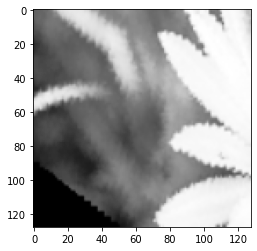

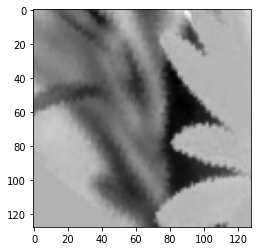

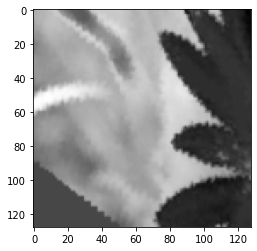

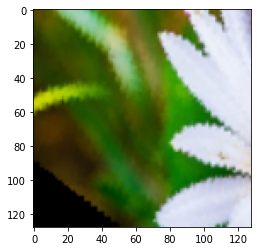

In [ ]:
# check data set
im = train_ds_for_colorization_cie[0][1]
plt.imshow(im[0], cmap='Greys_r'); plt.show()
plt.imshow(im[1], cmap='Greys_r'); plt.show()
plt.imshow(im[2], cmap='Greys_r'); plt.show()

plt.imshow(transform_batch_Pytorch_CHW_to_Numpy_HWC(transform_batch_norm_cielab_to_rgb_transforms(im[None,:].to(device)))[0]); plt.show()

In [ ]:
class ColorizationDataset(torch.utils.data.IterableDataset):

  def __init__(self, input_images_data_loader, similarity_model, patch_match, nb_of_iterations, training):
    super().__init__()
    self.input_images_data_loader = input_images_data_loader
    self.similarity_model = similarity_model
    self.patch_match = patch_match
    self.pm_nb_of_iterations = nb_of_iterations
    # set different behaviour for training and inference
    self.training = training
    if training == True:
      self.batch_type_to_return = 'train_chrom' # allowed values for training: train_chrom, train_perc
    else:
      self.batch_type_to_return = 'valid_perc' # allowed values for validation: valid_perc


    self.similarity_model.eval()
    for mod in self.similarity_model.modules():
      mod.requires_grad = False

  def get_colorization_batch(self):

    for target_imgs, ref_imgs in self.input_images_data_loader:

      # input to similarity model only duplicated 3 times L channel (not Lab channels)
      target_imgs = target_imgs.to(device)
      ref_imgs = ref_imgs.to(device)

      target_imgs_L_channel = target_imgs[:, :1, :, :]
      target_imgs_L_channel_expanded = target_imgs_L_channel.expand(-1,3,-1,-1)

      ref_imgs_L_channel = ref_imgs[:, :1, :, :]
      ref_imgs_L_channel_expanded = ref_imgs_L_channel.expand(-1,3,-1,-1)

      # get feature maps list and reverse their order
      target_fms_list = self.similarity_model(target_imgs_L_channel_expanded)[::-1]
      ref_fms_list = self.similarity_model(ref_imgs_L_channel_expanded)[::-1]
            
      
      sim_dist, phi_T_R, phi_T_R_T = self.patch_match.calculate_similarity_maps_for_training(target_fms_list, ref_fms_list, nb_of_iterations = self.pm_nb_of_iterations)

      # upscale similarity distance
      sim_dist = patch_match_upscale_similarity_distance(sim_dist)


      if self.training:

        if self.batch_type_to_return == 'train_chrom':
          # chrominance branch

          phi_T_R_T_upscaled = patch_match_upscale_indexes(phi_T_R_T)
          del phi_T_R, phi_T_R_T # delete unncessary references

          target_imgs_ab_channel = target_imgs[:, 1:, :, :]
          T_ab_warped = patch_match_warp_fm(target_imgs_ab_channel, phi_T_R_T_upscaled)
          colorization_input_batch = torch.cat([target_imgs_L_channel, sim_dist, T_ab_warped], dim = 1)

          yield colorization_input_batch, target_imgs, ref_imgs, self.batch_type_to_return

          # change to perception branch
          self.batch_type_to_return = 'train_perc'


        elif self.batch_type_to_return == 'train_perc':
          # perception branch

          phi_T_R_upscaled = patch_match_upscale_indexes(phi_T_R)
          del phi_T_R, phi_T_R_T # delete unncessary references

          ref_imgs_ab_channels = ref_imgs[:, 1:, :, :]
          R_ab_warped = patch_match_warp_fm(ref_imgs_ab_channels, phi_T_R_upscaled)
          colorization_input_batch = torch.cat([target_imgs_L_channel, sim_dist, R_ab_warped], dim = 1)

          yield colorization_input_batch, target_imgs, ref_imgs, self.batch_type_to_return

          # change to chrominance branch
          self.batch_type_to_return = 'train_chrom'


      else: # inference stage
        
        phi_T_R_upscaled = patch_match_upscale_indexes(phi_T_R)
        del phi_T_R, phi_T_R_T # delete unncessary references

        ref_imgs_ab_channels = ref_imgs[:, 1:, :, :]
        R_ab_warped = patch_match_warp_fm(ref_imgs_ab_channels, phi_T_R_upscaled)
        colorization_input_batch = torch.cat([target_imgs_L_channel, sim_dist, R_ab_warped], dim = 1)

        yield colorization_input_batch, target_imgs, ref_imgs, self.batch_type_to_return

  def __iter__(self):

    return self.get_colorization_batch()

In [ ]:
class DatasetCustomTargetRef(torch.utils.data.IterableDataset):

  def __init__(self, image_ds, target_image_ids, ref_image_ids):

    super().__init__()

    self.image_ds = image_ds
    self.target_image_ids = target_image_ids
    self.ref_image_ids = ref_image_ids

  def get_iterator_over_images(self):

    for target_image_id in self.target_image_ids:
      for ref_image_id in self.ref_image_ids:
        yield self.image_ds[target_image_id][0], self.image_ds[ref_image_id][0]

  def __iter__(self):
    
    return self.get_iterator_over_images()


In [ ]:
class ColorizationModelRgbResults(torch.utils.data.IterableDataset):

  def __init__(self, dataloader_target_ref, similarity_model, colorization_model, patch_match, 
               patch_match_nb_of_iterations, transform_batch_norm_cielab_to_rgb_transforms,
               transform_batch_Pytorch_CHW_to_Numpy_HWC, transform_batch_inv_rbg_normalize):

    super().__init__()

    self.dataloader_target_ref = dataloader_target_ref
    self.similarity_model = similarity_model
    self.colorization_model = colorization_model
    self.patch_match = patch_match
    self.pm_nb_of_iterations = patch_match_nb_of_iterations
    self.transform_batch_norm_cielab_to_rgb_transforms = transform_batch_norm_cielab_to_rgb_transforms
    self.transform_batch_Pytorch_CHW_to_Numpy_HWC = transform_batch_Pytorch_CHW_to_Numpy_HWC
    self.transform_batch_inv_rbg_normalize = transform_batch_inv_rbg_normalize


  def get_colorization_model_output_in_rgb(self):

    for target_imgs_Lab_norm, ref_imgs_Lab_norm in self.dataloader_target_ref:
      
      # save model states
      similarity_model_state = self.similarity_model.training
      colorization_model_state = self.colorization_model.training

      self.similarity_model.eval()
      self.colorization_model.eval()

      # input to similarity model only duplicated 3 times L channel (not Lab channels)
      target_imgs_Lab_norm = target_imgs_Lab_norm.to(device)
      ref_imgs_Lab_norm = ref_imgs_Lab_norm.to(device)

      target_imgs_L_channel = target_imgs_Lab_norm[:, :1, :, :]
      target_imgs_L_channel_expanded = target_imgs_L_channel.expand(-1,3,-1,-1)

      ref_imgs_L_channel = ref_imgs_Lab_norm[:, :1, :, :]
      ref_imgs_L_channel_expanded = ref_imgs_L_channel.expand(-1,3,-1,-1)

      # get feature maps list and reverse their order
      with torch.no_grad():
        target_fms_list = self.similarity_model(target_imgs_L_channel_expanded)[::-1]
        ref_fms_list = self.similarity_model(ref_imgs_L_channel_expanded)[::-1]

      sim_dist, phi_T_R, phi_T_R_T = self.patch_match.calculate_similarity_maps_for_training(target_fms_list, ref_fms_list, nb_of_iterations = self.pm_nb_of_iterations)

      # upscale similarity distance
      sim_dist = patch_match_upscale_similarity_distance(sim_dist)

      phi_T_R_T_upscaled = patch_match_upscale_indexes(phi_T_R_T)
      phi_T_R_upscaled = patch_match_upscale_indexes(phi_T_R)

      target_imgs_ab_channel = target_imgs_Lab_norm[:, 1:, :, :]
      ref_imgs_ab_channels = ref_imgs_Lab_norm[:, 1:, :, :]

      T_ab_warped = patch_match_warp_fm(target_imgs_ab_channel, phi_T_R_T_upscaled)
      R_ab_warped = patch_match_warp_fm(ref_imgs_ab_channels, phi_T_R_upscaled)

      chrom_input_batch = torch.cat([target_imgs_L_channel, sim_dist, T_ab_warped], dim = 1)
      perc_input_batch = torch.cat([target_imgs_L_channel, sim_dist, R_ab_warped], dim = 1)


      with torch.no_grad():
        chrom_output_batch_ab = self.colorization_model.forward(chrom_input_batch)
        perc_output_batch_ab = self.colorization_model.forward(perc_input_batch)

      training_output_batch_lab_normed = torch.cat([target_imgs_Lab_norm[:,:1,:,:], chrom_output_batch_ab], dim=1)
      # below target_imgs in concatenation is correct
      val_colorization_output_batch_lab_normed = torch.cat([target_imgs_Lab_norm[:,:1,:,:], perc_output_batch_ab], dim=1)

      # get RGB in the range [0, 1]
      training_output_batch_rgb = self.transform_batch_norm_cielab_to_rgb_transforms(training_output_batch_lab_normed)
      target_imgs_rgb = self.transform_batch_norm_cielab_to_rgb_transforms(target_imgs_Lab_norm)

      val_colorization_output_batch_rgb = self.transform_batch_norm_cielab_to_rgb_transforms(val_colorization_output_batch_lab_normed)
      ref_imgs_rgb = self.transform_batch_norm_cielab_to_rgb_transforms(ref_imgs_Lab_norm)

      # Final transformations (get Numpy images on CPU)
      training_output_batch_rgb =  self.transform_batch_Pytorch_CHW_to_Numpy_HWC(training_output_batch_rgb)
      val_colorization_output_batch_rgb = self.transform_batch_Pytorch_CHW_to_Numpy_HWC(val_colorization_output_batch_rgb)
      target_imgs_rgb_numpy = self.transform_batch_Pytorch_CHW_to_Numpy_HWC(target_imgs_rgb)
      ref_imgs_rgb_numpy = self.transform_batch_Pytorch_CHW_to_Numpy_HWC(ref_imgs_rgb)

      # Restore original model states
      if similarity_model_state == True:
        self.similarity_model.train()
      else:
        self.similarity_model.eval()

      if colorization_model_state == True:
        self.colorization_model.train()
      else:
        self.colorization_model.eval()



      yield training_output_batch_rgb, \
            val_colorization_output_batch_rgb, \
            target_imgs_rgb_numpy, \
            ref_imgs_rgb_numpy

  def __iter__(self):

    return self.get_colorization_model_output_in_rgb()


In [ ]:
def get_predicted_batch(input_folder, similarity_model, colorization_model_pl, target_image_ids = np.arange(0,5), ref_image_ids = np.random.randint(0, 5, 1)):

  veryf_ds_img_folder = torchvision.datasets.ImageFolder(input_folder, transform=val_colorization_cielab_transforms)

  # target_image_ids = np.random.randint(0, len(veryf_ds_img_folder), 8)
  # ref_image_ids = np.random.randint(0, len(veryf_ds_img_folder), 4)


  veryf_ds_targer_ref = DatasetCustomTargetRef(veryf_ds_img_folder, target_image_ids = target_image_ids, ref_image_ids = ref_image_ids)

  bs = target_image_ids.shape[0]
  veryf_dl_targer_ref = torch.utils.data.DataLoader(veryf_ds_targer_ref, batch_size = bs, num_workers=DATALOADER_NUM_WORKERS)


  col_rgb_results_dl = ColorizationModelRgbResults(veryf_dl_targer_ref, 
                                                  similarity_model, 
                                                  colorization_model_pl, 
                                                  patch_match, nb_of_iterations, 
                                                  transform_batch_norm_cielab_to_rgb_transforms, 
                                                  transform_batch_Pytorch_CHW_to_Numpy_HWC,
                                                  transform_batch_inv_rbg_normalize)


  return iter(col_rgb_results_dl)

In [ ]:
# prepare patch match object to get phi mappings

nb_of_iterations = 5

kernel_size = 3
radius_lengths = [1,1,1,2,2]
padding = kernel_size // 2
fm2_border_thickness = kernel_size // 2
dist_type = "cos_pos" #"L2_pos"
index_init = 'random'

torch.manual_seed(0)

# prepare similarity model to extract feature maps
layers_to_extract = features_modules_for_similarity[resnet_model_name]
similarity_model_without_hooks = similairty_ciel_model.base_model.model_body.model
similarity_model = FeatFromSequence(similarity_model_without_hooks, layers_to_extract)

patch_match = PatchMatchForUpScaleWithSim( kernel_size, radius_lengths, padding, fm2_border_thickness, dist_type, index_init)



train_ds_for_colorization = ColorizationDataset(train_dl_for_colorization_cie, 
                                                similarity_model, patch_match, nb_of_iterations,
                                                training = True) 
valid_ds_for_colorization = ColorizationDataset(valid_dl_for_colorization_cie, 
                                                similarity_model, patch_match, nb_of_iterations,
                                                training = False) 

test_ds_for_colorization = ColorizationDataset(test_dl_for_colorization_cie, 
                                                similarity_model, patch_match, nb_of_iterations,
                                                training = False)

## Colorization Unet

In [ ]:
# Define colorization encoder model

colorization_resnet_model_name = 'resnet18'

def create_colorization_encoder_model(colorization_resnet_model_name):

  colorization_encoder_model_name = colorization_resnet_model_name

  features_modules_for_colorization = {}
  features_modules_for_colorization[colorization_resnet_model_name] = ['relu', 'layer1', 'layer2', 'layer3', 'layer4']

  # get predefined model from torchvision.models and strip it of head
  colorization_encoder_model = getattr(torchvision.models, colorization_encoder_model_name)(pretrained=False)
  colorization_encoder_model = PretrainedResnetBody(colorization_encoder_model).model

  # change input channels from 3 to 13
  colorization_encoder_model[0] = nn.Conv2d(13, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

  colorization_layers_to_extract = features_modules_for_colorization[colorization_encoder_model_name]
  colorization_encoder_model = FeatFromSequence(colorization_encoder_model, 
                                                colorization_layers_to_extract, 
                                                detach_features =False,
                                                return_only_features = False)

  return colorization_encoder_model


colorization_encoder_model = create_colorization_encoder_model(colorization_resnet_model_name)


In [ ]:
class ConvBlock(nn.Module):

  def __init__(self, in_channels, out_channels, kernel_size = 3, stride = 1, padding = 1, with_activation = True):
    
    super().__init__()
    self.with_activation = with_activation
    self.padding = padding
    self.stride = stride
    self.kernel_size = kernel_size
    
    self.conv = nn.Conv2d(in_channels, out_channels, kernel_size = kernel_size, stride = stride, padding = padding)
    self.bn = nn.BatchNorm2d(out_channels)

    if with_activation:
      self.activ = nn.ReLU()
    
  def forward(self, x):

    x = self.bn(self.conv(x))
    if self.with_activation:
      return self.activ(x)
    else:
      return x

In [ ]:
class Upsample(nn.Module):
  
  def __init__(self, upsample_scale_factor):

    super().__init__()
    self.upsample_scale_factor = upsample_scale_factor

  def forward(self, x):
    
    x = nn.functional.interpolate(x, scale_factor = self.upsample_scale_factor)

    return x

In [ ]:
class UnetDecoderBlock(nn.Module):
  ''' Defines two convolutional layers with upscaling before the first layer.'''

  def __init__(self, in_channels_prev_layer, in_channels_skip_layer, upsample_scale_factor = 2, out_channels_conv1 = None, out_channels_conv2 = None):

    super().__init__()

    self.in_channels_prev_layer = in_channels_prev_layer
    self.in_channels_skip_layer = in_channels_skip_layer
    self.upsample_scale_factor = upsample_scale_factor

    in_channels = in_channels_prev_layer + in_channels_skip_layer
    if out_channels_conv1 == None:
      out_channels_conv1  = in_channels // 2
    if out_channels_conv2 == None:
      out_channels_conv2  = out_channels_conv1 // 2

    self.in_channels = in_channels
    self.out_channels_conv1 = out_channels_conv1
    self.out_channels_conv2 = out_channels_conv2

    if self.upsample_scale_factor != None:
      self.upsample = Upsample(upsample_scale_factor)
    self.conv1 = ConvBlock(in_channels, out_channels_conv1)
    self.conv2 = ConvBlock(out_channels_conv1, out_channels_conv2)

  def forward(self, x, y):
    # upscale - default by factor of 2
    if self.upsample_scale_factor != None:
      x = self.upsample(x)

    x = torch.cat((x, y), dim = 1)

    # later for self.conv1 will be pre hook registered
    x = self.conv1(x)
    x = self.conv2(x)

    return x

In [ ]:
class ColorizationUNet(nn.Module):

  def __init__(self, encoder_model):

    super().__init__()
    self.encoder_model = encoder_model

    # middle model
    in_channels_middle_model = self.encoder_model.model[-1][-1].bn1.weight.shape[0]

    self.middle_model = nn.Sequential(
        
        ConvBlock(in_channels_middle_model, 2 * in_channels_middle_model, stride=2),
        ConvBlock(2 * in_channels_middle_model, in_channels_middle_model)     
    ) 

    # decoder model
    self.decoder_model_components = nn.ModuleDict(
      collections.OrderedDict([
        ('decoder_512', UnetDecoderBlock(in_channels_prev_layer = 512, in_channels_skip_layer = 512)),
        ('decoder_256', UnetDecoderBlock(in_channels_prev_layer = 256, in_channels_skip_layer = 256)),
        ('decoder_128', UnetDecoderBlock(in_channels_prev_layer = 128, in_channels_skip_layer = 128)),
        ('decoder_64', UnetDecoderBlock(in_channels_prev_layer = 64, in_channels_skip_layer = 64, out_channels_conv1 = 96, out_channels_conv2 = 64)),
        ('decoder_32', UnetDecoderBlock(in_channels_prev_layer = 64, in_channels_skip_layer = 64, out_channels_conv1 = 64, out_channels_conv2 = 48)),
        ('decoder_24', UnetDecoderBlock(in_channels_prev_layer = 48, in_channels_skip_layer = 13, out_channels_conv1 = 48, out_channels_conv2 = 32)),
        # ('decoder_13', ConvBlock((24 + 13) // 2 // 2, 2, with_activation=False))
        ('decoder_13', torch.nn.Conv2d(32, 2, kernel_size=3, padding = 1, bias = True))
        ]
      )
    )

  def forward(self, x):

    input_x = x

    encoder_features, x = self.encoder_model(x)
    skip_features = ([input_x] + encoder_features)[::-1]

    x = self.middle_model(x)

    # decoder model part
    for component_id, (decoder_model_component_name, decoder_model_component) in enumerate(self.decoder_model_components.items()):
      if decoder_model_component_name != 'decoder_13':
        x = decoder_model_component(x, skip_features[component_id])
      else:
        x = decoder_model_component(x)

    x = 4 * torch.tanh(x)

    return x

In [ ]:
def create_colorization_model():

  colorization_encoder_model = create_colorization_encoder_model(colorization_resnet_model_name)
  colorization_model = ColorizationUNet(colorization_encoder_model)

  return colorization_model.to(device)

In [ ]:
# create colorization model (version before transforming to Pytorch Lightning)

colorization_model = create_colorization_model()
colorization_model

ColorizationUNet(
  (encoder_model): FeatFromSequence(
    (model): Sequential(
      (conv1): Conv2d(13, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

In [ ]:
# plot computation graph
# out = colorization_model(torch.rand(128,13,128,128).to(device))
# dot = make_dot(out, params=dict(colorization_model.to('cpu').named_parameters()))
# dot.render('colorization_net')

In [ ]:
a = torch.randn(4,4)
a[:1].clamp_(0,1)

tensor([[0., 0., 0., 0.]])

## Colorization Unet Pytorch Ligthning

In [ ]:
class ColorizationUNetPL(pl.LightningModule):

  def __init__(self, 
               
               hparams_dict, 
               hparams_dict_tb,

               colorization_model,
               rgb_similarity_model,
               transform_batch_norm_cielab_to_norm_rgb_transforms,
               transform_batch_cieab_inv_normalize,

               train_ds = None,
               val_ds = None,
               test_ds = None
    
               ):
    super(ColorizationUNetPL, self).__init__()

    self.hparams_dict = hparams_dict
    self.hparams_dict_tb = hparams_dict_tb

    self.save_hyperparameters()

    self.train_ds = train_ds
    self.val_ds = val_ds
    self.test_ds = test_ds

    self.colorization_model = colorization_model
    self.rgb_similarity_model = rgb_similarity_model

    self.loss_fn_chrom = torch.nn.SmoothL1Loss()
    # other possible losses
    # self.loss_fn_chrom = torch.nn.L1Loss()
    # self.loss_fn_chrom = torch.nn.MSELoss()
    
    self.loss_fn_perc = torch.nn.MSELoss()
    self.alpha_perc = hparams_dict['alpha_perc']

    self.transform_batch_norm_cielab_to_norm_rgb_transforms = transform_batch_norm_cielab_to_norm_rgb_transforms
    self.transform_batch_cieab_inv_normalize = transform_batch_cieab_inv_normalize

    self.example_input_array = torch.rand(128, 13, 128, 128)




  def configure_optimizers(self):
    
    adam = torch.optim.AdamW(self.colorization_model.parameters(), lr=self.hparams_dict['max_lr']) 

    train_ds_len = len(self.train_ds.input_images_data_loader.dataset)


    steps_per_epoch = train_ds_len // self.hparams_dict['train_bs']

    lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(adam, 
                                                       max_lr=self.hparams_dict['max_lr'], 
                                                       total_steps=None,
                                                       epochs=self.hparams_dict['max_epoch'], 
                                                       steps_per_epoch=steps_per_epoch, 
                                                       pct_start=0.3, 
                                                       anneal_strategy='cos', cycle_momentum=True, 
                                                       base_momentum=0.85, max_momentum=0.95, 
                                                       div_factor=10 * 25.0, final_div_factor=1.e4, last_epoch=-1)
    lr_scheduler_dict = {'scheduler': lr_scheduler, 'interval': 'step'}

    return [adam], [lr_scheduler_dict]

    return adam

  def forward(self,x):
    return self.colorization_model(x)


  def on_fit_start(self):
    # put placeholders -0.01 (None values cannot be logged to TensorBoard)
    self.last_loss_value_for_train_chrom = -0.01
    self.last_loss_value_for_train_perc = -0.01
    self.last_loss_value_for_valid_chrom = -0.01

  def training_step(self, batch, batch_idx):
    
    input_batch, target_imgs, ref_imgs, batch_type = batch

    if batch_type == 'train_chrom':

      target_pred_Cie_ab = self.forward(input_batch)

      # calculate losses: loss_chrom, loss_perc, loss
      # chrom loss is calculated after transforming to Lab scale and performing Lab normalization

      # restrict images to specified range of values
      if self.hparams_dict['clamp_before_loss'] != None:
        target_imgs[:,1:, :, :].clamp_(**self.hparams_dict['clamp_before_loss'])
        target_pred_Cie_ab.clamp_(**self.hparams_dict['clamp_before_loss'])

      loss_chrom = self.loss_fn_chrom(target_imgs[:,1:, :, :], target_pred_Cie_ab)
      loss_perc = self.last_loss_value_for_train_perc

      if self.last_loss_value_for_train_perc < 0:
        loss = loss_chrom
      else:
        loss = loss_chrom + loss_perc

      # save chrom loss
      self.last_loss_value_for_train_chrom = loss_chrom.detach()

      progress_bar_dict = {'train_loss': loss}
      log_dict = {'train_loss': loss, 'train_loss_chrom': loss_chrom, 'train_loss_perc': loss_perc}


      tensorboard = self.logger.experiment
      with torch.no_grad():
        tensorboard.add_histogram("Predicted ab normalized", target_pred_Cie_ab, self.current_epoch)
        tensorboard.add_histogram("Predicted a normalized", target_pred_Cie_ab[:,0:1,:,:], self.current_epoch)
        tensorboard.add_histogram("Predicted b normalized", target_pred_Cie_ab[:,1:2,:,:], self.current_epoch)

        tensorboard.add_histogram("Target ab normalized", target_imgs[:,1:, :, :], self.current_epoch)
        tensorboard.add_histogram("Target a normalized", target_imgs[:,1:2, :, :], self.current_epoch)
        tensorboard.add_histogram("Target b normalized", target_imgs[:,2:3, :, :], self.current_epoch)

    elif batch_type == 'train_perc':

      # calculate predicted RGB images
      target_pred_Cie_ab = self.forward(input_batch)

      # restrict images to specified range of values
      if self.hparams_dict['clamp_before_loss'] != None:
        target_imgs[:,1:, :, :].clamp_(**self.hparams_dict['clamp_before_loss'])
        target_pred_Cie_ab.clamp_(**self.hparams_dict['clamp_before_loss'])

      target_pred_rgb = self.transform_batch_norm_cielab_to_norm_rgb_transforms(torch.cat([target_imgs[:,:1, :, :], target_pred_Cie_ab], dim = 1))

      # calculate high level features for target and predicted RGB images
      target_imgs_features = self.rgb_similarity_model(target_imgs)
      pred_imgs_features = self.rgb_similarity_model(target_pred_rgb)

      # calculate perceptual loss based on high level features
      loss_perc = self.alpha_perc * self.loss_fn_perc(pred_imgs_features, target_imgs_features)


      # get previous chrom loss value
      loss_chrom = self.last_loss_value_for_train_chrom

      if self.last_loss_value_for_train_chrom < 0:
        loss =  loss_perc
      else:
        loss = loss_chrom + loss_perc


      # save perc loss for next step of loss calculation
      self.last_loss_value_for_train_perc = loss_perc.detach()

      progress_bar_dict = {'train_loss': loss}
      log_dict = {'train_loss': loss, 'train_loss_chrom': loss_chrom, 'train_loss_perc': loss_perc}


      tensorboard = self.logger.experiment
      with torch.no_grad():
        tensorboard.add_histogram("Predicted ab normalized", target_pred_Cie_ab, self.current_epoch)
        tensorboard.add_histogram("Predicted a normalized", target_pred_Cie_ab[:,0:1,:,:], self.current_epoch)
        tensorboard.add_histogram("Predicted b normalized", target_pred_Cie_ab[:,1:2,:,:], self.current_epoch)

        tensorboard.add_histogram("Target ab normalized", target_imgs[:,1:, :, :], self.current_epoch)
        tensorboard.add_histogram("Target a normalized", target_imgs[:,1:2, :, :], self.current_epoch)
        tensorboard.add_histogram("Target b normalized", target_imgs[:,2:3, :, :], self.current_epoch)
    
    else:
      raise Exception("Incorrect batch_type for training:", batch_type)



    return {'loss': loss, 'progress_bar': progress_bar_dict, 
        'log': log_dict}


  def validation_step(self, batch, batch_idx):
    
    input_batch, target_imgs, ref_imgs, batch_type  = batch

    if batch_type == 'valid_perc':

      # calculate chrominace loss
      target_pred_Cie_ab = self.forward(input_batch)
      val_loss_chrom = self.loss_fn_chrom(self.transform_batch_cieab_inv_normalize(target_imgs[:,1:, :, :]), self.transform_batch_cieab_inv_normalize(target_pred_Cie_ab))

      # make predicted RGB image (for perceptual loss calculation)
      target_pred_rgb = self.transform_batch_norm_cielab_to_norm_rgb_transforms(torch.cat([target_imgs[:,:1, :, :], target_pred_Cie_ab], dim = 1))

      # calculate high level features for target and predicted RGB images
      target_imgs_features = self.rgb_similarity_model(target_imgs)
      pred_imgs_features = self.rgb_similarity_model(target_pred_rgb)

      # calculate perceptual loss based on high level features
      val_loss_perc =  self.alpha_perc * self.loss_fn_perc(pred_imgs_features, target_imgs_features)

      val_loss = val_loss_chrom + val_loss_perc
      

      log_dict = {'val_loss': val_loss, 'val_loss_chrom': val_loss_chrom, 'val_loss_perc': val_loss_perc}

      return log_dict


    else:
      raise Exception("Incorrect batch_type for validation:", batch_type)


  def validation_epoch_end(self, outputs):

    val_loss = torch.stack([out['val_loss'] for out in outputs]).mean()
    val_loss_chrom = torch.stack([out['val_loss_chrom'] for out in outputs]).mean()
    val_loss_perc = torch.stack([out['val_loss_perc'] for out in outputs]).mean()

    log_dict = {'val_loss': val_loss, 'val_loss_chrom': val_loss_chrom, 'val_loss_perc': val_loss_perc}

    return {'log': log_dict}

  def prepare_data(self):
    pass


  def train_dataloader(self):
    train_dl = torch.utils.data.DataLoader(self.train_ds, batch_size=None, batch_sampler=None, num_workers=0)

    return train_dl

  def val_dataloader(self):
    val_dl = torch.utils.data.DataLoader(self.val_ds, batch_size=None, batch_sampler=None, num_workers=0)

    return val_dl

  def test_dataloader(self):
    test_dl = torch.utils.data.DataLoader(self.test_ds, batch_size=None, batch_sampler=None, num_workers=0)
    return test_dl

  def test_step(self, *args, **kwargs):
    return self.validation_step(*args, **kwargs)

  def test_epoch_end(self, *args, **kwargs):
    return self.validation_epoch_end(*args, **kwargs)

## Tensorboard Colorization

In [ ]:
# make log directory
tb_logs_colorization = 'tb_logs_02_colorization'

tb_logger_name_colorization = 'colorization'


# make log directory
tb_logs_colorization_path = create_directory( Path(training_folder) / tb_logs_colorization )

# restore tensorboard logs if resuming from checkpoint
if RESUME_COLORIZATION_MODEL_TRAINING != False and RESUME_COLORIZATION_MODEL_TRAINING != None:

  tb_logs_file = Path(gdrive_colorization_models_save_folder.parent / RESUME_COLORIZATION_MODEL_TRAINING).parent / 'colorization_tb_logs.zip'
  tb_logs_dir =  tb_logs_colorization_path

  restore_tb_logs(tb_logs_file, tb_logs_dir)



Created directory: /content/02_training/tb_logs_02_colorization
Created directory: /content/02_training/tb_logs_02_colorization
Tensor Board logs restored from file: /content/drive/My Drive/DNN ths/03 Models/01 Saved models/02_colorization_2020-09-29_04-56-56/colorization_tb_logs.zip into directory 02_training/tb_logs_02_colorization


In [ ]:
%tensorboard --logdir $training_folder/$tb_logs_colorization

<IPython.core.display.Javascript object>

## Training colorization model

In [ ]:
model_name_colorization = 'flowers_colorization'

In [ ]:
# Load rgb similarity model that will used in perceptual loss calculation (for colorization model)
rgb_similarity_model_for_colorization = load_rgb_model(model_filename_rgb_for_lum)

# turn off gradient calculation for model parameters and set eval mode
for param in rgb_similarity_model_for_colorization.parameters(recurse = True):
  param.requires_grad = False
rgb_similarity_model_for_colorization.eval()

# create directories
tb_logger_name = model_name_rgb + "_for_colorization"

tb_logger_folder = str(Path(training_folder) / model_load_test_tb_logs / tb_logs_similarity)
create_directory(Path(tb_logger_folder) / tb_logger_name)

tb_logger = TensorBoardLogger_bugfix(tb_logger_folder, name=tb_logger_name)

trainer = pl.Trainer(gpus=1, logger=tb_logger, max_epochs=1)
trainer.test(rgb_similarity_model_for_colorization)

Created directory: /content/02_training/02_training/model_load_test/tb_logs_01_similarity/flowers_rgb_for_colorization


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.6/dist-packages/pytorch_lightning/utilities/distributed.py:37: UserWarning:

Could not log computational graph since the `model.example_input_array` attribute is not set or `input_array` was not given



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'val_acc': tensor(0.9467, device='cuda:0'),
 'val_loss': tensor(0.2417, device='cuda:0')}
--------------------------------------------------------------------------------



[{'val_acc': 0.9467312693595886, 'val_loss': 0.24171875417232513}]

In [ ]:
class LogAlphaInLoss(pl.Callback):

      def on_train_epoch_start(self, trainer, pl_module):

        tensorboard = pl_module.logger.experiment
        tensorboard.add_scalar('Alpha check', pl_module.alpha_perc, pl_module.current_epoch)

class LogToTensorBoardModelWeights(pl.Callback):

    def on_validation_batch_end(self, trainer, pl_module, batch, batch_idx, dataloader_idx):

      tensorboard = pl_module.logger.experiment

      for name, params in pl_module.named_parameters():  
        tensorboard.add_histogram(name, params, batch_idx)
        
class LogPredictedImages(pl.Callback):

      def on_train_epoch_end(self, trainer, pl_module):

        if pl_module.current_epoch % 5 == 0:

          tensorboard = pl_module.logger.experiment

          predicted_batch_iter = get_predicted_batch(flowers_img_test2_path, pl_module.train_ds.similarity_model, pl_module.colorization_model)
          predicted_batch = next(predicted_batch_iter)
          predicted_batch = [torch.tensor(t) for t in predicted_batch]
        
          predicted_batch = (np.concatenate(predicted_batch, axis = 0).astype(np.float32) * 255).astype(np.uint8)
          predicted_batch_img = torchvision.utils.make_grid(torch.tensor(predicted_batch, dtype=torch.uint8).permute(0,3,1,2), nrow=5)
          tensorboard.add_image("Predictions", predicted_batch_img, global_step = pl_module.current_epoch, dataformats = 'CHW')


In [ ]:
@timeit
def flowers_colorization_optuna_objective(trial):

  colorization_hparams_dict = {
      'max_epoch': 150,
      # 'max_lr': 0.003 * 10, # świetny LR do uczenia overfit one batch z torch.optim.lr_scheduler.MultiStepLR(adam, [200,300,400, 500, 600], gamma=0.1, last_epoch=-1)
      # 'max_lr': 0.003 * 10 * 5, # with this LR OneCycle was trained, but turned worse than mulitstepLR
      'max_lr': 0.003,

      # batch sizes were fixed earlier at definition of data loader
      # this is not he place to set bath sizes
      # here BS are provided only as information to properly set learning rate schedule
      'train_bs': colorization_batch_size_train,
      'valid_bs': colorization_batch_size_valid,

      'alpha_perc': 0.005, # value used to train final colorization network for 150 epoch
      'clamp_before_loss':{'min':-4, 'max':4} # None value means to clamp
  }


  rgb_similarity_model_for_colorization.freeze()

  colorization_model = create_colorization_model()

  colorization_model_pl = ColorizationUNetPL(
      
      hparams_dict = colorization_hparams_dict,
      hparams_dict_tb = colorization_hparams_dict,

      train_ds = train_ds_for_colorization,
      val_ds = valid_ds_for_colorization,
      test_ds = test_ds_for_colorization,
      colorization_model = colorization_model,
      rgb_similarity_model = rgb_similarity_model_for_colorization,
      transform_batch_norm_cielab_to_norm_rgb_transforms = transform_batch_norm_cielab_to_norm_rgb_transforms,
      transform_batch_cieab_inv_normalize = transform_batch_cieab_inv_normalize

      
      )

  tb_logger_name = model_name_colorization
  
  # if resuming from checkpoint optionally set tb_logger_version (used by this checkpoint)
  if RESUME_COLORIZATION_MODEL_TRAINING != False and RESUME_COLORIZATION_MODEL_TRAINING != None and TB_VERSION_TO_BE_RESUMED != None:
    tb_logger_version = TB_VERSION_TO_BE_RESUMED 
  else:
    tb_logger_version = None 
  tb_logger_colorization = TensorBoardLogger_bugfix(str(Path(training_folder) / tb_logs_colorization), name=tb_logger_name, version=tb_logger_version)

  # if resuming training set path to checkpoint
  if RESUME_COLORIZATION_MODEL_TRAINING != False and RESUME_COLORIZATION_MODEL_TRAINING != None:
    resume_from_checkpoint_model_file = str(gdrive_colorization_models_save_folder.parent  / RESUME_COLORIZATION_MODEL_TRAINING)
  else:
    resume_from_checkpoint_model_file = None

  if SAVE_TRAIN_RESULTS_ON_GOOGLE_DRIVE == False:

    save_path = Path(training_folder) / (model_name_colorization + '_checkpoints')
    save_filename = str(save_path) + '/' + f'trial_{trial.number}' + '_{epoch:03d}_{val_loss:.2f}'

    checkpoint saves trained model on colab
    checkpoint_callback = pl.callbacks.ModelCheckpoint(filepath=save_filename,
                                                        monitor = 'val_loss',
                                                        mode = 'min',
                                                        save_top_k = -1,
                                                       save_last = True
                                                       )
  elif SAVE_TRAIN_RESULTS_ON_GOOGLE_DRIVE == True:

    # checkpoint saves trained model on google drive only
    save_path = Path(gdrive_colorization_models_save_folder)
    save_path.mkdir(exist_ok=True, parents=True)
    save_filename = str(save_path) + '/' + f'trial_{trial.number}' +'_epoch_{epoch:03d}'
    checkpoint_callback = pl.callbacks.ModelCheckpoint(filepath=save_filename,
                                                        monitor = 'val_loss',
                                                        mode = 'min',
                                                        save_top_k = -1,
                                                      save_last = True,
                                                      period = 5 # save every 5 epochs
                                                      )


  colorization_trainer = pl.Trainer(
                      gpus=1,  
                      logger=tb_logger_colorization,
                      checkpoint_callback=checkpoint_callback,
                      max_epochs = colorization_hparams_dict['max_epoch'],
                      row_log_interval = 15,
                      log_save_interval = 15,
                      progress_bar_refresh_rate=15,
                      callbacks = [LogPredictedImages(), pl.callbacks.LearningRateLogger(logging_interval='step'), LogAlphaInLoss()],

                     

                      resume_from_checkpoint = resume_from_checkpoint_model_file,
                      
                      val_check_interval = 1., 
                      track_grad_norm=2
                      
                      # values for testing only:

                      # limit_train_batches = 1, 
                      # limit_val_batches = 1, 
                      # callbacks = [LogToTensorBoardModelWeights()] # [PrintOptimParamsCallback()],
                      # overfit_batches = 2,
                      # profiler=True
                      
                      )
  colorization_trainer.fit(colorization_model_pl)

  trial.set_user_attr('model_file_name', checkpoint_callback.best_model_path)

  # temporary return also colorization model
  # return checkpoint_callback.best, colorization_model_pl, colorization_trainer, colorization_model_pl
  print("These are hyper parameters after training:\n", colorization_model_pl.hparams)


  return checkpoint_callback.best
  

In [ ]:
if TRAIN_COLORIZATION_MODEL == True:
  flowers_colorization_optuna_study = optuna.create_study(direction="minimize")
  flowers_colorization_optuna_study.optimize(flowers_colorization_optuna_objective, n_trials = 1)

[I 2020-09-29 23:23:27,832] A new study created in memory with name: no-name-201d8875-aad4-4c26-aa87-f28afe4905e9
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]

  | Name                 | Type                 | Params | In sizes            | Out sizes         
---------------------------------------------------------------------------------------------------------
0 | colorization_model   | ColorizationUNet     | 28 M   | [128, 13, 128, 128] | [128, 2, 128, 128]
1 | rgb_similarity_model | FlowersRGBClassifier | 21 M   | ?                   | ?                 
2 | loss_fn_chrom        | SmoothL1Loss         | 0      | ?                   | ?                 
3 | loss_fn_perc         | MSELoss              | 0      | ?                   | ?                 
/usr/local/lib/python3.6/dist-packages/pytorch_lightning/utilities/distributed.py:37: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bott

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning:

Mixed memory format inputs detected while calling the operator. The operator will output contiguous tensor even if some of the inputs are in channels_last format. (Triggered internally at  /pytorch/aten/src/ATen/native/TensorIterator.cpp:918.)



/usr/local/lib/python3.6/dist-packages/pytorch_lightning/utilities/distributed.py:37: UserWarning:

The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.



/usr/local/lib/python3.6/dist-packages/torch/serialization.py:390: UserWarning:

Couldn't retrieve source code for container of type FeatFromSequence. It won't be checked for correctness upon loading.



Saving latest checkpoint..



These are hyper parameters after training:
 "hparams_dict":    {'max_epoch': 150, 'max_lr': 0.003, 'train_bs': 96, 'valid_bs': 128, 'alpha_perc': 0.0002, 'clamp_before_loss': {'min': -4, 'max': 4}}
"hparams_dict_tb": {'max_epoch': 150, 'max_lr': 0.003, 'train_bs': 96, 'valid_bs': 128, 'alpha_perc': 0.0002, 'clamp_before_loss': {'min': -4, 'max': 4}}
"test_ds":         <__main__.ColorizationDataset object at 0x7f48f0f29898>
"train_ds":        <__main__.ColorizationDataset object at 0x7f48f548a5c0>
"val_ds":          <__main__.ColorizationDataset object at 0x7f48f0f18278>

flowers_colorization_optuna_objective took 906.0 min 57.55726361274719 sec



[I 2020-09-30 14:30:25,403] Trial 0 finished with value: 0.0 and parameters: {}. Best is trial 0 with value: 0.0.


In [ ]:
# save tensorboard logs
save_to_gdrive(gdrive_save_folder = gdrive_colorization_models_save_folder, 
                model_filename = None, 
                tb_logs_folder = tb_logs_colorization_path, 
                model_filename_gdrive_prefix='colorization_')

Created directory: /content/drive/My Drive/DNN ths/03 Models/01 Saved models/02_colorization_2020-09-29_23-19-06
Saved TensorBoard logs Google Drive: /content/drive/My Drive/DNN ths/03 Models/01 Saved models/02_colorization_2020-09-29_23-19-06/colorization_tb_logs.zip


In [ ]:
if TRAIN_COLORIZATION_MODEL == True:
  IPython.display.display(flowers_colorization_optuna_study.trials_dataframe())

,number,value,datetime_start,datetime_complete,duration,user_attrs_model_file_name,state
0,0,0.0,2020-09-29 23:23:27.836940,2020-09-30 14:30:25.396872,0 days 15:06:57.559932,,COMPLETE


In [ ]:
if TRAIN_COLORIZATION_MODEL == True:
  print(flowers_colorization_optuna_study.trials_dataframe().loc[0, 'user_attrs_model_file_name'])

In [ ]:
if TRAIN_COLORIZATION_MODEL == True:
  print("Best validation loss", flowers_colorization_optuna_study.best_trial.value)
  print("Best model run details:\n", flowers_colorization_optuna_study.best_trial)

Best validation loss 0.0
Best model run details:
 FrozenTrial(number=0, value=0.0, datetime_start=datetime.datetime(2020, 9, 29, 23, 23, 27, 836940), datetime_complete=datetime.datetime(2020, 9, 30, 14, 30, 25, 396872), params={}, distributions={}, user_attrs={'model_file_name': ''}, system_attrs={}, intermediate_values={}, trial_id=0, state=TrialState.COMPLETE)


In [ ]:
# Save Tensorboard logs to Google Drive

if SAVE_TRAIN_RESULTS_ON_GOOGLE_DRIVE == True and TRAIN_COLORIZATION_MODEL == True:
  
  save_to_gdrive(gdrive_save_folder = gdrive_colorization_models_save_folder, 
                 model_filename = None, 
                 tb_logs_folder = tb_logs_colorization_path, 
                 model_filename_gdrive_prefix='colorization_')

In [ ]:
# if TRAIN_COLORIZATION_MODEL == False restore previously trained Colorization model and its training TB logs
# if TRAIN_COLORIZATION_MODEL == True use Colorization model trained above and do not change TB logs

# path to the previously trained rgb model
gdrive_pretrained_colorization_model = '/content/drive/My Drive/DNN ths/03 Models/01 Saved models/02_colorization_2020-09-25_10-37-08/colorization_trial_0_val_loss=12.30.ckpt'


model_filename_colorization_to_load = Path(models_folder) / 'colorization_model.ckpt'

if TRAIN_COLORIZATION_MODEL == False:
  tmp_model_filename_colorization = gdrive_pretrained_colorization_model

  # restore Tensor Board logs

  tb_logs_file = Path(gdrive_pretrained_colorization_model).parent / 'colorization_tb_logs.zip'
  tb_logs_dir =  tb_logs_colorization_path

  restore_tb_logs(tb_logs_file, tb_logs_dir)

else:
  tmp_model_filename_colorization = gdrive_pretrained_colorization_model


# Copy RGB model checkpoint
shutil.copy(str(tmp_model_filename_colorization), model_filename_colorization_to_load)


In [ ]:
def load_colorization_model(file_name):
  'Load Colorization model from given checkpoint file'
  
  # Load weights to the recreated model
  colorization_model_pl = ColorizationUNetPL.load_from_checkpoint(
               str(file_name),
               rgb_similarity_model = flowers_rgb_class_model,
               transform_batch_norm_cielab_to_norm_rgb_transforms = transform_batch_norm_cielab_to_norm_rgb_transforms,
               colorization_model = colorization_model,
               transform_batch_cieab_inv_normalize = transform_batch_cieab_inv_normalize
   
    )
  
  
  #move model data are used in data loader to device
  colorization_model_pl.train_ds.similarity_model.model = colorization_model_pl.train_ds.similarity_model.model.to(device)
  colorization_model_pl.val_ds.similarity_model.model = colorization_model_pl.val_ds.similarity_model.model.to(device)
  colorization_model_pl.test_ds.similarity_model.model = colorization_model_pl.test_ds.similarity_model.model.to(device)

  return colorization_model_pl

In [ ]:
# Load previously saved model, recreate model objects and check performance 
# of loaded model on validation data set

colorization_model_pl = load_colorization_model(model_filename_colorization_to_load)


tb_logger_name = model_name_colorization
tb_logger_folder = str(Path(training_folder) / model_load_test_tb_logs / tb_logs_colorization)
create_directory(Path(tb_logger_folder) / tb_logger_name)

tb_logger = TensorBoardLogger_bugfix(tb_logger_folder, name=tb_logger_name)

trainer = pl.Trainer(gpus=1, logger=tb_logger, max_epochs=1)
# trainer.test(colorization_model_pl)

In [ ]:
def plot_batch_of_targer_ref_images(input_batch_iter, save_folder = None, target_image_ids = np.arange(1), ref_image_ids = np.arange(1), symbol_images=None, with_patch_match=True):

  collection_vector = []
  for target_img_id, input_batch in enumerate(input_batch_iter):

    if with_patch_match == True:
      collection_vector = []
    training_output_batch_rgb, val_colorization_output_batch_rgb, target_imgs, ref_imgs = input_batch
    
    for img_id in range(input_batch[0].shape[0]):

      # optionally save images
      if save_folder != None:
        Path(save_folder).mkdir(exist_ok = True, parents = True)

        # remove lines below if changed order is ok        
        # image_names_middle_parts = ['reference', 'target_color', 'target_input_bw', 'predicted_train', 'predicted_valid']
        # image_arr = [ref_imgs[img_id], target_imgs[img_id], target_imgs[img_id, :, :, 0], training_output_batch_rgb[img_id], val_colorization_output_batch_rgb[img_id]]

        if with_patch_match == True:
          image_names_middle_parts = ['target_color', 'target_input_bw', 'reference',  'predicted_valid', 'predicted_train']
          image_arr = [target_imgs[img_id], target_imgs[img_id, :, :, 0], ref_imgs[img_id], val_colorization_output_batch_rgb[img_id], training_output_batch_rgb[img_id]]
        else:
          image_names_middle_parts = ['target_color', 'target_input_bw', 'predicted_train']
          image_arr = [target_imgs[img_id], target_imgs[img_id, :, :, 0], training_output_batch_rgb[img_id]]

        for i in range(len(image_names_middle_parts)):

          image_name = f'target_img_{target_image_ids[target_img_id]:04d}_ref_img_{ref_image_ids[img_id]:04d}_{image_names_middle_parts[i]}.jpg'
          image_save_name = Path(save_folder) / image_name
          # PIL.Image.fromarray(np.array(255*image_arr[i], dtype=np.uint8)).save(image_save_name)

        # save vector of images
        if symbol_images == None:

          image_arr = [target_imgs[img_id], target_imgs[img_id, :, :, :1], ref_imgs[img_id], val_colorization_output_batch_rgb[img_id], training_output_batch_rgb[img_id]]
          image_arr[1] = np.repeat(image_arr[1], 3, axis=-1)
          image_arr_batch = torch.cat([torch.tensor(np_image[np.newaxis]) for np_image in image_arr], dim=0) # image_arr_batch.shape == (BS, H, W, C)

          predicted_batch_img = torchvision.utils.make_grid(torch.tensor(255 * image_arr_batch, dtype=torch.uint8).permute(0,3,1,2), nrow=5).permute(1,2,0)

        else:

          if with_patch_match == True:

            image_arr = [target_imgs[img_id], symbol_images['block'], \
                        target_imgs[img_id, :, :, :1], symbol_images['plus'], ref_imgs[img_id], symbol_images['arrow'], 
                        val_colorization_output_batch_rgb[img_id],symbol_images['block'], training_output_batch_rgb[img_id]]
            image_arr[2] = np.repeat(image_arr[2], 3, axis=-1)

          else:
            image_arr = [target_imgs[img_id], symbol_images['block'], 
                        target_imgs[img_id, :, :, :1], symbol_images['arrow'], 
                        training_output_batch_rgb[img_id]]
            image_arr[2] = np.repeat(image_arr[2], 3, axis=-1)

          image_arr_batch = torch.cat([torch.tensor(np_image[np.newaxis]) for np_image in image_arr], dim=0) # image_arr_batch.shape == (BS, H, W, C)

          predicted_batch_img = torchvision.utils.make_grid(torch.tensor(255 * image_arr_batch, dtype=torch.uint8).permute(0,3,1,2), nrow=9).permute(1,2,0)

        image_name_vector = f'vector_for_target_img_{target_image_ids[target_img_id]:04d}.jpg'
        image_save_name_vector = Path(save_folder) / image_name_vector
        PIL.Image.fromarray(predicted_batch_img.numpy()).save(image_save_name_vector)


        collection_vector.append(predicted_batch_img)

        if with_patch_match == False:
          break

    if with_patch_match == True:
      collection_vector = torch.cat(collection_vector, dim=0)
      image_name_collection_vector = f'col_vector_for_target_img_{target_image_ids[target_img_id]:04d}.jpg'
      image_save_name_collection_vector = Path(save_folder) / image_name_collection_vector
      PIL.Image.fromarray(collection_vector.numpy()).save(image_save_name_collection_vector)
    

    if save_folder != None:
      print("Images were saved to folder:", str(save_folder))


  if with_patch_match == False:
    collection_vector = torch.cat(collection_vector, dim=0)
    image_name_collection_vector = f'col_vector.jpg'
    image_save_name_collection_vector = Path(save_folder) / image_name_collection_vector
    PIL.Image.fromarray(collection_vector.numpy()).save(image_save_name_collection_vector)

In [ ]:
symbol_images = {}
symbol_images_folder = gdrive_colorization_models_save_folder.parent.parent / 'Block symbols'

def read_image(path_to_image):
  return np.array(PIL.Image.open(str(path_to_image)).convert('RGB'))[:,:,:3]/255

for name in ['arrow', 'plus', 'blank', 'block']:
  symbol_images[name] = read_image(symbol_images_folder /  (name + '_symbol.jpg'))

list(symbol_images.keys())
plt.imshow(symbol_images['plus'])
symbol_images['plus'].shape

In [ ]:
# Generate train and validation (conditional) predictions for train, valid, test, test2 sets.

# this number indicates number of target images and also number of refence images
# target and ref images are sampled randomly thus in total there will be nb_images * nb_images pairs of images
nb_images = 40

# np.random.seed(12)
np.random.seed(123)

if with_patch_match == True:
  save_folder_prefix = 'col2_patch_match_'
else:
  save_folder_prefix = 'col2_no_patch_match_'

ds_folder = test_input_folder
target_image_ids = np.random.randint(0, len(torchvision.datasets.ImageFolder(ds_folder)), nb_images)
ref_image_ids =  np.random.randint(0, len(torchvision.datasets.ImageFolder(ds_folder)), nb_images)
predicted_batch = get_predicted_batch(test_input_folder, similarity_model, colorization_model_pl, target_image_ids = target_image_ids, ref_image_ids = ref_image_ids, with_patch_match = with_patch_match)
plot_batch_of_targer_ref_images(predicted_batch, save_folder = gdrive_colorization_models_save_folder / (save_folder_prefix + 'images_set_test'), target_image_ids = target_image_ids, ref_image_ids = ref_image_ids, symbol_images = symbol_images, with_patch_match = with_patch_match)


ds_folder = valid_input_folder
target_image_ids = np.random.randint(0, len(torchvision.datasets.ImageFolder(ds_folder)), nb_images)
ref_image_ids =  np.random.randint(0, len(torchvision.datasets.ImageFolder(ds_folder)), nb_images)
predicted_batch = get_predicted_batch(valid_input_folder, similarity_model, colorization_model_pl, target_image_ids = target_image_ids, ref_image_ids = ref_image_ids,  with_patch_match = with_patch_match)
plot_batch_of_targer_ref_images(predicted_batch, save_folder = gdrive_colorization_models_save_folder / (save_folder_prefix + 'images_set_valid'), target_image_ids = target_image_ids, ref_image_ids = ref_image_ids, symbol_images = symbol_images, with_patch_match = with_patch_match)



ds_folder = train_input_folder
target_image_ids = np.random.randint(0, len(torchvision.datasets.ImageFolder(ds_folder)), nb_images)
ref_image_ids =  np.random.randint(0, len(torchvision.datasets.ImageFolder(ds_folder)), nb_images)
predicted_batch = get_predicted_batch(train_input_folder, similarity_model, colorization_model_pl, target_image_ids = target_image_ids, ref_image_ids = ref_image_ids,  with_patch_match = with_patch_match)
plot_batch_of_targer_ref_images(predicted_batch, save_folder = gdrive_colorization_models_save_folder / (save_folder_prefix + 'images_set_train'), target_image_ids = target_image_ids, ref_image_ids = ref_image_ids, symbol_images = symbol_images, with_patch_match = with_patch_match)



target_image_ids = np.arange(0, 5)
ref_image_ids = np.arange(0, 5)
predicted_batch = get_predicted_batch(test2_input_folder, similarity_model, colorization_model_pl, target_image_ids = target_image_ids, ref_image_ids = ref_image_ids,  with_patch_match = with_patch_match)
plot_batch_of_targer_ref_images(predicted_batch, save_folder = gdrive_colorization_models_save_folder / (save_folder_prefix + 'images_set_test2'), target_image_ids = target_image_ids, ref_image_ids = ref_image_ids, symbol_images = symbol_images,  with_patch_match = with_patch_match)

In [ ]:
for img_id in range(input_batch.shape[0]):

  # input_batch, target_imgs, ref_imgs
  training_output_batch_rgb, val_colorization_output_batch_rgb, target_imgs, ref_imgs = input_batch
  md = colorization_model_pl.colorization_model.to(device)
  target_imgs_pred_ab = md(input_batch).detach()
  target_imgs_pred = torch.cat([target_imgs[:,:1,:,:], target_imgs_pred_ab], dim=1)

  _, ax = plt.subplots(1,4, figsize = (32, 8))
  ax[0].imshow(from_norm_cielab_to_rgb_transforms(ref_imgs[img_id].to('cpu')))
  ax[1].imshow(from_norm_cielab_to_rgb_transforms(target_imgs[img_id].to('cpu')))
  ax[2].imshow(transform_ciel_inv_to_image(input_batch[img_id, :1, :, :].to('cpu'))[:,:,0], cmap='gray')
  ax[3].imshow(from_norm_cielab_to_rgb_transforms(target_imgs_pred[img_id].to('cpu')))

  ax[0].set_title('Ref img')
  ax[1].set_title('Target img color')
  ax[2].set_title('Target img bw')
  ax[3].set_title('Predicted img')
  plt.show()